## Capstone Assignment

ElecKart is an e-commerce firm based out of Ontario, Canada specializing in electronicproducts. As a firm, EleKart spends a lot of money on advertisement through various marketing channels with the aim of increase in sales and profit.For product subcategories: Camera accessory, Home audio and gaming accessory they need to re-evaluate the marketing channels.
The analysis and conclusion of the business problem is drawn on regression techniques.
The solution of the business problem is divided into following sections:<br>
1.Data Understanding<br>
2.Data Visualization<br>
3.Data cleaning and preparation<br>
4.Model building and evaluation<br>
  - Linear model<br>
  - Multiplicative model<br>
  - Distributed lag model<br>
  - Kyock Model

In [1]:
import numpy as np
import pandas as pd

# hide warnings
import warnings
warnings.filterwarnings('ignore')

### 1. Data Understanding and Exploration

Let's first have a look at the dataset and understand the size, attribute names etc.

In [2]:
# Reading the dataset
df_ce = pd.read_csv("ConsumerElectronics.csv")

In [3]:
# The following command will tell us the number of rows and number of columns in the dataset
print("The number of rows and columns")
print(df_ce.shape)
print('\n')
# To check the name of the columns, following command can be used
print("The name of all the columns")
print(df_ce.columns)
print('\n')
# The further information of the dataset like datatype of the columns, number of "not null" values etc of each column
print("The next level information of the columns like datatype, null rows, etc")
print(df_ce.info())
print('\n')
# To get the value level details like total count, Max value, Min value, Mean, Median etc can be determined through following command
print("The value level details like count, max, min, mean etc")
print(df_ce.describe())

The number of rows and columns
(1648824, 20)


The name of all the columns
Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'cust_id', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla'],
      dtype='object')


The next level information of the columns like datatype, null rows, etc
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
fsn_id                             1648824 non-null object
order_date                         1648824 non-null object
Year                               1648824 non-null int64
Month                              1648824 non-null int64
order_id                           1648824 non-null float64
order_item_id                   

## Data Cleaning

In [4]:
#Drop duplicate entries
df_ce = df_ce.drop_duplicates()

In [5]:
# Checking the percentage of missing values
round(100*(df_ce.isnull().sum()/len(df_ce.index)), 2)

fsn_id                             0.0
order_date                         0.0
Year                               0.0
Month                              0.0
order_id                           0.0
order_item_id                      0.0
gmv                                0.0
units                              0.0
deliverybdays                      0.0
deliverycdays                      0.0
s1_fact.order_payment_type         0.0
sla                                0.0
cust_id                            0.0
pincode                            0.0
product_analytic_super_category    0.0
product_analytic_category          0.0
product_analytic_sub_category      0.0
product_analytic_vertical          0.0
product_mrp                        0.0
product_procurement_sla            0.0
dtype: float64

### Data Visualization
Plot some graphs on different columns to identify the frequency of each categorical value for a varibale

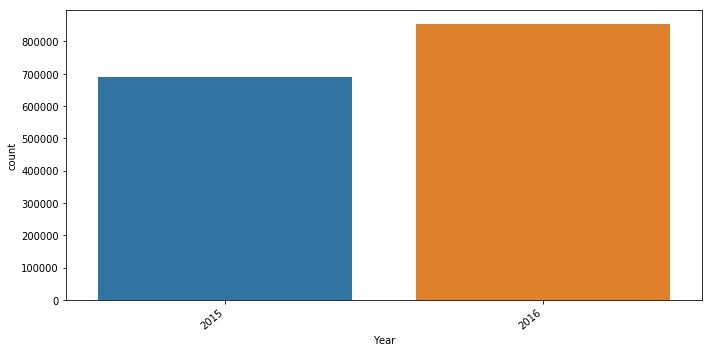

In [6]:
#Plotting Count plot to find count of entries in 2015 and 2016.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

fig = plt.figure(figsize = (10,5))
ax = sns.countplot(x="Year", data=df_ce)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

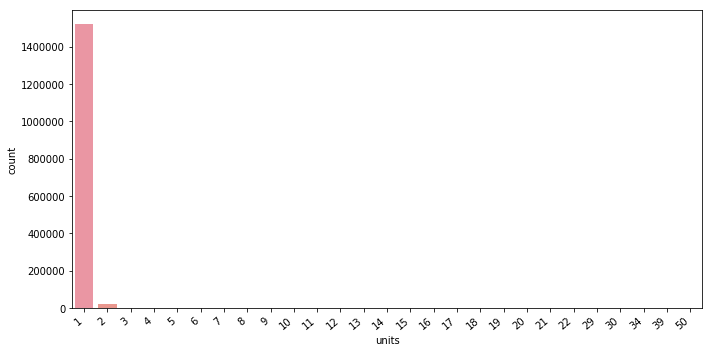

In [7]:
#Plotting Count plot to find count of units in 2015 and 2016.
fig = plt.figure(figsize = (10,5))
ax = sns.countplot(x="units", data=df_ce)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

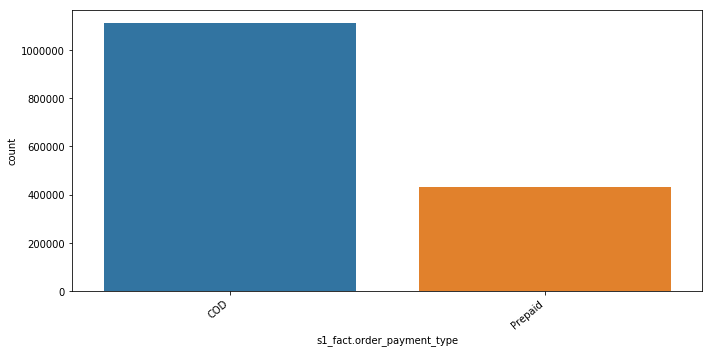

In [8]:
#Plotting Count plot to find count of payment type of prepaid or COD in 2015 and 2016.
fig = plt.figure(figsize = (10,5))
ax = sns.countplot(x="s1_fact.order_payment_type", data=df_ce)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

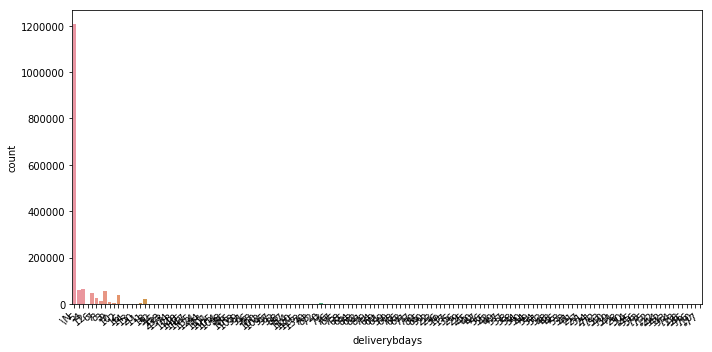

In [9]:
#Plotting Count plot to find count of delieverybdays in 2015 and 2016.
fig = plt.figure(figsize = (10,5))
ax = sns.countplot(x="deliverybdays", data=df_ce)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

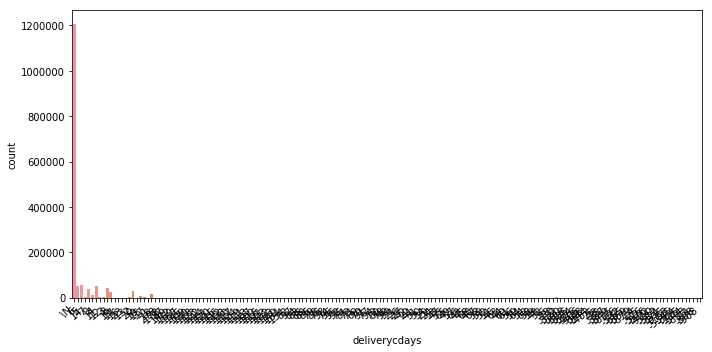

In [10]:
#Plotting Count plot to find count of delieverycdays in 2015 and 2016.
fig = plt.figure(figsize = (10,5))
ax = sns.countplot(x="deliverycdays", data=df_ce)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

### Data cleaning and Preparation 

In [11]:
# Based on the above graphs - columns units,deliverybdays,deliverycdays can be dropped
df_ce = df_ce.drop(['units','deliverybdays','deliverycdays'], axis=1)

In [12]:
#Drop irrelevant columns like MRP and order_item_id
df_ce = df_ce.drop(['product_mrp','order_item_id'], axis=1)

In [13]:
df_ce.shape

(1543981, 15)

In [14]:
# Find number of rows with cust_id as null
(df_ce['cust_id'].values == ' ').sum()

4038

In [15]:
df_ce = df_ce[df_ce['cust_id'] != ' ']

In [16]:
df_ce.shape

(1539943, 15)

In [17]:
#Convert order_date to timedate 
df_ce['order_date'] =  pd.to_datetime(df_ce['order_date'], format='%Y-%m-%d %H:%M:%S.%f')

In [18]:
df_ce['day'] = pd.DatetimeIndex(df_ce['order_date']).day

In [19]:
#create a new column "day" with day extracted from order_date column
df_ce['day'] = pd.DatetimeIndex(df_ce['order_date']).day

In [20]:
#Adding column as 'payday' in dataset df_ce as required by keep 1st and 15th of every month as flag value 1 else as 0.
df_ce['payday'] = np.where(((df_ce['day'] == 1)|(df_ce['day'] == 15)), 1, 0)

In [21]:
#Adding column as just_date by extracting date from order date timestamp
df_ce['just_date'] = df_ce['order_date'].dt.date

In [22]:
df_ce['just_date']

0          2015-10-17
1          2015-10-19
2          2015-10-20
3          2015-10-14
4          2015-10-17
5          2015-10-17
6          2015-10-16
7          2015-10-15
9          2015-10-25
10         2015-10-19
11         2015-10-06
12         2015-10-10
13         2015-10-13
14         2015-10-14
15         2015-10-15
16         2015-10-16
17         2015-10-16
18         2015-10-17
19         2015-10-15
20         2015-10-19
21         2015-10-10
22         2015-10-17
23         2015-10-17
24         2015-10-24
25         2015-10-16
26         2015-10-18
27         2015-10-28
28         2015-10-29
29         2015-10-30
30         2015-10-16
              ...    
1543967    2015-09-28
1543968    2015-09-01
1543969    2015-09-05
1543970    2015-09-12
1543971    2015-09-13
1543972    2015-09-29
1543973    2015-09-02
1543974    2015-09-10
1543975    2015-09-16
1543976    2015-09-21
1543977    2015-09-28
1543978    2015-09-03
1543979    2015-09-09
1543980    2015-09-13
1543981   

In [23]:
#Converting data column just_date to string type.
df_ce['just_date'] = df_ce['just_date'].astype('str')

#Replacing string '-' with space
df_ce['just_date'] = df_ce['just_date'].str.replace('-', '')
df_ce['just_date'] = pd.to_numeric(df_ce['just_date'], errors='coerce')

In [24]:
#Adding column 'special_sale' in dataset having flag values as 1 for special days of every month and 0 elsewhere. 
df_ce['special_sale']  = np.where(((df_ce['just_date'] ==  20150718)
                                   |(df_ce['just_date'] ==  20150719) 
                                   | (df_ce['just_date'] ==  20150815) 
                                   | (df_ce['just_date'] ==  20150816) 
                                   | (df_ce['just_date'] ==  20150817) 
                                   | (df_ce['just_date'] ==  20150828) 
                                   | (df_ce['just_date'] ==  20150829) 
                                   | (df_ce['just_date'] ==  20150830) 
                                   | (df_ce['just_date'] ==  20151015) 
                                   | (df_ce['just_date'] ==  20151016) 
                                   | (df_ce['just_date'] ==  20151017) 
                                   | (df_ce['just_date'] ==  20151107) 
                                   | (df_ce['just_date'] ==  20151108) 
                                   | (df_ce['just_date'] ==  20151109) 
                                   | (df_ce['just_date'] ==  20151110) 
                                   | (df_ce['just_date'] ==  20151111) 
                                   | (df_ce['just_date'] ==  20151112) 
                                   | (df_ce['just_date'] ==  20151113) 
                                   | (df_ce['just_date'] ==  20151114) 
                                   | (df_ce['just_date'] ==  20151225) 
                                   | (df_ce['just_date'] ==  20151226) 
                                   | (df_ce['just_date'] ==  20151227) 
                                   | (df_ce['just_date'] ==  20151228) 
                                   | (df_ce['just_date'] ==  20151229) 
                                   | (df_ce['just_date'] ==  20151230) 
                                   | (df_ce['just_date'] ==  20151231) 
                                   | (df_ce['just_date'] ==  20160101) 
                                   | (df_ce['just_date'] ==  20160102) 
                                   | (df_ce['just_date'] ==  20160103) 
                                   | (df_ce['just_date'] ==  20160120) 
                                   | (df_ce['just_date'] ==  20160121) 
                                   | (df_ce['just_date'] ==  20160122) 
                                   | (df_ce['just_date'] ==  20160201) 
                                   | (df_ce['just_date'] ==  20160202) 
                                   | (df_ce['just_date'] ==  20160220) 
                                   | (df_ce['just_date'] ==  20160221) 
                                   | (df_ce['just_date'] ==  20160214) 
                                   | (df_ce['just_date'] ==  20160215)
                                   | (df_ce['just_date'] ==  20160307) 
                                   | (df_ce['just_date'] ==  20160308) 
                                   | (df_ce['just_date'] ==  20160309) 
                                   | (df_ce['just_date'] ==  20160525) 
                                   | (df_ce['just_date'] ==  20160526)) , 1,0) 

In [25]:
df_ce.head()

,fsn_id,order_date,Year,Month,order_id,gmv,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_procurement_sla,day,payday,just_date,special_sale
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,6400,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,0,17,0,20151017,1
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,6900,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,0,19,0,20151019,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,1990,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,3,20,0,20151020,0
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,1690,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,3,14,0,20151014,0
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,1618,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,3,17,0,20151017,1


As we have to build the model weekly basis. Lets create the column of week number in the data and then groupy based on the week number to get the dataset.

In [26]:
#create a week_of_year column
df_ce['week_of_year'] = df_ce.order_date.apply(lambda x: x.weekofyear)

In [27]:
#sneak ppeak into for week 50 data
df_ce[df_ce['week_of_year']==50]

,fsn_id,order_date,Year,Month,order_id,gmv,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_procurement_sla,day,payday,just_date,special_sale,week_of_year
235509,ACCDYFXFK2X8Y3RZ,2015-12-07 19:06:28,2015,12,2.455851e+15,320,Prepaid,6,-2.88620156800546E+018,-6.57163828779004E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,3,7,0,20151207,0,50
236863,ACCDZ98S5JRC2GFF,2015-12-12 10:38:32,2015,12,1.454926e+15,519,COD,9,-5.49103322571584E+018,-3.39888912590074E+017,CE,EntertainmentSmall,Speaker,MobileSpeaker,2,12,0,20151212,0,50
240468,ACCE2YA8VYDCYK9Q,2015-12-12 15:02:35,2015,12,3.452031e+15,330,COD,8,-1.70963317513979E+018,7.64074546601001E+018,CE,GamingHardware,GamingAccessory,GamePad,3,12,0,20151212,0,50
251330,ACCE6VGHYKYFX4WB,2015-12-12 11:35:42,2015,12,1.449368e+15,129,Prepaid,4,4.43563517462885E+017,-7.16738776335047E+018,CE,EntertainmentSmall,Speaker,LaptopSpeaker,-1,12,0,20151212,0,50
260072,ACCE6VGHYKYFX4WB,2015-12-08 22:18:40,2015,12,3.456711e+15,179,Prepaid,4,-3.50978135900462E+018,-5.72639003440197E+018,CE,EntertainmentSmall,Speaker,LaptopSpeaker,-1,8,0,20151208,0,50
262327,ACCE88HQZGXWM5TK,2015-12-11 12:08:27,2015,12,4.457398e+15,280,COD,7,4.54587314145968E+018,-7.58104632763564E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,4,11,0,20151211,0,50
289015,ACCECYHH4QDNZXEX,2015-12-12 19:37:32,2015,12,4.455706e+15,340,COD,12,4.73523045945166E+018,-1.91841695031552E+018,CE,GamingHardware,GamingAccessory,GamingHeadset,2,12,0,20151212,0,50
332076,SELDXMC3JNMTQMGV,2015-12-12 16:04:04,2015,12,1.454829e+15,2689,COD,3,3.70439047536559E+018,4.86730653163784E+018,CE,EntertainmentSmall,TVVideoSmall,SelectorBox,3,12,0,20151212,0,50
333988,VGLDYHTMGTG5Z2Q9,2015-12-07 11:48:33,2015,12,3.456441e+15,179,COD,4,3.47393481544104E+018,4.36662083750524E+018,CE,EntertainmentSmall,TVVideoSmall,VideoGlasses,4,7,0,20151207,0,50
337627,ACCCX3S5AHMF55FV,2015-12-11 19:51:41,2015,12,3.466989e+15,1399,COD,4,-6.21583723321756E+018,2.07002248044862E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,3,11,0,20151211,0,50


In [28]:
df_ce.product_analytic_super_category.value_counts()

CE    1539943
Name: product_analytic_super_category, dtype: int64

DROP COLUMNS<br>
1.fsn_id<br>
2.order_date<br>
3.product_analytic_category<br>
4.product_analytic_super_category<br>
5.product_analytic_vertical<br>
6.day<br>
7.just_date

In [29]:
columnsToDelete = ['fsn_id','order_date','product_analytic_category','product_analytic_super_category','product_analytic_vertical'
      ,'day','just_date']

In [30]:
#use drop method to delete the columns
df_ce = df_ce.drop(columnsToDelete,axis=1)

In [31]:
df_ce.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1539943 entries, 0 to 1543996
Data columns (total 13 columns):
Year                             1539943 non-null int64
Month                            1539943 non-null int64
order_id                         1539943 non-null float64
gmv                              1539943 non-null object
s1_fact.order_payment_type       1539943 non-null object
sla                              1539943 non-null int64
cust_id                          1539943 non-null object
pincode                          1539943 non-null object
product_analytic_sub_category    1539943 non-null object
product_procurement_sla          1539943 non-null int64
payday                           1539943 non-null int32
special_sale                     1539943 non-null int32
week_of_year                     1539943 non-null int64
dtypes: float64(1), int32(2), int64(5), object(5)
memory usage: 152.7+ MB


#### Dummy variable encoding<br>
We will be creating encoded variable for `s1_fact.order_payment_type` 

In [32]:
# create dummy variables
dummy_payment = pd.get_dummies(df_ce['s1_fact.order_payment_type'])

In [33]:
#dummy dataframe shape
dummy_payment.shape

(1539943, 2)

In [34]:
# concatanation of dataset with dummy variable
df_ce = pd.concat([df_ce,dummy_payment],axis=1)

In [35]:
#head of resulatant df
df_ce.head()

,Year,Month,order_id,gmv,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_sub_category,product_procurement_sla,payday,special_sale,week_of_year,COD,Prepaid
0,2015,10,3.419301e+15,6400,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CameraAccessory,0,0,1,42,1,0
1,2015,10,1.420831e+15,6900,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CameraAccessory,0,0,0,43,1,0
2,2015,10,2.421913e+15,1990,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,3,0,0,43,1,0
3,2015,10,4.416592e+15,1690,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,3,0,0,42,0,1
4,2015,10,4.419525e+15,1618,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,3,0,1,42,0,1


In [36]:
# drop column s1_fact.order_payment_type
df_ce = df_ce.drop('s1_fact.order_payment_type',axis=1)

In [37]:
#Taking backup of original dataset
df_ce_bkup = df_ce

###  Outlier treatemnt
We use a inter quartile range for outlier treatment


In [38]:
df_ce.describe()

,Year,Month,order_id,sla,product_procurement_sla,payday,special_sale,week_of_year,COD,Prepaid
count,1.539943e+06,1.539943e+06,1.539943e+06,1.539943e+06,1.539943e+06,1.539943e+06,1.539943e+06,1.539943e+06,1.539943e+06,1.539943e+06
mean,2.015555e+03,6.414358e+00,2.837448e+15,5.683679e+00,5.349608e+00,6.616933e-02,1.853452e-01,2.658907e+01,7.217917e-01,2.782083e-01
std,4.969476e-01,3.688592e+00,1.285645e+15,2.993378e+00,5.297957e+01,2.485779e-01,3.885775e-01,1.643233e+01,4.481167e-01,4.481167e-01
min,2.015000e+03,1.000000e+00,7.633152e+07,0.000000e+00,-1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,2.015000e+03,3.000000e+00,1.596819e+15,4.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.200000e+01,0.000000e+00,0.000000e+00
50%,2.016000e+03,6.000000e+00,2.610051e+15,6.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,2.300000e+01,1.000000e+00,0.000000e+00
75%,2.016000e+03,1.000000e+01,3.615705e+15,7.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,4.200000e+01,1.000000e+00,1.000000e+00
max,2.016000e+03,1.200000e+01,5.395077e+15,1.006000e+03,1.000000e+03,1.000000e+00,1.000000e+00,5.300000e+01,1.000000e+00,1.000000e+00


In [39]:
#change the data type of GMV tp float
df_ce.gmv = df_ce.gmv.astype(float)

In [40]:
#IQR of GMV variabel
Q1 = df_ce.gmv.quantile(0.25)
Q3 = df_ce.gmv.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

1659.0


In [41]:
#get the 1.5 times range of IQR
df_ce = df_ce[~((df_ce['gmv'] < (Q1 - 1.5 * IQR)) |(df_ce['gmv'] > (Q3 + 1.5 * IQR)))]

In [42]:
print(df_ce.shape)

(1387735, 14)


In [43]:
print((len(df_ce.index)/len(df_ce_bkup.index))*100)

90.11599779991857


Consumer electronics data is cleaned. 
Import the media file.
## Media and other information

Read media investment sheet from `Media data and other information.xlsx` excel.

In [44]:
#import the file
df_media = pd.read_excel('Media data and other information.xlsx', sheet_name = 'Media Investment', skiprows=2) 

In [45]:
#head of the data
df_media.head()

,Unnamed: 0,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,NaN,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,NaN,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,NaN,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,NaN,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [46]:
#columns of the Media Investment
df_media.columns

Index(['Unnamed: 0', 'Year', 'Month', 'Total Investment', 'TV', 'Digital',
       'Sponsorship', 'Content Marketing', 'Online marketing', ' Affiliates',
       'SEM', 'Radio', 'Other'],
      dtype='object')

In [47]:
#Rename the column names for understanding
df_media.rename(columns={'Content Marketing':'ContentM',
                         'Online marketing':'OnlineM',
                         ' Affiliates':'Affiliates',
                        }, 
                 inplace=True)

In [48]:
df_media.head()

,Unnamed: 0,Year,Month,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other
0,NaN,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,NaN,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,NaN,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,NaN,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,NaN,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [49]:
#convert all the data to numeric data
df_media = df_media.convert_objects(convert_numeric=True)

In [50]:
#see the info
df_media.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 13 columns):
Unnamed: 0          0 non-null float64
Year                12 non-null int64
Month               12 non-null int64
Total Investment    12 non-null float64
TV                  12 non-null float64
Digital             12 non-null float64
Sponsorship         12 non-null float64
ContentM            12 non-null float64
OnlineM             12 non-null float64
Affiliates          12 non-null float64
SEM                 12 non-null float64
Radio               3 non-null float64
Other               3 non-null float64
dtypes: float64(11), int64(2)
memory usage: 1.3 KB


In [51]:
#drop the `unmamed: 0` column
df_media = df_media.drop('Unnamed: 0',axis=1)

In [52]:
#head of the dataframe
df_media.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


### MONTHLY NPS AND STOCK INDEX
import nps and stock index data from media data and other investment excel file

In [53]:
#import the data
df_nps = pd.read_excel('Media data and other information.xlsx', sheet_name = 'Monthly NPS Score', skiprows=1) 

In [54]:
#see the head
df_nps.head()

,Unnamed: 0,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [55]:
#Drop all the null values
df_nps.dropna(how='any') 

,Unnamed: 0,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


Above data is in tabular form where month data are in columns. To understand the data better and keep it in sync with other data frames, we will use melt function and transform the data where dates are in columns.

In [56]:
#Transform the data.
df_nps = df_nps.melt(id_vars=["Unnamed: 0"], 
        var_name="Date", 
        value_name="Value")

In [57]:
# see the head
df_nps.head()

,Unnamed: 0,Date,Value
0,NPS,July'15,54.599588
1,Stock Index,July'15,1177.000000
2,NPS,Aug'15,59.987101
3,Stock Index,Aug'15,1206.000000
4,NPS,Sept'15,46.925419


In [58]:
#change the Unnamed column to `Type`
df_nps.rename(columns={'Unnamed: 0':'Type'}, inplace=True)

In [59]:
#see the data
df_nps

,Type,Date,Value
0,NPS,July'15,54.599588
1,Stock Index,July'15,1177.000000
2,NPS,Aug'15,59.987101
3,Stock Index,Aug'15,1206.000000
4,NPS,Sept'15,46.925419
5,Stock Index,Sept'15,1101.000000
6,NPS,Oct'15,44.398389
7,Stock Index,Oct'15,1210.000000
8,NPS,Nov'15,47.000000
9,Stock Index,Nov'15,1233.000000


    We need to extract the month year from the Date` column, we will first split function to get the Month and Year and then transform the month and year to represent in similar format

In [60]:
#create a column Year
df_nps['Year']= df_nps['Date'].apply(lambda x: x.split("'")[1])

In [61]:
#create a month column
df_nps['Month']= df_nps.Date.apply(lambda x: x.split("'")[0])

In [62]:
df_nps

,Type,Date,Value,Year,Month
0,NPS,July'15,54.599588,15,July
1,Stock Index,July'15,1177.000000,15,July
2,NPS,Aug'15,59.987101,15,Aug
3,Stock Index,Aug'15,1206.000000,15,Aug
4,NPS,Sept'15,46.925419,15,Sept
5,Stock Index,Sept'15,1101.000000,15,Sept
6,NPS,Oct'15,44.398389,15,Oct
7,Stock Index,Oct'15,1210.000000,15,Oct
8,NPS,Nov'15,47.000000,15,Nov
9,Stock Index,Nov'15,1233.000000,15,Nov


In [63]:
#sort the data based on Month and year
df_nps.sort_values(by=['Year','Month'])

,Type,Date,Value,Year,Month
2,NPS,Aug'15,59.987101,15,Aug
3,Stock Index,Aug'15,1206.000000,15,Aug
10,NPS,Dec'15,45.800000,15,Dec
11,Stock Index,Dec'15,1038.000000,15,Dec
0,NPS,July'15,54.599588,15,July
1,Stock Index,July'15,1177.000000,15,July
8,NPS,Nov'15,47.000000,15,Nov
9,Stock Index,Nov'15,1233.000000,15,Nov
6,NPS,Oct'15,44.398389,15,Oct
7,Stock Index,Oct'15,1210.000000,15,Oct


    Create two dataframe each for NPS and Stock

In [64]:
#Extract Stock index information and create new DataFrame
df_si = df_nps[df_nps['Type']== 'Stock Index']

In [65]:
#Extract NPS information and create new DataFrame
df_nps = df_nps[df_nps['Type']== 'NPS']

In [66]:
#drop Type and Date Column
df_si = df_si.drop(['Type','Date'],axis=1)

In [67]:
df_si.columns

Index(['Value', 'Year', 'Month'], dtype='object')

In [68]:
#rename Value column to StockIndex
df_si.rename(columns={'Value':'StockIndex',
                         }, 
                 inplace=True)

Drop the columns for nps dataframe and rename the columns

In [69]:
df_nps = df_nps.drop(['Type','Date'],axis=1)
df_nps.rename(columns={'Value':'NPS',
                         }, 
                 inplace=True)

In [70]:
df_nps.head()

,NPS,Year,Month
0,54.599588,15,July
2,59.987101,15,Aug
4,46.925419,15,Sept
6,44.398389,15,Oct
8,47.000000,15,Nov


Month name is coming in string format. Map it to correspong numerical representation

In [71]:
mapMonth = {'July':7, 'Aug':8, 'Sept':9, 'Oct':10, 'Nov':11, 'Dec':12,'Jan':1, 'Feb':2, 'Mar':3,'Apr':4, 'May':5, 'June':6}

In [72]:
#map for nps
df_nps.Month = df_nps.Month.map(mapMonth)

In [73]:
#map for Stock Index
df_si.Month = df_si.Month.map(mapMonth)

In [74]:
# change data type for merge
df_nps.Month = df_nps.Month.astype(int)
df_nps.Year = df_nps.Year.astype(int)
df_si.Month = df_si.Month.astype(int)
df_si.Year = df_si.Year.astype(int)

    Merge NPS and SI dataframes to form a single dataframe

In [75]:
#merge on Year and Month
df_nps_si = pd.merge(df_nps,df_si, on=['Year','Month'])

In [76]:
df_nps_si

,NPS,Year,Month,StockIndex
0,54.599588,15,7,1177.0
1,59.987101,15,8,1206.0
2,46.925419,15,9,1101.0
3,44.398389,15,10,1210.0
4,47.000000,15,11,1233.0
5,45.800000,15,12,1038.0
6,47.093031,16,1,1052.0
7,50.327406,16,2,1222.0
8,49.020550,16,3,1015.0
9,51.827605,16,4,1242.0


Convert the year to 2015 and 2016 for 15 and 16

In [77]:
#create a map
mapYear = {15:2015, 16:2016}

In [78]:
#convert the data
df_nps_si.Year = df_nps_si.Year.map(mapYear)

In [79]:
df_nps_si.columns

Index(['NPS', 'Year', 'Month', 'StockIndex'], dtype='object')

# WEATHER
    Data for weather in Ontoria is given for 2015 and 2016. Lets import the data.

In [80]:
# Reading the files into data frames
df_w15 = pd.read_csv('ONTARIO-2015.csv', skiprows=24) 
df_w16 = pd.read_csv('ONTARIO-2016.csv', skiprows=24)  

In [81]:
print(df_w15.shape)
#print(df_w16.shape)

(365, 27)


In [82]:
#info
df_w15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 27 columns):
Date/Time                    365 non-null object
Year                         365 non-null int64
Month                        365 non-null int64
Day                          365 non-null int64
Data Quality                 229 non-null object
Max Temp (°C)                216 non-null float64
Max Temp Flag                13 non-null object
Min Temp (°C)                190 non-null float64
Min Temp Flag                39 non-null object
Mean Temp (°C)               190 non-null float64
Mean Temp Flag               39 non-null object
Heat Deg Days (°C)           190 non-null float64
Heat Deg Days Flag           39 non-null object
Cool Deg Days (°C)           190 non-null float64
Cool Deg Days Flag           39 non-null object
Total Rain (mm)              229 non-null float64
Total Rain Flag              7 non-null object
Total Snow (cm)              229 non-null float64
Total Snow Flag 

In [83]:
#info
df_w16.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 27 columns):
Date/Time                    366 non-null object
Year                         366 non-null int64
Month                        366 non-null int64
Day                          366 non-null int64
Data Quality                 227 non-null object
Max Temp (°C)                226 non-null float64
Max Temp Flag                1 non-null object
Min Temp (°C)                219 non-null float64
Min Temp Flag                8 non-null object
Mean Temp (°C)               219 non-null float64
Mean Temp Flag               8 non-null object
Heat Deg Days (°C)           219 non-null float64
Heat Deg Days Flag           8 non-null object
Cool Deg Days (°C)           219 non-null float64
Cool Deg Days Flag           8 non-null object
Total Rain (mm)              227 non-null float64
Total Rain Flag              3 non-null object
Total Snow (cm)              227 non-null float64
Total Snow Flag      

Drop the columns which have more null values

In [84]:
# drop columns
drp_col = ['Date/Time','Spd of Max Gust Flag','Spd of Max Gust (km/h)','Dir of Max Gust Flag','Dir of Max Gust (10s deg)'
          ,'Snow on Grnd Flag','Snow on Grnd (cm)','Total Precip Flag','Total Precip (mm)','Total Snow Flag',
           'Cool Deg Days Flag','Cool Deg Days (°C)','Heat Deg Days Flag','Heat Deg Days (°C)','Mean Temp Flag',
           'Min Temp (°C)','Min Temp Flag','Max Temp (°C)','Max Temp Flag','Data Quality','Day','Total Rain Flag'
          ]

In [85]:
#drop columns for 2015 weather data
df_w15.drop(drp_col,axis=1,inplace=True)

In [86]:
#drop columns for 2016 weather data
df_w16.drop(drp_col,axis=1,inplace=True)

In [87]:
print(df_w15.shape)
print(df_w16.shape)

(365, 5)
(366, 5)


In [88]:
df_w15

,Year,Month,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,2015,1,-4.3,0.0,0.0
1,2015,1,0.0,0.0,0.0
2,2015,1,-0.8,24.0,0.0
3,2015,1,1.3,0.0,1.0
4,2015,1,-11.8,0.0,3.0
5,2015,1,NaN,NaN,NaN
6,2015,1,NaN,NaN,NaN
7,2015,1,NaN,NaN,NaN
8,2015,1,-10.5,0.0,0.0
9,2015,1,NaN,0.0,0.0


In [89]:
df_w16

,Year,Month,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,2016,1,NaN,NaN,NaN
1,2016,1,NaN,NaN,NaN
2,2016,1,NaN,NaN,NaN
3,2016,1,NaN,NaN,NaN
4,2016,1,NaN,NaN,NaN
5,2016,1,NaN,NaN,NaN
6,2016,1,NaN,NaN,NaN
7,2016,1,-3.5,9.0,0.0
8,2016,1,7.0,14.6,0.0
9,2016,1,-3.3,0.0,7.0


<B>CONCATENATE WEATHER 2015 AND WEATHER 2016</B>
     <br>To make a single Dataframe

In [90]:
#concat the weather dataframe
df_weather = pd.concat([df_w16,df_w15],axis=0)

In [91]:
df_weather.shape

(731, 5)


    In this analysis we will be focusing on 3 subcategories of the products `Camera`, 'home audio` and `gaming` <br>
    Lets divide consumer electronics dataset based in 3 subcategories of the products, and merge media information and weather information in all the dataset

## Camera 

In [92]:
#get the camera accessory subcategory products
df_camera = df_ce[df_ce.product_analytic_sub_category == "CameraAccessory"]

In [93]:
df_camera.shape

(209850, 14)

As we can see there are 209850 records with 14 features

In [94]:
df_camera.head()

,Year,Month,order_id,gmv,sla,cust_id,pincode,product_analytic_sub_category,product_procurement_sla,payday,special_sale,week_of_year,COD,Prepaid
2,2015,10,2.421913e+15,1990.0,10,-1.0404429420466E+018,-7.47768776228657E+018,CameraAccessory,3,0,0,43,1,0
3,2015,10,4.416592e+15,1690.0,4,-7.60496084352714E+018,-5.83593163877661E+018,CameraAccessory,3,0,0,42,0,1
4,2015,10,4.419525e+15,1618.0,6,2.8945572083453E+018,5.34735360997242E+017,CameraAccessory,3,0,1,42,0,1
5,2015,10,3.419189e+15,3324.0,5,-7.64154636189174E+018,-1.91905269756031E+018,CameraAccessory,5,0,1,42,0,1
6,2015,10,3.418429e+15,3695.0,6,-7.15614041481066E+016,6.40491320207757E+018,CameraAccessory,5,0,1,42,0,1


In [95]:
#See the info of this dataframe
df_camera.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 209850 entries, 2 to 1540215
Data columns (total 14 columns):
Year                             209850 non-null int64
Month                            209850 non-null int64
order_id                         209850 non-null float64
gmv                              209850 non-null float64
sla                              209850 non-null int64
cust_id                          209850 non-null object
pincode                          209850 non-null object
product_analytic_sub_category    209850 non-null object
product_procurement_sla          209850 non-null int64
payday                           209850 non-null int32
special_sale                     209850 non-null int32
week_of_year                     209850 non-null int64
COD                              209850 non-null uint8
Prepaid                          209850 non-null uint8
dtypes: float64(2), int32(2), int64(5), object(3), uint8(2)
memory usage: 19.6+ MB


In [96]:
df_camera['week_of_year'].nunique()

52

Model has to be built on weekly basis and we can see there are 52 unique weeks.

    To achieve this, we will group the all the columns on weekly basis.

#### GMV

In [97]:
#groupby gmv on on weekly basis and aggregate on sum
week_gmv = df_camera.groupby(['week_of_year'])['gmv'].sum()

In [98]:
week_gmv.shape

(52,)

we see 52 records. It shows total GMV per week <br>
<b>Payment type COD

In [99]:
#aggregate COD with sum
week_cod = df_camera.groupby(['week_of_year'])['COD'].sum()

It shows total number of COD payment orders per week

<b>PAYMENT TYPE: Prepaid </b>

In [100]:
#aggregate COD with sum
week_prepaid = df_camera.groupby(['week_of_year'])['Prepaid'].sum()

It shows total number of prepaid payment orders per week

<b>SLA</b>

In [101]:
#groupby SLA and aggregate with mean
week_SLA = df_camera.groupby(['week_of_year'])['sla'].mean()

average number of days its takes to procure product

<B> CUSTOMER ID </B>

In [102]:
#groupby customer Id and aggregate by quantity
week_cust_id = df_camera.groupby(['week_of_year'])['cust_id'].count()

<B> PIN CODE </B>

In [103]:
#aggregate count of unique pincode count per week
week_pin = df_camera.groupby(['week_of_year']).agg({"pincode": pd.Series.nunique})

In [104]:
week_pin.shape

(52, 1)

<B> PAY DAY </B>

In [105]:
#if any week day is a payday in a week, we will consider the week as payday
week_pay = df_camera.groupby(['week_of_year'])['payday'].max()

<B> SPECIAL SALE </B>

In [106]:
#week is a special sale week if any day was a special sale
week_sale = df_camera.groupby(['week_of_year'])['special_sale'].max()

<b>MONTH</B>

In [107]:
#choose the month of the week
week_month = df_camera.groupby(['week_of_year'])['Month'].max()

<b>YEAR</B>

In [108]:
#choose the month of the record
week_year = df_camera.groupby(['week_of_year'])['Year'].max()

### COMBINING ALL DATA FRAMES

In [109]:
#concat the groupby objects to one dataframe
df = pd.concat([week_sale,week_pay,week_pin,week_cust_id,week_SLA,week_prepaid,week_cod,week_gmv,week_month,week_year],axis=1)

In [110]:
df

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year
week_of_year,,,,,,,,,,
1,0,0,2092,5187,5.912281,960.0,4227.0,2.953704e+06,1,2016
2,0,1,1790,3756,6.657082,781.0,2975.0,2.303565e+06,1,2016
3,1,0,2034,4864,6.434622,1119.0,3745.0,2.910452e+06,1,2016
4,0,0,1645,3428,6.636523,697.0,2731.0,2.396554e+06,1,2016
5,1,1,2158,5427,6.347337,1107.0,4320.0,3.105386e+06,2,2016
6,1,0,1704,3749,6.355561,833.0,2916.0,2.442499e+06,2,2016
7,1,1,2223,6299,6.332275,1305.0,4994.0,3.531718e+06,2,2016
8,0,0,2211,5563,6.319432,1025.0,4538.0,3.014240e+06,2,2016
9,0,1,2118,5216,6.151265,1148.0,4068.0,2.849464e+06,3,2016


We got final dataframe with weekly data

In [111]:
#change the index to week
df['week'] = df.index

In [112]:
df.shape

(52, 11)

In [113]:
#info of resultant dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 1 to 53
Data columns (total 11 columns):
special_sale    52 non-null int32
payday          52 non-null int32
pincode         52 non-null int64
cust_id         52 non-null int64
sla             52 non-null float64
Prepaid         52 non-null float64
COD             52 non-null float64
gmv             52 non-null float64
Month           52 non-null int64
Year            52 non-null int64
week            52 non-null int64
dtypes: float64(4), int32(2), int64(5)
memory usage: 4.5 KB


In [114]:
# Data for 53rd week updated. It was displaying 2016 12
df[df['week']==53]

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week
week_of_year,,,,,,,,,,,
53,1,1,2077,4095,6.147253,896.0,3199.0,2759237.0,12,2016,53


In [115]:
#change the 53rd week to 1st month
df['Month'] = np.where(((df['Year'] == 2016)&(df['Month'] == 12)), 1, df['Month'])

In [116]:
df[df['week']==53]

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week
week_of_year,,,,,,,,,,,
53,1,1,2077,4095,6.147253,896.0,3199.0,2759237.0,1,2016,53


### merge with media file

In [117]:
df_media.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [118]:
#merge media file and camera weekly file based on year and month
df_camera_final = pd.merge(df, df_media, on=['Year','Month'], how='left') #reh gya

In [119]:
#info
df_camera_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 21 columns):
special_sale        52 non-null int32
payday              52 non-null int32
pincode             52 non-null int64
cust_id             52 non-null int64
sla                 52 non-null float64
Prepaid             52 non-null float64
COD                 52 non-null float64
gmv                 52 non-null float64
Month               52 non-null int64
Year                52 non-null int64
week                52 non-null int64
Total Investment    49 non-null float64
TV                  49 non-null float64
Digital             49 non-null float64
Sponsorship         49 non-null float64
ContentM            49 non-null float64
OnlineM             49 non-null float64
Affiliates          49 non-null float64
SEM                 49 non-null float64
Radio               14 non-null float64
Other               14 non-null float64
dtypes: float64(14), int32(2), int64(5)
memory usage: 8.5 KB


In [120]:
#rename Total investment to Total
df_camera_final.rename(columns={'Total Investment':'Total',
                        }, 
                 inplace=True)

In [121]:
#fill the na with 0
df_camera_final[['Radio','Other','SEM','Affiliates','OnlineM','ContentM','Sponsorship','Digital','TV','Total'
                ]] = df_camera_final[['Radio','Other','SEM','Affiliates','OnlineM','ContentM','Sponsorship','Digital','TV','Total']].fillna(0)


In [122]:
#info
df_camera_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 21 columns):
special_sale    52 non-null int32
payday          52 non-null int32
pincode         52 non-null int64
cust_id         52 non-null int64
sla             52 non-null float64
Prepaid         52 non-null float64
COD             52 non-null float64
gmv             52 non-null float64
Month           52 non-null int64
Year            52 non-null int64
week            52 non-null int64
Total           52 non-null float64
TV              52 non-null float64
Digital         52 non-null float64
Sponsorship     52 non-null float64
ContentM        52 non-null float64
OnlineM         52 non-null float64
Affiliates      52 non-null float64
SEM             52 non-null float64
Radio           52 non-null float64
Other           52 non-null float64
dtypes: float64(14), int32(2), int64(5)
memory usage: 8.5 KB


In [123]:
df_camera_final[['Radio','Other','SEM','Affiliates','OnlineM','ContentM','Sponsorship','Digital','TV','Total','week','Month','Year']]

,Radio,Other,SEM,Affiliates,OnlineM,ContentM,Sponsorship,Digital,TV,Total,week,Month,Year
0,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,1,1,2016
1,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,2,1,2016
2,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,3,1,2016
3,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,4,1,2016
4,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,5,2,2016
5,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,6,2,2016
6,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,7,2,2016
7,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,8,2,2016
8,0.87,15.945545,5.193591,6.217667,18.437818,0.370000,41.590000,2.100000,9.300000,100.024621,9,3,2016
9,0.87,15.945545,5.193591,6.217667,18.437818,0.370000,41.590000,2.100000,9.300000,100.024621,10,3,2016


We can see the data is imputed with 0 where null were present

In [124]:
count_week = df_camera_final.groupby(['Year','Month'])['week'].count()

In [125]:
count_week

Year  Month
2015  7        2
      8        4
      9        4
      10       4
      11       5
      12       4
2016  1        5
      2        4
      3        4
      4        4
      5        5
      6        4
      7        3
Name: week, dtype: int64

In [126]:
#convert above series to dataframe
count_week = pd.DataFrame(data=count_week)

In [127]:
#merge above dataframe to get the count of weeks in a month, we will use this to distribute the monthly allocation of budget
#to weekly data
df_camera_final = pd.merge(df_camera_final, count_week, on=['Year','Month'], how='left')

In [128]:
df_camera_final.head()

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,...,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,week_y
0,0,0,2092,5187,5.912281,960.0,4227.0,2953704.0,1,2016,...,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,2.7,27.09,5
1,0,1,1790,3756,6.657082,781.0,2975.0,2303565.0,1,2016,...,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,2.7,27.09,5
2,1,0,2034,4864,6.434622,1119.0,3745.0,2910452.0,1,2016,...,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,2.7,27.09,5
3,0,0,1645,3428,6.636523,697.0,2731.0,2396554.0,1,2016,...,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.20000,2.7,27.09,5
4,1,1,2158,5427,6.347337,1107.0,4320.0,3105386.0,2,2016,...,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.87363,0.0,0.00,4


In the media dataframe, we have monthly budget allocation. we will divide respective budget with number of weeks in that month.
Also we total budget for media is allocated for all the subcatergories, we will get the share for respective subcategories. <br>
For camera, total share was 0.1 percent, hence we will multipy the share with 0.001

In [129]:
df_camera_final['TV'] = (df_camera_final['TV']/df_camera_final['week_y'])*0.001
df_camera_final['Digital'] = (df_camera_final['Digital']/df_camera_final['week_y'])*0.001
df_camera_final['Sponsorship'] = (df_camera_final['Sponsorship']/df_camera_final['week_y'])*0.001
df_camera_final['ContentM'] = (df_camera_final['ContentM']/df_camera_final['week_y'])*0.001
df_camera_final['OnlineM'] = (df_camera_final['OnlineM']/df_camera_final['week_y'])*0.001
df_camera_final['Affiliates'] = (df_camera_final['Affiliates']/df_camera_final['week_y'])*0.001
df_camera_final['SEM'] = (df_camera_final['SEM']/df_camera_final['week_y'])*0.001
df_camera_final['Radio'] = (df_camera_final['Radio']/df_camera_final['week_y'])*0.001
df_camera_final['Other'] = (df_camera_final['Other']/df_camera_final['week_y'])*0.001

In [130]:
df_camera_final.shape

(52, 22)

In [131]:
df_camera_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 22 columns):
special_sale    52 non-null int32
payday          52 non-null int32
pincode         52 non-null int64
cust_id         52 non-null int64
sla             52 non-null float64
Prepaid         52 non-null float64
COD             52 non-null float64
gmv             52 non-null float64
Month           52 non-null int64
Year            52 non-null int64
week_x          52 non-null int64
Total           52 non-null float64
TV              52 non-null float64
Digital         52 non-null float64
Sponsorship     52 non-null float64
ContentM        52 non-null float64
OnlineM         52 non-null float64
Affiliates      52 non-null float64
SEM             52 non-null float64
Radio           52 non-null float64
Other           52 non-null float64
week_y          52 non-null int64
dtypes: float64(14), int32(2), int64(6)
memory usage: 8.9 KB


    Merge nps and stock index information to above dataframe.

In [132]:
#see the columns
df_nps_si.columns

Index(['NPS', 'Year', 'Month', 'StockIndex'], dtype='object')

In [133]:
# checking the data types of both the dataframes
print(df_nps_si.info())
print(df_camera_final.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12 entries, 0 to 11
Data columns (total 4 columns):
NPS           12 non-null float64
Year          12 non-null int64
Month         12 non-null int32
StockIndex    12 non-null float64
dtypes: float64(2), int32(1), int64(1)
memory usage: 432.0 bytes
None
<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 22 columns):
special_sale    52 non-null int32
payday          52 non-null int32
pincode         52 non-null int64
cust_id         52 non-null int64
sla             52 non-null float64
Prepaid         52 non-null float64
COD             52 non-null float64
gmv             52 non-null float64
Month           52 non-null int64
Year            52 non-null int64
week_x          52 non-null int64
Total           52 non-null float64
TV              52 non-null float64
Digital         52 non-null float64
Sponsorship     52 non-null float64
ContentM        52 non-null float64
OnlineM         52 non-null flo

In [134]:
#merge above dataframes on year and month
df_camera_ = pd.merge(df_camera_final, df_nps_si, on=['Year','Month'],how='left')

In [135]:
#look the final resultant dataframe
df_camera_

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,...,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,week_y,NPS,StockIndex
0,0,0,2092,5187,5.912281,960.0,4227.0,2.953704e+06,1,2016,...,0.000840,1.800000e-04,0.004580,0.001474,0.000840,0.000540,0.005418,5,47.093031,1052.0
1,0,1,1790,3756,6.657082,781.0,2975.0,2.303565e+06,1,2016,...,0.000840,1.800000e-04,0.004580,0.001474,0.000840,0.000540,0.005418,5,47.093031,1052.0
2,1,0,2034,4864,6.434622,1119.0,3745.0,2.910452e+06,1,2016,...,0.000840,1.800000e-04,0.004580,0.001474,0.000840,0.000540,0.005418,5,47.093031,1052.0
3,0,0,1645,3428,6.636523,697.0,2731.0,2.396554e+06,1,2016,...,0.000840,1.800000e-04,0.004580,0.001474,0.000840,0.000540,0.005418,5,47.093031,1052.0
4,1,1,2158,5427,6.347337,1107.0,4320.0,3.105386e+06,2,2016,...,0.002931,1.491927e-04,0.004973,0.001616,0.001218,0.000000,0.000000,4,50.327406,1222.0
5,1,0,1704,3749,6.355561,833.0,2916.0,2.442499e+06,2,2016,...,0.002931,1.491927e-04,0.004973,0.001616,0.001218,0.000000,0.000000,4,50.327406,1222.0
6,1,1,2223,6299,6.332275,1305.0,4994.0,3.531718e+06,2,2016,...,0.002931,1.491927e-04,0.004973,0.001616,0.001218,0.000000,0.000000,4,50.327406,1222.0
7,0,0,2211,5563,6.319432,1025.0,4538.0,3.014240e+06,2,2016,...,0.002931,1.491927e-04,0.004973,0.001616,0.001218,0.000000,0.000000,4,50.327406,1222.0
8,0,1,2118,5216,6.151265,1148.0,4068.0,2.849464e+06,3,2016,...,0.010397,9.250000e-05,0.004609,0.001554,0.001298,0.000218,0.003986,4,49.020550,1015.0
9,1,0,2130,5536,6.119762,1450.0,4086.0,3.180978e+06,3,2016,...,0.010397,9.250000e-05,0.004609,0.001554,0.001298,0.000218,0.003986,4,49.020550,1015.0


In [136]:
pd.set_option('display.max_columns', 100)

    Drop the week_y column and change week_x name to week

In [137]:
df_camera_.drop(['week_y'],axis=1,inplace=True)
df_camera_ = df_camera_.rename(columns = {"week_x": "week"})   

In [138]:
df_camera_.head()

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex
0,0,0,2092,5187,5.912281,960.0,4227.0,2953704.0,1,2016,1,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0
1,0,1,1790,3756,6.657082,781.0,2975.0,2303565.0,1,2016,2,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0
2,1,0,2034,4864,6.434622,1119.0,3745.0,2910452.0,1,2016,3,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0
3,0,0,1645,3428,6.636523,697.0,2731.0,2396554.0,1,2016,4,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0
4,1,1,2158,5427,6.347337,1107.0,4320.0,3105386.0,2,2016,5,48.052,0.000647,0.000478,0.002931,0.000149,0.004973,0.001616,0.001218,0.00000,0.000000,50.327406,1222.0


    Merge the weather dataframe to above dataframe.

In [139]:
df_weather.head()

,Year,Month,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,2016,1,NaN,NaN,NaN
1,2016,1,NaN,NaN,NaN
2,2016,1,NaN,NaN,NaN
3,2016,1,NaN,NaN,NaN
4,2016,1,NaN,NaN,NaN


In [140]:
# creating a week month mapping table
df_week_month = df

In [141]:
df_week_month.head()

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week
week_of_year,,,,,,,,,,,
1,0,0,2092,5187,5.912281,960.0,4227.0,2953704.0,1,2016,1
2,0,1,1790,3756,6.657082,781.0,2975.0,2303565.0,1,2016,2
3,1,0,2034,4864,6.434622,1119.0,3745.0,2910452.0,1,2016,3
4,0,0,1645,3428,6.636523,697.0,2731.0,2396554.0,1,2016,4
5,1,1,2158,5427,6.347337,1107.0,4320.0,3105386.0,2,2016,5


In [142]:
#remove other columns and year month column
df_week_month.drop(['special_sale','payday','pincode','cust_id','sla','Prepaid','COD','gmv'],axis=1, inplace=True)

In [143]:
df_week_month

,Month,Year,week
week_of_year,,,
1,1,2016,1
2,1,2016,2
3,1,2016,3
4,1,2016,4
5,2,2016,5
6,2,2016,6
7,2,2016,7
8,2,2016,8
9,3,2016,9


We will aggregate weather information on month and year and them merge the dataset with week_month mapping information to get the weekly information in the dataframe

# AGGREGATE FUNCTIONS FOR WEATHER


<B>MEAN TEMP</B>

In [144]:
#aggregate on mean for mean_temp
df_temp = df_weather.groupby(['Year','Month'])['Mean Temp (°C)'].mean()

<B>MEAN RAIN</B>

In [145]:
#aggregate rain with mean
df_rain = df_weather.groupby(['Year','Month'])['Total Rain (mm)'].mean()

<B>MEAN SNOW</B>

In [146]:
#aggregate on snow
df_snow = df_weather.groupby(['Year','Month'])['Total Snow (cm)'].mean()

In [147]:
print(df_temp.shape)
print(df_rain.shape)
print(df_snow.shape)

(24,)
(24,)
(24,)


In [148]:
#concat above dataframes to get one dataframe
df_agg = pd.concat([df_temp,df_rain,df_snow],axis=1)

In [149]:
df_agg

Mean Temp (°C)  Total Rain (mm)  Total Snow (cm)
Year Month                                                  
2015 1           -5.218182         1.575000         0.562500
     2           -8.866667         0.200000         2.142857
     3            0.562500         0.166667         0.055556
     4            9.233333         1.840000         0.000000
     5           18.228571         6.533333         0.000000
     6           20.372000         6.232000         0.000000
     7           21.976923         1.492593         0.000000
     8           22.915789         3.580000         0.000000
     9           20.913333         3.518182         0.000000
     10          14.980000         0.888889         0.000000
     11           9.861538         3.485714         0.714286
     12           5.410000         2.885714         0.000000
2016 1           -1.828571         3.120000         0.700000
     2            0.566667         2.769231         1.076923
     3            7.238889         5.390476         0.333333
     4            7.931579         1.463158         0.315789
     5           16.158824         1.800000         0.000000
     6           22.145000         1.110000         0.000000
     7           25.156522         4.434783         0.000000
     8           24.641667         3.816667         0.000000
     9           20.325000         5.310000         0.000000
     10          13.683333         2.137500         0.000000
     11           7.941176         2.694118         0.000000
     12          -0.827778         1.357895         1.368421

<B> ADDING WEEK BY MERGING WITH WEEK MAPPING TABLE</B>

In [150]:
#merge the dataframe
df_we_final = pd.merge(df_week_month,df_agg, how='inner',on=['Year','Month'])

In [151]:
df_we_final.sort_values(by='week')

,Month,Year,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,1,2016,1,-1.828571,3.120000,0.700000
1,1,2016,2,-1.828571,3.120000,0.700000
2,1,2016,3,-1.828571,3.120000,0.700000
3,1,2016,4,-1.828571,3.120000,0.700000
5,2,2016,5,0.566667,2.769231,1.076923
6,2,2016,6,0.566667,2.769231,1.076923
7,2,2016,7,0.566667,2.769231,1.076923
8,2,2016,8,0.566667,2.769231,1.076923
9,3,2016,9,7.238889,5.390476,0.333333
10,3,2016,10,7.238889,5.390476,0.333333


<b> MERGE WEATHER WITH CAMERA </B>

In [152]:
#merge weather file and camera on week column
df_final_cam = pd.merge(df_camera_, df_we_final,how='inner',on=['week'])

In [153]:
print(df_final_cam.shape)

(52, 28)


In [154]:
df_final_cam.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 28 columns):
special_sale       52 non-null int32
payday             52 non-null int32
pincode            52 non-null int64
cust_id            52 non-null int64
sla                52 non-null float64
Prepaid            52 non-null float64
COD                52 non-null float64
gmv                52 non-null float64
Month_x            52 non-null int64
Year_x             52 non-null int64
week               52 non-null int64
Total              52 non-null float64
TV                 52 non-null float64
Digital            52 non-null float64
Sponsorship        52 non-null float64
ContentM           52 non-null float64
OnlineM            52 non-null float64
Affiliates         52 non-null float64
SEM                52 non-null float64
Radio              52 non-null float64
Other              52 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Month_y       

In [155]:
#drop redundant data
df_final_cam.drop(['Month_x','Year_x','Month_y','Year_y'],axis=1,inplace=True)

In [156]:
df_final_cam.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 24 columns):
special_sale       52 non-null int32
payday             52 non-null int32
pincode            52 non-null int64
cust_id            52 non-null int64
sla                52 non-null float64
Prepaid            52 non-null float64
COD                52 non-null float64
gmv                52 non-null float64
week               52 non-null int64
Total              52 non-null float64
TV                 52 non-null float64
Digital            52 non-null float64
Sponsorship        52 non-null float64
ContentM           52 non-null float64
OnlineM            52 non-null float64
Affiliates         52 non-null float64
SEM                52 non-null float64
Radio              52 non-null float64
Other              52 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Mean Temp (°C)     52 non-null float64
Total Rain (mm)    52 non-null float64
Total Snow

In [157]:
# Checking the percentage of missing values
round(100*(df_final_cam.isnull().sum()/len(df_final_cam.index)), 2)

special_sale       0.00
payday             0.00
pincode            0.00
cust_id            0.00
sla                0.00
Prepaid            0.00
COD                0.00
gmv                0.00
week               0.00
Total              0.00
TV                 0.00
Digital            0.00
Sponsorship        0.00
ContentM           0.00
OnlineM            0.00
Affiliates         0.00
SEM                0.00
Radio              0.00
Other              0.00
NPS                5.77
StockIndex         5.77
Mean Temp (°C)     0.00
Total Rain (mm)    0.00
Total Snow (cm)    0.00
dtype: float64

Drop the null values

In [158]:
#df_final_cam[df_final_cam['TV']== pd.null]
df_final_cam = df_final_cam.dropna() 

### checking correlation 

In [159]:
#import visualization libraries
import seaborn as sns
from matplotlib import pyplot as plt

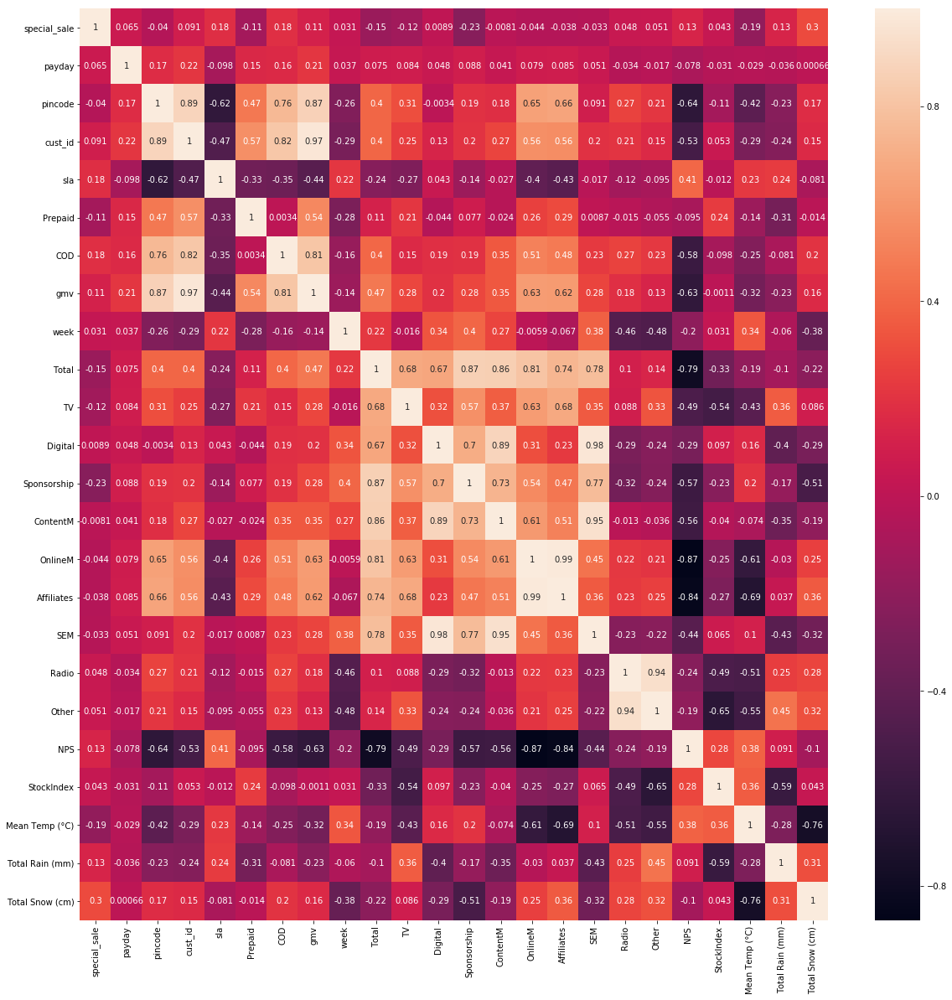

In [160]:
#plot the heatmap which shows correlation on all the variables
plt.figure(figsize=(20,20))
sns.heatmap(df_final_cam.corr(), annot=True)
plt.show()

In [161]:
#cust_id is highly correlated with gmv, we will drop the variable
df_final_cam = df_final_cam.drop(['cust_id'],axis=1)

In [162]:
df_final_cam.shape

(49, 23)

In [163]:
df_b = df_final_cam

# Model building for camera

## Linear model

<b>Scaling

In [164]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [165]:
# import sikit learn
from sklearn.model_selection import train_test_split

In [166]:
# divide data into train and test
df_train,df_test = train_test_split(df_final_cam,train_size=0.7,test_size=0.3,random_state=True)

In [167]:
print(df_train.shape)
print(df_test.shape)

(34, 23)
(15, 23)


In [168]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = df_train.columns

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

num_vars

Index(['special_sale', 'payday', 'pincode', 'sla', 'Prepaid', 'COD', 'gmv',
       'week', 'Total', 'TV', 'Digital', 'Sponsorship', 'ContentM', 'OnlineM',
       'Affiliates', 'SEM', 'Radio', 'Other', 'NPS', 'StockIndex',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')

In [169]:
#get the dependent and independent variables
y_train = df_train.pop('gmv')
x_train = df_train

    Feature selection

In [170]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [171]:
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)

In [172]:
list(zip(x_train.columns,rfe.support_,rfe.ranking_))

[('special_sale', False, 12),
 ('payday', False, 13),
 ('pincode', True, 1),
 ('sla', False, 5),
 ('Prepaid', True, 1),
 ('COD', True, 1),
 ('week', True, 1),
 ('Total', False, 6),
 ('TV', False, 11),
 ('Digital', False, 4),
 ('Sponsorship', True, 1),
 ('ContentM', True, 1),
 ('OnlineM', False, 7),
 ('Affiliates', False, 10),
 ('SEM', True, 1),
 ('Radio', False, 2),
 ('Other', True, 1),
 ('NPS', True, 1),
 ('StockIndex', True, 1),
 ('Mean Temp (°C)', False, 8),
 ('Total Rain (mm)', False, 9),
 ('Total Snow (cm)', False, 3)]

In [173]:
#selected columns after RFE
col = x_train.columns[rfe.support_]
col

Index(['pincode', 'Prepaid', 'COD', 'week', 'Sponsorship', 'ContentM', 'SEM',
       'Other', 'NPS', 'StockIndex'],
      dtype='object')

In [174]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]

In [175]:
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)

In [176]:
lm = sm.OLS(y_train,x_train_rfe).fit()   # Running the linear model

In [177]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.991
Method:                 Least Squares   F-statistic:                     348.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.21e-22
Time:                        23:14:52   Log-Likelihood:                 100.43
No. Observations:                  34   AIC:                            -178.9
Df Residuals:                      23   BIC:                            -162.1
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.4036      0.053      7.666      

In [178]:
x_train_new = x_train_rfe.drop(["week"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model

In [179]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     352.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.89e-23
Time:                        23:14:53   Log-Likelihood:                 98.149
No. Observations:                  34   AIC:                            -176.3
Df Residuals:                      24   BIC:                            -161.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.3237      0.030     10.651      

In [180]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,121.80
5,ContentM,13.65
6,SEM,11.89
1,pincode,6.84
4,Sponsorship,6.20
9,StockIndex,5.77
3,COD,5.33
7,Other,4.16
2,Prepaid,4.01
8,NPS,3.64


In [181]:
x_train_new2 = x_train_new.drop(["ContentM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new2)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     314.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.06e-23
Time:                        23:14:53   Log-Likelihood:                 93.524
No. Observations:                  34   AIC:                            -169.0
Df Residuals:                      25   BIC:                            -155.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.3145      0.034      9.275      

In [182]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new2
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,120.30
1,pincode,6.65
4,Sponsorship,6.17
8,StockIndex,5.57
3,COD,5.07
2,Prepaid,4.00
6,Other,3.82
5,SEM,3.52
7,NPS,2.85


    Residual analysis

In [183]:
y_train_gmv = lm.predict(x_train_new2)

In [184]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

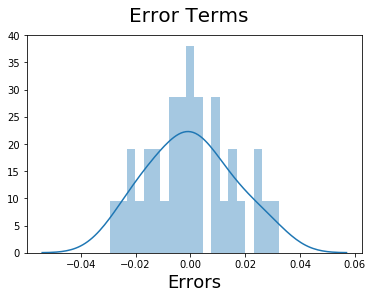

In [185]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

Error terms are normally distributed

    Making prediction

In [186]:
#scale the test data
num_vars = df_test.columns
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [187]:
#get the dependent and independent variables from test dataframe
y_test = df_test.pop('gmv')
X_test = df_test

In [188]:
x_train_new2.drop('const',axis=1,inplace=True)

In [189]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new2.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [190]:
# Making predictions
y_pred = lm.predict(X_test_new)

    Model evaluation

Text(0,0.5,'y_pred')

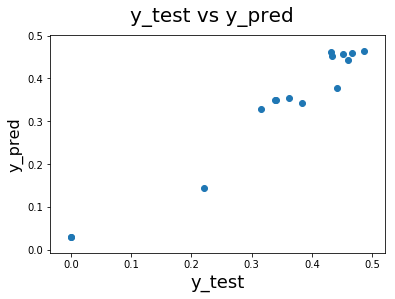

In [191]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)  

<b>RMSE

In [192]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))

In [193]:
print(rms)

0.03274227873279506


<B>2. RIDGE REGRESSION TO CHECK FOR REGULARIZATION</B>

In [194]:
#import the librarry and have ridge object on different alpha
from sklearn.linear_model import Ridge
rr100 = Ridge(alpha=100)
rr = Ridge(alpha=0.01)
rr10 = Ridge(alpha=10)

In [195]:
#fit on 3 ridge objects
rr100.fit(x_train_new2, y_train)
rr.fit(x_train_new2, y_train)
rr10.fit(x_train_new2, y_train)

Ridge(alpha=10, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001)

In [196]:
Ridge_train_score100 = rr100.score(x_train_new2,y_train)
Ridge_train_score = rr.score(x_train_new2,y_train)
Ridge_train_score10 = rr10.score(x_train_new2,y_train)
#Ridge_test_score100 = rr100.score(X_test_new, y_test)
#print the result score
print(Ridge_train_score100)
print(Ridge_train_score10)
print(Ridge_train_score)

0.05320692740087418
0.3684338964720083
0.9893316054469555


In [197]:
x_test = X_test_new.drop('const',axis=1)

In [198]:
Ridge_test_score100 = rr100.score(x_test,y_test)
Ridge_test_score = rr.score(x_test,y_test)
Ridge_test_score10 = rr10.score(x_test,y_test)

In [199]:
print(Ridge_test_score100)
print(Ridge_test_score10)
print(Ridge_test_score)

-0.31327310421641985
0.2124274059979191
0.9548236325890835


## 3. Lag model for camera

In [200]:
#backup for final camera dataframe
df_final_cam2 = df_final_cam

In [201]:
#head
df_final_cam2.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,2092,5.912281,960.0,4227.0,2953704.0,1,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
1,0,1,1790,6.657082,781.0,2975.0,2303565.0,2,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
2,1,0,2034,6.434622,1119.0,3745.0,2910452.0,3,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
3,0,0,1645,6.636523,697.0,2731.0,2396554.0,4,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
4,1,1,2158,6.347337,1107.0,4320.0,3105386.0,5,48.052,0.000647,0.000478,0.002931,0.000149,0.004973,0.001616,0.001218,0.00000,0.000000,50.327406,1222.0,0.566667,2.769231,1.076923


In [202]:
df_final_cam2.shape

(49, 23)

In [203]:
df_week_month

,Month,Year,week
week_of_year,,,
1,1,2016,1
2,1,2016,2
3,1,2016,3
4,1,2016,4
5,2,2016,5
6,2,2016,6
7,2,2016,7
8,2,2016,8
9,3,2016,9


In [204]:
# Change the data type to add two digits for Month
df_week_month.week = df_week_month.week.astype(str).str.zfill(2)
df_week_month.Year = df_week_month.Year.astype(str)

In [205]:
#see the result
df_week_month

,Month,Year,week
week_of_year,,,
1,1,2016,01
2,1,2016,02
3,1,2016,03
4,1,2016,04
5,2,2016,05
6,2,2016,06
7,2,2016,07
8,2,2016,08
9,3,2016,09


In [206]:
# Change the data type back to int
df_week_month['YearWeek'] = df_week_month['Year']+df_week_month['week']

In [207]:
df_week_month.week = df_week_month.week.astype(int)
df_week_month.YearWeek = df_week_month.YearWeek.astype(int)

In [208]:
#merge week data to final dataframe
df_cam_lag = pd.merge(df_final_cam2,df_week_month,how='inner',on=['week'])

In [209]:
#info
df_cam_lag.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 48
Data columns (total 26 columns):
special_sale       49 non-null int32
payday             49 non-null int32
pincode            49 non-null int64
sla                49 non-null float64
Prepaid            49 non-null float64
COD                49 non-null float64
gmv                49 non-null float64
week               49 non-null int64
Total              49 non-null float64
TV                 49 non-null float64
Digital            49 non-null float64
Sponsorship        49 non-null float64
ContentM           49 non-null float64
OnlineM            49 non-null float64
Affiliates         49 non-null float64
SEM                49 non-null float64
Radio              49 non-null float64
Other              49 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Mean Temp (°C)     49 non-null float64
Total Rain (mm)    49 non-null float64
Total Snow (cm)    49 non-null float64
Month   

In [210]:
#drop the columns
df_cam_lag.drop(['week','Month','Year','Total'],axis=1,inplace=True)

In [211]:
df_cam_lag.sort_values(by='YearWeek')

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm),YearWeek
25,1,1,1293,6.579142,994.0,1988.0,2.115010e+06,0.000108,0.001267,0.003707,4.664488e-07,0.000664,0.000274,0.002512,0.000000,0.000000,54.599588,1177.0,21.976923,1.492593,0.000000,201529
26,0,0,1337,6.582406,940.0,2027.0,2.017231e+06,0.000108,0.001267,0.003707,4.664488e-07,0.000664,0.000274,0.002512,0.000000,0.000000,54.599588,1177.0,21.976923,1.492593,0.000000,201530
27,0,0,1035,6.522101,553.0,1370.0,1.382567e+06,0.000002,0.000320,0.000266,1.581283e-09,0.000032,0.000018,0.000628,0.000000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201531
28,0,0,4,9.250000,3.0,1.0,2.198000e+03,0.000002,0.000320,0.000266,1.581283e-09,0.000032,0.000018,0.000628,0.000000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201532
29,1,1,1,6.000000,0.0,1.0,2.990000e+02,0.000002,0.000320,0.000266,1.581283e-09,0.000032,0.000018,0.000628,0.000000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201533
30,1,0,3,10.333333,2.0,1.0,1.190000e+03,0.000002,0.000320,0.000266,1.581283e-09,0.000032,0.000018,0.000628,0.000000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201535
31,0,1,1342,6.646303,833.0,2048.0,1.969115e+06,0.000970,0.000339,0.015697,1.525730e-04,0.004095,0.001260,0.001551,0.000000,0.000000,46.925419,1101.0,20.913333,3.518182,0.000000,201536
32,0,0,1375,6.488796,997.0,2350.0,2.404233e+06,0.000970,0.000339,0.015697,1.525730e-04,0.004095,0.001260,0.001551,0.000000,0.000000,46.925419,1101.0,20.913333,3.518182,0.000000,201537
33,0,1,1361,6.821077,882.0,2164.0,2.160134e+06,0.000970,0.000339,0.015697,1.525730e-04,0.004095,0.001260,0.001551,0.000000,0.000000,46.925419,1101.0,20.913333,3.518182,0.000000,201538
34,0,0,1390,6.381013,845.0,2273.0,2.115434e+06,0.000970,0.000339,0.015697,1.525730e-04,0.004095,0.001260,0.001551,0.000000,0.000000,46.925419,1101.0,20.913333,3.518182,0.000000,201539


    One week lag model

Use pandas shift method to create one week lag model

In [212]:
#one week lag dataframe
df_cam_lag_1wk = df_cam_lag.set_index(["YearWeek"]).shift(1)

In [213]:
#head
df_cam_lag_1wk.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
YearWeek,,,,,,,,,,,,,,,,,,,,,
201601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201602,0.0,0.0,2092.0,5.912281,960.0,4227.0,2953704.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201603,0.0,1.0,1790.0,6.657082,781.0,2975.0,2303565.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201604,1.0,0.0,2034.0,6.434622,1119.0,3745.0,2910452.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201605,0.0,0.0,1645.0,6.636523,697.0,2731.0,2396554.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7


In [214]:
#head
df_cam_lag.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm),YearWeek
0,0,0,2092,5.912281,960.0,4227.0,2953704.0,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,201601
1,0,1,1790,6.657082,781.0,2975.0,2303565.0,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,201602
2,1,0,2034,6.434622,1119.0,3745.0,2910452.0,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,201603
3,0,0,1645,6.636523,697.0,2731.0,2396554.0,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,201604
4,1,1,2158,6.347337,1107.0,4320.0,3105386.0,0.000647,0.000478,0.002931,0.000149,0.004973,0.001616,0.001218,0.00000,0.000000,50.327406,1222.0,0.566667,2.769231,1.076923,201605


For the lag model, we will merge the lagged dataframe to the original dataframe

In [215]:
#merge
df_cam_lag_1wk_final = pd.merge(df_cam_lag,df_cam_lag_1wk,how='inner',on=['YearWeek'],suffixes=['_Current','_Previous'])

In [216]:
df_cam_lag_1wk_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 48
Data columns (total 43 columns):
special_sale_Current        49 non-null int32
payday_Current              49 non-null int32
pincode_Current             49 non-null int64
sla_Current                 49 non-null float64
Prepaid_Current             49 non-null float64
COD_Current                 49 non-null float64
gmv_Current                 49 non-null float64
TV_Current                  49 non-null float64
Digital_Current             49 non-null float64
Sponsorship_Current         49 non-null float64
ContentM_Current            49 non-null float64
OnlineM_Current             49 non-null float64
Affiliates_Current          49 non-null float64
SEM_Current                 49 non-null float64
Radio_Current               49 non-null float64
Other_Current               49 non-null float64
NPS_Current                 49 non-null float64
StockIndex_Current          49 non-null float64
Mean Temp (°C)_Current      49 non-null

In [217]:
#shape
df_cam_lag_1wk_final.shape

(49, 43)

In [218]:
#drop the null values
df_cam_lag_1wk_final = df_cam_lag_1wk_final.dropna() 

In [219]:
#drop previous weeks gmv(lagged)
df_cam_lag_1wk_final.drop('gmv_Previous',axis=1,inplace=True)

In [220]:
#shape of final lag df
df_cam_lag_1wk_final.shape

(48, 42)

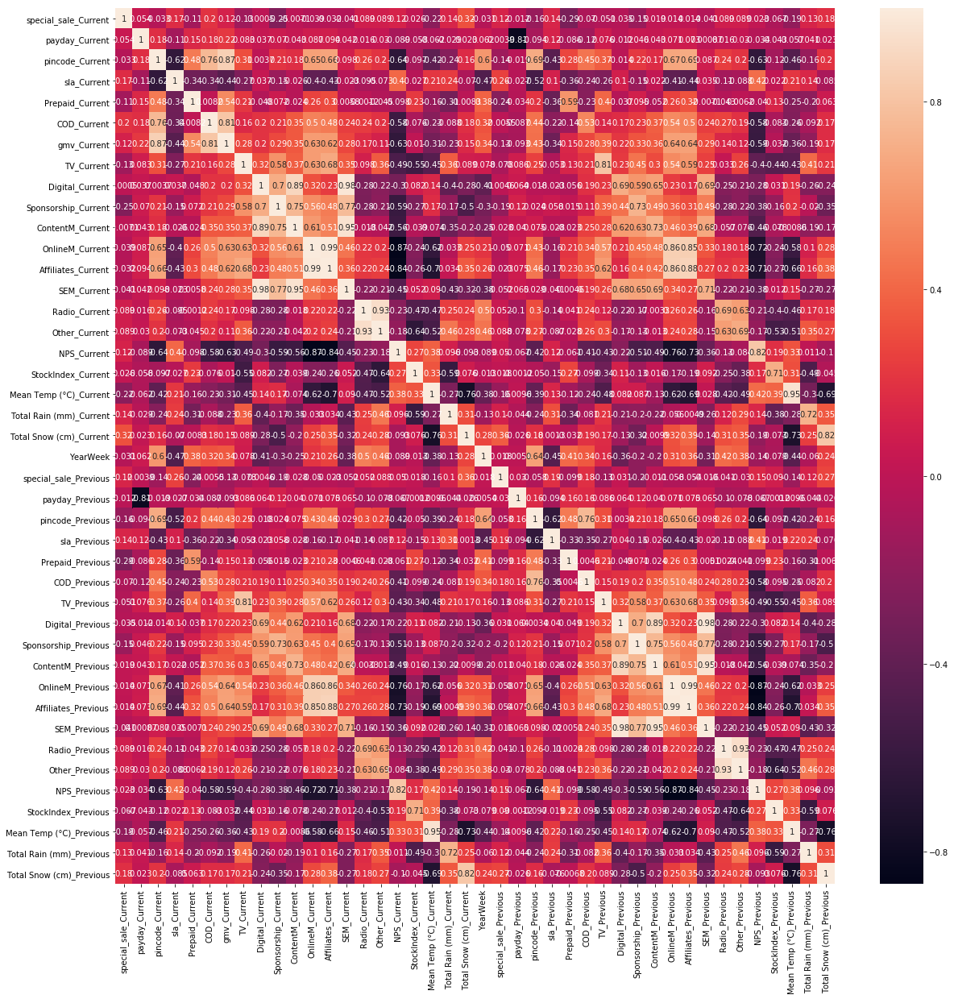

In [221]:
#CHECK FOR MULTICOLLINEARITY
plt.figure(figsize=(20,20))
sns.heatmap(df_cam_lag_1wk_final.corr(), annot=True)
plt.show()

In [222]:
#drop pincode current
df_cam_lag_1wk_final.drop(['pincode_Current'],axis=1,inplace=True)

Now we will make a linear model on lag dataframe

In [223]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()


In [224]:
# import sikit learn
from sklearn.model_selection import train_test_split
# divide data into train and test
df_train_lg1,df_test_lg1 = train_test_split(df_cam_lag_1wk_final,train_size=0.7,test_size=0.3,random_state=True)

In [225]:
print(df_train_lg1.shape)
print(df_test_lg1.shape)

(33, 41)
(15, 41)


In [226]:
num_vars = df_train_lg1.columns

df_train_lg1[num_vars] = scaler.fit_transform(df_train_lg1[num_vars])

In [227]:
#get the dependent and independent variable
y_train = df_train_lg1.pop('gmv_Current')
x_train = df_train_lg1

    Feature selection

In [228]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [229]:
rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]

In [230]:
#selected columns
col

Index(['Prepaid_Current', 'COD_Current', 'SEM_Current', 'YearWeek',
       'Digital_Previous', 'Sponsorship_Previous', 'OnlineM_Previous',
       'Affiliates_Previous', 'Radio_Previous', 'Other_Previous'],
      dtype='object')

In [231]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     132.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.92e-17
Time:                        23:15:18   Log-Likelihood:                 83.501
No. Observations:                  33   AIC:                            -145.0
Df Residuals:                      22   BIC:                            -128.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.0429 

In [232]:
x_train_new = x_train_rfe.drop(["Sponsorship_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     150.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.84e-18
Time:                        23:15:18   Log-Likelihood:                 83.172
No. Observations:                  33   AIC:                            -146.3
Df Residuals:                      23   BIC:                            -131.4
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0478    

In [233]:
#drop other_previous as its p-value is more
x_train_new2 = x_train_new.drop(["Other_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new2)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     174.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.35e-19
Time:                        23:15:18   Log-Likelihood:                 82.984
No. Observations:                  33   AIC:                            -148.0
Df Residuals:                      24   BIC:                            -134.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0503    

In [234]:
#drop Radio_previous as its p-value is More
x_train_new3 = x_train_new2.drop(["Radio_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new3)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     203.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.00e-20
Time:                        23:15:19   Log-Likelihood:                 82.652
No. Observations:                  33   AIC:                            -149.3
Df Residuals:                      25   BIC:                            -137.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0508    

In [235]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new3
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,OnlineM_Previous,59.71
7,Affiliates_Previous,52.46
3,SEM_Current,17.57
0,const,13.84
5,Digital_Previous,12.55
4,YearWeek,3.10
1,Prepaid_Current,2.34
2,COD_Current,1.86


In [236]:
#drop onlineM_previous as its VIF is highest
x_train_new4 = x_train_new3.drop(["OnlineM_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new4)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                     208.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.07e-20
Time:                        23:15:19   Log-Likelihood:                 79.879
No. Observations:                  33   AIC:                            -145.8
Df Residuals:                      26   BIC:                            -135.3
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0583    

In [237]:
#drop SEM_Current as its p-value is more
x_train_new5 = x_train_new4.drop(["SEM_Current"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new5)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                     246.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.26e-21
Time:                        23:15:19   Log-Likelihood:                 79.021
No. Observations:                  33   AIC:                            -146.0
Df Residuals:                      27   BIC:                            -137.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0581    

In [238]:
#drop Digital_Previous as its p-values is less
x_train_new6 = x_train_new5.drop(["Digital_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new6)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     298.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.62e-22
Time:                        23:15:19   Log-Likelihood:                 77.952
No. Observations:                  33   AIC:                            -145.9
Df Residuals:                      28   BIC:                            -138.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.0554    

In [239]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new6
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,12.80
3,YearWeek,1.91
1,Prepaid_Current,1.86
2,COD_Current,1.79
4,Affiliates_Previous,1.34


    Residual Analysis of the train data

In [240]:
#predict
y_train_gmv = lm.predict(x_train_new6)

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

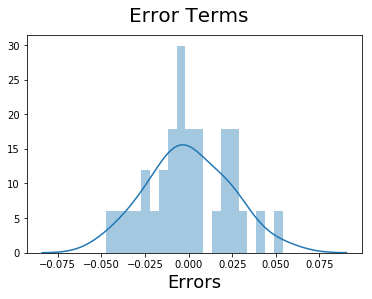

In [241]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)    

    Prediction

In [242]:
num_vars = df_test_lg1.columns
df_test_lg1[num_vars] = scaler.transform(df_test_lg1[num_vars])
y_test = df_test_lg1.pop('gmv_Current')
X_test = df_test_lg1
x_train_new6.drop('const',axis=1,inplace=True)

In [243]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new6.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [244]:
# Making predictions
y_pred = lm.predict(X_test_new)

Text(0,0.5,'y_pred')

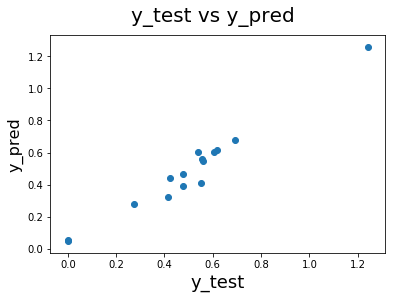

In [245]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16) 

In [246]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))

In [247]:
print(rms)

0.05501261929225375


# Two week Lag
Create a lag for 2 weeks by using pandas shift function

In [248]:
#2week lag
df_cam_lag2wk = df_cam_lag.set_index(["YearWeek"]).shift(2)

In [249]:
#one week lag
df_cam_lag1wk = df_cam_lag.set_index(["YearWeek"]).shift(1)

In [250]:
df_cam_lag2wk.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
YearWeek,,,,,,,,,,,,,,,,,,,,,
201601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201602,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201603,0.0,0.0,2092.0,5.912281,960.0,4227.0,2953704.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201604,0.0,1.0,1790.0,6.657082,781.0,2975.0,2303565.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201605,1.0,0.0,2034.0,6.434622,1119.0,3745.0,2910452.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7


In [251]:
df_cam_lag1wk.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
YearWeek,,,,,,,,,,,,,,,,,,,,,
201601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201602,0.0,0.0,2092.0,5.912281,960.0,4227.0,2953704.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201603,0.0,1.0,1790.0,6.657082,781.0,2975.0,2303565.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201604,1.0,0.0,2034.0,6.434622,1119.0,3745.0,2910452.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7
201605,0.0,0.0,1645.0,6.636523,697.0,2731.0,2396554.0,0.000876,0.000091,0.00084,0.00018,0.00458,0.001474,0.00084,0.00054,0.005418,47.093031,1052.0,-1.828571,3.12,0.7


In [252]:
#merge week one and week two lag together
df_lag_2 = pd.merge(df_cam_lag2wk,df_cam_lag1wk,how='inner',on=['YearWeek'],suffixes=['_2Previous','_1Previous'])

In [253]:
df_lag_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 201601 to 201653
Data columns (total 42 columns):
special_sale_2Previous       47 non-null float64
payday_2Previous             47 non-null float64
pincode_2Previous            47 non-null float64
sla_2Previous                47 non-null float64
Prepaid_2Previous            47 non-null float64
COD_2Previous                47 non-null float64
gmv_2Previous                47 non-null float64
TV_2Previous                 47 non-null float64
Digital_2Previous            47 non-null float64
Sponsorship_2Previous        47 non-null float64
ContentM_2Previous           47 non-null float64
OnlineM_2Previous            47 non-null float64
Affiliates_2Previous         47 non-null float64
SEM_2Previous                47 non-null float64
Radio_2Previous              47 non-null float64
Other_2Previous              47 non-null float64
NPS_2Previous                47 non-null float64
StockIndex_2Previous         47 non-null float64
Mean T

In [254]:
#merge above resultant df with original dataframe
df = pd.merge(df_cam_lag,df_lag_2,how='inner',on=['YearWeek'])

In [255]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 48
Data columns (total 64 columns):
special_sale                 49 non-null int32
payday                       49 non-null int32
pincode                      49 non-null int64
sla                          49 non-null float64
Prepaid                      49 non-null float64
COD                          49 non-null float64
gmv                          49 non-null float64
TV                           49 non-null float64
Digital                      49 non-null float64
Sponsorship                  49 non-null float64
ContentM                     49 non-null float64
OnlineM                      49 non-null float64
Affiliates                   49 non-null float64
SEM                          49 non-null float64
Radio                        49 non-null float64
Other                        49 non-null float64
NPS                          49 non-null float64
StockIndex                   49 non-null float64
Mean Temp (°C)       

In [256]:
#drop null values
df = df.dropna() 

In [257]:
#drop one week lag and week 2 lag's gmv(target) variabla
df.drop('gmv_1Previous',axis=1,inplace=True)
df.drop('gmv_2Previous',axis=1,inplace=True)

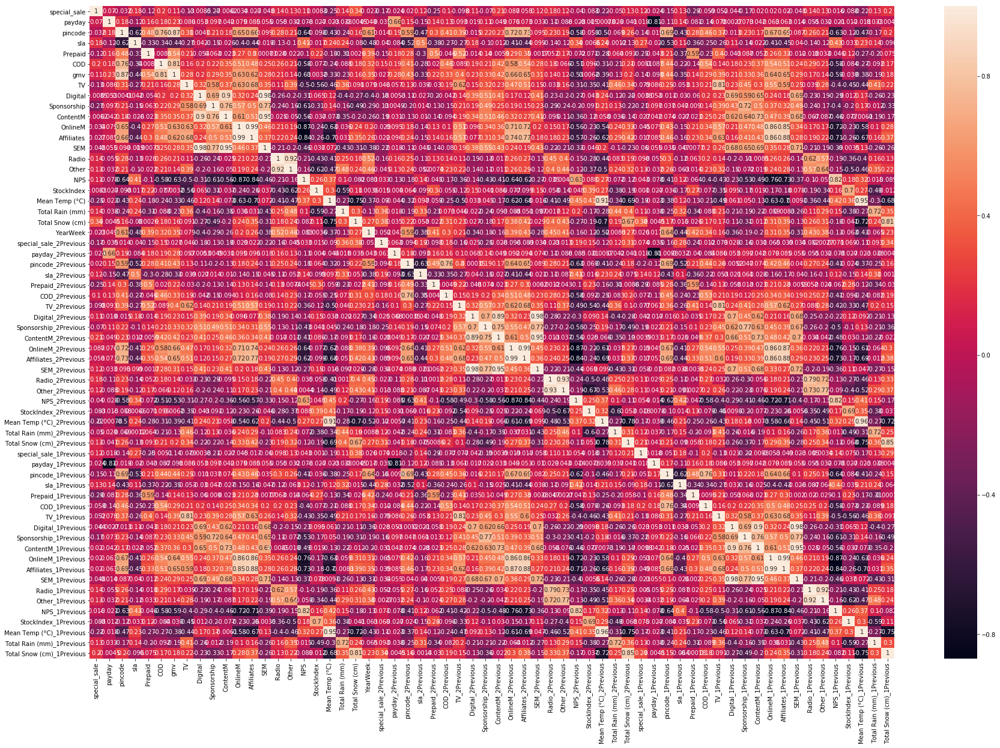

In [258]:
#CHECK FOR MULTICOLLINEARITY
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(), annot=True)
plt.show()

In [259]:
df.drop(['pincode'],axis=1,inplace=True)

# LINEAR MODEL

In [260]:
# import sikit learn
from sklearn.model_selection import train_test_split
# divide data into train and test
df_train,df_test = train_test_split(df,train_size=0.7,test_size=0.3,random_state=True)
print(df_train.shape)
print(df_test.shape)

(32, 61)
(15, 61)


In [261]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = df_train.columns
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
num_vars

Index(['special_sale', 'payday', 'sla', 'Prepaid', 'COD', 'gmv', 'TV',
       'Digital', 'Sponsorship', 'ContentM', 'OnlineM', 'Affiliates', 'SEM',
       'Radio', 'Other', 'NPS', 'StockIndex', 'Mean Temp (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'YearWeek',
       'special_sale_2Previous', 'payday_2Previous', 'pincode_2Previous',
       'sla_2Previous', 'Prepaid_2Previous', 'COD_2Previous', 'TV_2Previous',
       'Digital_2Previous', 'Sponsorship_2Previous', 'ContentM_2Previous',
       'OnlineM_2Previous', 'Affiliates_2Previous', 'SEM_2Previous',
       'Radio_2Previous', 'Other_2Previous', 'NPS_2Previous',
       'StockIndex_2Previous', 'Mean Temp (°C)_2Previous',
       'Total Rain (mm)_2Previous', 'Total Snow (cm)_2Previous',
       'special_sale_1Previous', 'payday_1Previous', 'pincode_1Previous',
       'sla_1Previous', 'Prepaid_1Previous', 'COD_1Previous', 'TV_1Previous',
       'Digital_1Previous', 'Sponsorship_1Previous', 'ContentM_1Previous',
       'OnlineM_1Previ

    Feature selection

In [262]:
#get the dependent and independent variable and run the model
y_train = df_train.pop('gmv')
x_train = df_train
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [263]:
rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]
col

Index(['Prepaid', 'COD', 'Radio', 'Other', 'Mean Temp (°C)', 'Total Rain (mm)',
       'COD_2Previous', 'Prepaid_1Previous', 'OnlineM_1Previous',
       'NPS_1Previous'],
      dtype='object')

In [264]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]

In [265]:
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     252.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.50e-19
Time:                        23:16:00   Log-Likelihood:                 85.752
No. Observations:                  32   AIC:                            -149.5
Df Residuals:                      21   BIC:                            -133.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2656      0.04

In [266]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_rfe
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,122.74
4,Other,15.43
3,Radio,11.14
9,OnlineM_1Previous,7.02
10,NPS_1Previous,5.02
6,Total Rain (mm),3.53
5,Mean Temp (°C),2.33
1,Prepaid,2.24
8,Prepaid_1Previous,2.18
2,COD,2.09


In [267]:
#drop Other column as its VIF is Higher
x_train_new = x_train_rfe.drop(["Other"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     202.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.92e-19
Time:                        23:16:00   Log-Likelihood:                 79.820
No. Observations:                  32   AIC:                            -139.6
Df Residuals:                      22   BIC:                            -125.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2875      0.04

In [268]:
#drop Radio as its p-value is more
x_train_new2 = x_train_new.drop(["Radio"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new2)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     221.9
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           6.69e-20
Time:                        23:16:00   Log-Likelihood:                 78.728
No. Observations:                  32   AIC:                            -139.5
Df Residuals:                      23   BIC:                            -126.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2813      0.04

In [269]:
#drop Total Rain (mm)
x_train_new3 = x_train_new2.drop(["Total Rain (mm)"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new3)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     244.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.85e-21
Time:                        23:16:01   Log-Likelihood:                 77.498
No. Observations:                  32   AIC:                            -139.0
Df Residuals:                      24   BIC:                            -127.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2901      0.04

In [270]:
#drop OnlineM_Previous
x_train_new4 = x_train_new3.drop(["OnlineM_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new4)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     272.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.62e-21
Time:                        23:16:01   Log-Likelihood:                 76.097
No. Observations:                  32   AIC:                            -138.2
Df Residuals:                      25   BIC:                            -127.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2285      0.02

In [271]:
#drop Mean Temp (°C)
x_train_new5 = x_train_new4.drop(["Mean Temp (°C)"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new5)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     323.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.56e-22
Time:                        23:16:01   Log-Likelihood:                 75.311
No. Observations:                  32   AIC:                            -138.6
Df Residuals:                      26   BIC:                            -129.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2171      0.02

In [272]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new5
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,20.21
4,Prepaid_1Previous,1.94
1,Prepaid,1.77
2,COD,1.65
3,COD_2Previous,1.52
5,NPS_1Previous,1.49


# 4. Koyck Model

In [273]:
#get the backup
df_final_cam3 = df_final_cam

In [274]:
#head
df_final_cam.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,2092,5.912281,960.0,4227.0,2953704.0,1,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
1,0,1,1790,6.657082,781.0,2975.0,2303565.0,2,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
2,1,0,2034,6.434622,1119.0,3745.0,2910452.0,3,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
3,0,0,1645,6.636523,697.0,2731.0,2396554.0,4,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000
4,1,1,2158,6.347337,1107.0,4320.0,3105386.0,5,48.052,0.000647,0.000478,0.002931,0.000149,0.004973,0.001616,0.001218,0.00000,0.000000,50.327406,1222.0,0.566667,2.769231,1.076923


In Koyck we will create a week lag on GMV(target) variable and add this column as an Independent Variable

    One week Lag

In [275]:
gmv_week_one = df_final_cam3.gmv.shift(1)

In [276]:
#add it to Dataframe as column
df_final_cam3['gmv_lag_one'] = gmv_week_one

In [277]:
#info
df_final_cam3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 51
Data columns (total 24 columns):
special_sale       49 non-null int32
payday             49 non-null int32
pincode            49 non-null int64
sla                49 non-null float64
Prepaid            49 non-null float64
COD                49 non-null float64
gmv                49 non-null float64
week               49 non-null int64
Total              49 non-null float64
TV                 49 non-null float64
Digital            49 non-null float64
Sponsorship        49 non-null float64
ContentM           49 non-null float64
OnlineM            49 non-null float64
Affiliates         49 non-null float64
SEM                49 non-null float64
Radio              49 non-null float64
Other              49 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Mean Temp (°C)     49 non-null float64
Total Rain (mm)    49 non-null float64
Total Snow (cm)    49 non-null float64
gmv_lag_

In [278]:
#drop the null values
df_final_cam3 = df_final_cam3.dropna()

    Building a linear model

In [279]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [280]:
# divide data into train and test
df_train,df_test = train_test_split(df_final_cam3,train_size=0.7,test_size=0.3,random_state=True)

In [281]:
print(df_train.shape)
print(df_test.shape)

(33, 24)
(15, 24)


In [282]:
num_vars = ['pincode', 'sla', 'Prepaid', 'COD', 'gmv',
       'week', 'Total', 'TV', 'Digital', 'Sponsorship', 'ContentM', 'OnlineM',
       'Affiliates', 'SEM', 'Radio', 'Other', 'NPS', 'StockIndex',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'gmv_lag_one']

In [283]:
#scale and transform
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

num_vars

['pincode',
 'sla',
 'Prepaid',
 'COD',
 'gmv',
 'week',
 'Total',
 'TV',
 'Digital',
 'Sponsorship',
 'ContentM',
 'OnlineM',
 'Affiliates',
 'SEM',
 'Radio',
 'Other',
 'NPS',
 'StockIndex',
 'Mean Temp (°C)',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'gmv_lag_one']

In [284]:
#get the independent and dependent Variable
y_train = df_train.pop('gmv')
x_train = df_train

    Feature selection

In [285]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [286]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)

In [287]:
list(zip(x_train.columns,rfe.support_,rfe.ranking_))

[('special_sale', False, 11),
 ('payday', False, 13),
 ('pincode', False, 3),
 ('sla', False, 7),
 ('Prepaid', True, 1),
 ('COD', True, 1),
 ('week', True, 1),
 ('Total', False, 8),
 ('TV', False, 12),
 ('Digital', False, 9),
 ('Sponsorship', False, 5),
 ('ContentM', False, 4),
 ('OnlineM', True, 1),
 ('Affiliates', False, 14),
 ('SEM', True, 1),
 ('Radio', True, 1),
 ('Other', True, 1),
 ('NPS', True, 1),
 ('StockIndex', False, 6),
 ('Mean Temp (°C)', True, 1),
 ('Total Rain (mm)', True, 1),
 ('Total Snow (cm)', False, 2),
 ('gmv_lag_one', False, 10)]

In [288]:
#build a model with selected variable
col = x_train.columns[rfe.support_]
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     121.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.13e-17
Time:                        23:16:05   Log-Likelihood:                 82.152
No. Observations:                  33   AIC:                            -142.3
Df Residuals:                      22   BIC:                            -125.8
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.3661      0.091     

In [289]:
# Creating X_test dataframe with RFE selected variables
x_train_new = x_train_rfe.drop('week',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                     140.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           6.25e-18
Time:                        23:16:05   Log-Likelihood:                 82.036
No. Observations:                  33   AIC:                            -144.1
Df Residuals:                      23   BIC:                            -129.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.3370      0.052     

In [290]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,153.61
6,Other,20.36
5,Radio,14.95
3,OnlineM,9.27
9,Total Rain (mm),5.51
7,NPS,4.76
4,SEM,3.91
8,Mean Temp (°C),3.50
1,Prepaid,2.26
2,COD,1.72


In [291]:
# Creating X_test dataframe with RFE selected variables
x_train_new2 = x_train_new.drop('Other',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new2 = sm.add_constant(x_train_new2)
lm = sm.OLS(y_train,x_train_new2).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.971
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     101.9
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.26e-16
Time:                        23:16:05   Log-Likelihood:                 74.300
No. Observations:                  33   AIC:                            -130.6
Df Residuals:                      24   BIC:                            -117.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.3464      0.064     

In [292]:
# Creating X_test dataframe with RFE selected variables
x_train_new3 = x_train_new2.drop('Total Rain (mm)',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new3 = sm.add_constant(x_train_new3)
lm = sm.OLS(y_train,x_train_new3).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.969
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     113.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.43e-17
Time:                        23:16:06   Log-Likelihood:                 73.234
No. Observations:                  33   AIC:                            -130.5
Df Residuals:                      25   BIC:                            -118.5
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.3567      0.065      5.

In [293]:
# Creating X_test dataframe with RFE selected variables
x_train_new4 = x_train_new3.drop('SEM',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new4 = sm.add_constant(x_train_new4)
lm = sm.OLS(y_train,x_train_new4).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.966
Model:                            OLS   Adj. R-squared:                  0.958
Method:                 Least Squares   F-statistic:                     121.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.14e-18
Time:                        23:16:06   Log-Likelihood:                 71.274
No. Observations:                  33   AIC:                            -128.5
Df Residuals:                      26   BIC:                            -118.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.3322      0.066      5.

In [294]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new4
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,143.92
3,OnlineM,6.37
5,NPS,4.68
6,Mean Temp (°C),2.37
2,COD,1.51
4,Radio,1.38
1,Prepaid,1.33


Model evaluation

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

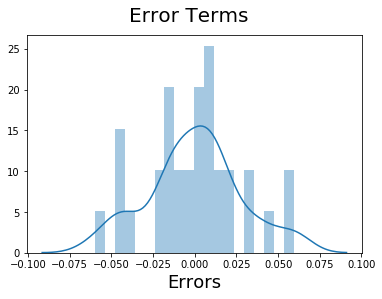

In [295]:
y_train_gmv = lm.predict(x_train_new4)
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  

In [296]:
#transform the test variable
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [297]:
#get the dependent and independent variable
y_test = df_test.pop('gmv')
X_test = df_test
x_train_new4.drop('const',axis=1,inplace=True)

In [298]:
# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new4.columns]

Text(0,0.5,'y_pred')

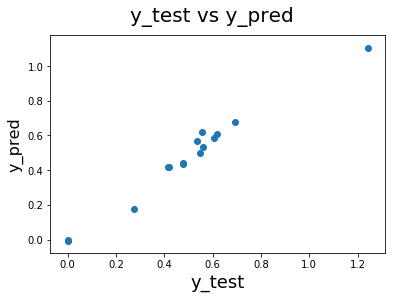

In [299]:
# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)
# Making predictions
y_pred = lm.predict(X_test_new)
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)   

In [300]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

0.0518748566621761


# 5. Multiplicative Model for camera

In [301]:
df_final_cam3.shape

(48, 24)

In [302]:
df_final_cam.shape

(49, 24)

In [303]:
df_final_cam2.shape

(49, 24)

In [304]:
df_final_cam.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm),gmv_lag_one
0,0,0,2092,5.912281,960.0,4227.0,2953704.0,1,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,NaN
1,0,1,1790,6.657082,781.0,2975.0,2303565.0,2,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,2953704.0
2,1,0,2034,6.434622,1119.0,3745.0,2910452.0,3,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,2303565.0
3,0,0,1645,6.636523,697.0,2731.0,2396554.0,4,74.196,0.000876,0.000091,0.000840,0.000180,0.004580,0.001474,0.000840,0.00054,0.005418,47.093031,1052.0,-1.828571,3.120000,0.700000,2910452.0
4,1,1,2158,6.347337,1107.0,4320.0,3105386.0,5,48.052,0.000647,0.000478,0.002931,0.000149,0.004973,0.001616,0.001218,0.00000,0.000000,50.327406,1222.0,0.566667,2.769231,1.076923,2396554.0


In [305]:
#drop gmv_lag_one column
df_final_cam.drop(columns=['gmv_lag_one'], inplace=True)

In [306]:
print(df_final_cam.shape)
print(df_final_cam2.shape)
print(df_final_cam3.shape)

(49, 23)
(49, 23)
(48, 24)


In [307]:
df_final_cam_log = df_final_cam
print(df_final_cam_log.shape)

(49, 23)


In [308]:
df_final_cam_log['Radio'] = df_final_cam_log['Radio'].replace({0:0.0001})
df_final_cam_log['Other'] = df_final_cam_log['Other'].replace({0:0.0001})
df_final_cam_log['Prepaid'] = df_final_cam_log['Prepaid'].replace({0:0.0001})
df_final_cam_log['pincode'] = df_final_cam_log['pincode'].replace({0:0.0001})
df_final_cam_log['Total Snow (cm)'] = df_final_cam_log['Total Snow (cm)'].replace({0:0.0001})
df_final_cam_log['sla'] = df_final_cam_log['sla'].replace({0:0.0001})
df_final_cam_log['COD'] = df_final_cam_log['COD'].replace({0:0.0001})
df_final_cam_log['gmv'] = df_final_cam_log['gmv'].replace({0:0.0001})
df_final_cam_log['Total Rain (mm)'] = df_final_cam_log['Total Rain (mm)'].replace({0:0.0001})
df_final_cam_log['Mean Temp (°C)'] = df_final_cam_log['Mean Temp (°C)'].replace({0:0.0001})
df_final_cam_log['StockIndex'] = df_final_cam_log['StockIndex'].replace({0:0.0001})
df_final_cam_log['TV'] = df_final_cam_log['TV'].replace({0:0.0001})
df_final_cam_log['Digital'] = df_final_cam_log['Digital'].replace({0:0.0001})
df_final_cam_log['Sponsorship'] = df_final_cam_log['Sponsorship'].replace({0:0.0001})
df_final_cam_log['ContentM'] = df_final_cam_log['ContentM'].replace({0:0.0001})
df_final_cam_log['OnlineM'] = df_final_cam_log['OnlineM'].replace({0:0.0001})
df_final_cam_log['Affiliates'] = df_final_cam_log['Affiliates'].replace({0:0.0001})
df_final_cam_log['SEM'] = df_final_cam_log['SEM'].replace({0:0.0001})
df_final_cam_log['NPS'] = df_final_cam_log['NPS'].replace({0:0.0001})
df_final_cam_log['Total'] = df_final_cam_log['Total'].replace({0:0.0001})

For multiplicative model, we need to take log of feature variables. Log of 0 is infinity. Hence changing 0 to 0.0001

In [309]:
df_final_cam_log.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 51
Data columns (total 23 columns):
special_sale       49 non-null int32
payday             49 non-null int32
pincode            49 non-null int64
sla                49 non-null float64
Prepaid            49 non-null float64
COD                49 non-null float64
gmv                49 non-null float64
week               49 non-null int64
Total              49 non-null float64
TV                 49 non-null float64
Digital            49 non-null float64
Sponsorship        49 non-null float64
ContentM           49 non-null float64
OnlineM            49 non-null float64
Affiliates         49 non-null float64
SEM                49 non-null float64
Radio              49 non-null float64
Other              49 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Mean Temp (°C)     49 non-null float64
Total Rain (mm)    49 non-null float64
Total Snow (cm)    49 non-null float64
dtypes: 

In [310]:
col1 = ['pincode','sla','Prepaid','COD','gmv','week','Total','TV','Digital','Sponsorship','ContentM','OnlineM',
       'Affiliates','SEM','Radio','Other','NPS','StockIndex','Mean Temp (°C)','Mean Temp (°C)','Total Rain (mm)',
        'Total Snow (cm)']

In [311]:
df_final_cam_log[col1] = np.log(df_final_cam_log[col1])

In [312]:
df_final_cam_log

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,7.645876,1.777032,6.866933,8.349248,14.898571,0.000000,4.306710,-7.040144,-9.302456,-7.082109,-8.622554,-5.386056,-6.519775,-7.082109,-7.523941,-5.218029,3.852125,6.958448,NaN,1.137833,-0.356675
1,0,1,7.489971,1.895681,6.660575,7.997999,14.649968,0.693147,4.306710,-7.040144,-9.302456,-7.082109,-8.622554,-5.386056,-6.519775,-7.082109,-7.523941,-5.218029,3.852125,6.958448,NaN,1.137833,-0.356675
2,1,0,7.617760,1.861693,7.020191,8.228177,14.883819,1.098612,4.306710,-7.040144,-9.302456,-7.082109,-8.622554,-5.386056,-6.519775,-7.082109,-7.523941,-5.218029,3.852125,6.958448,NaN,1.137833,-0.356675
3,0,0,7.405496,1.892588,6.546785,7.912423,14.689542,1.386294,4.306710,-7.040144,-9.302456,-7.082109,-8.622554,-5.386056,-6.519775,-7.082109,-7.523941,-5.218029,3.852125,6.958448,NaN,1.137833,-0.356675
4,1,1,7.676937,1.848035,7.009409,8.371011,14.948649,1.609438,3.872284,-7.343934,-7.645559,-5.832279,-8.810271,-5.303714,-6.427644,-6.710211,-9.210340,-9.210340,3.918550,7.108244,-0.567984,1.018570,0.074108
5,1,0,7.440734,1.849330,6.725034,7.977968,14.708532,1.791759,3.872284,-7.343934,-7.645559,-5.832279,-8.810271,-5.303714,-6.427644,-6.710211,-9.210340,-9.210340,3.918550,7.108244,-0.567984,1.018570,0.074108
6,1,1,7.706613,1.845660,7.173958,8.515992,15.077295,1.945910,3.872284,-7.343934,-7.645559,-5.832279,-8.810271,-5.303714,-6.427644,-6.710211,-9.210340,-9.210340,3.918550,7.108244,-0.567984,1.018570,0.074108
7,0,0,7.701200,1.843629,6.932448,8.420242,14.918858,2.079442,3.872284,-7.343934,-7.645559,-5.832279,-8.810271,-5.303714,-6.427644,-6.710211,-9.210340,-9.210340,3.918550,7.108244,-0.567984,1.018570,0.074108
8,0,1,7.658228,1.816658,7.045777,8.310907,14.862641,2.197225,4.605416,-6.064035,-7.552112,-4.566190,-9.288302,-5.379646,-6.466655,-6.646624,-8.433312,-5.524870,3.892240,6.922644,1.979468,1.684634,-1.098612
9,1,0,7.663877,1.811523,7.279319,8.315322,14.972699,2.302585,4.605416,-6.064035,-7.552112,-4.566190,-9.288302,-5.379646,-6.466655,-6.646624,-8.433312,-5.524870,3.892240,6.922644,1.979468,1.684634,-1.098612


In [313]:
df_final_cam_log = df_final_cam_log.fillna(0)

In [314]:
scaler = MinMaxScaler()

In [315]:
#test train split and sclaing the train data
df_train,df_test = train_test_split(df_final_cam_log,train_size=0.7,test_size=0.3,random_state=True)
print(df_train.shape)
print(df_test.shape)
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = col1

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

(34, 23)
(15, 23)


    Feeature selection

In [316]:
y_train = df_train.pop('gmv')
x_train = df_train
# Importing RFE and LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [317]:
rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]

In [318]:
col

Index(['pincode', 'Prepaid', 'COD', 'TV', 'ContentM', 'Affiliates', 'Radio',
       'Other', 'StockIndex', 'Total Rain (mm)'],
      dtype='object')

    Model building

In [319]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.998
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                     955.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.18e-27
Time:                        23:16:13   Log-Likelihood:                 117.73
No. Observations:                  34   AIC:                            -213.5
Df Residuals:                      23   BIC:                            -196.7
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0814      0.022     

In [320]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_rfe
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,194.95
6,Affiliates,157.92
1,pincode,76.95
5,ContentM,45.89
4,TV,29.56
3,COD,23.02
8,Other,15.26
2,Prepaid,15.01
7,Radio,14.34
9,StockIndex,8.93


In [321]:
x_train_new = x_train_rfe.drop(["Affiliates"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     601.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.03e-26
Time:                        23:16:13   Log-Likelihood:                 107.39
No. Observations:                  34   AIC:                            -194.8
Df Residuals:                      24   BIC:                            -179.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0037      0.018     

In [322]:
x_train_new = x_train_new.drop(["ContentM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     702.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.90e-27
Time:                        23:16:13   Log-Likelihood:                 107.32
No. Observations:                  34   AIC:                            -196.6
Df Residuals:                      25   BIC:                            -182.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0043      0.017     

In [323]:
x_train_new = x_train_rfe.drop(["StockIndex"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     696.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           8.69e-27
Time:                        23:16:14   Log-Likelihood:                 109.88
No. Observations:                  34   AIC:                            -199.8
Df Residuals:                      24   BIC:                            -184.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0126      0.014     

In [324]:
x_train_new = x_train_new.drop(["Total Rain (mm)"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     713.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.56e-27
Time:                        23:16:14   Log-Likelihood:                 107.60
No. Observations:                  34   AIC:                            -197.2
Df Residuals:                      25   BIC:                            -183.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0043      0.012      0.369      0.7

In [325]:
x_train_new = x_train_new.drop(["Affiliates"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     807.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.69e-29
Time:                        23:16:14   Log-Likelihood:                 106.76
No. Observations:                  34   AIC:                            -197.5
Df Residuals:                      26   BIC:                            -185.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0047      0.012      0.398      0.6

In [326]:
x_train_new = x_train_new.drop(["ContentM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     974.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.08e-30
Time:                        23:16:14   Log-Likelihood:                 106.70
No. Observations:                  34   AIC:                            -199.4
Df Residuals:                      27   BIC:                            -188.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0045      0.012      0.386      0.7

In [327]:
x_train_new = x_train_new.drop(["Radio"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     1081.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.16e-31
Time:                        23:16:14   Log-Likelihood:                 104.75
No. Observations:                  34   AIC:                            -197.5
Df Residuals:                      28   BIC:                            -188.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0047      0.012      0.386      0.7

In [328]:
x_train_new = x_train_new.drop(["TV"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     1283.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.61e-32
Time:                        23:16:14   Log-Likelihood:                 103.29
No. Observations:                  34   AIC:                            -196.6
Df Residuals:                      29   BIC:                            -188.9
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0054      0.012      0.435      0.6

In [329]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,32.94
1,pincode,28.22
2,Prepaid,12.14
3,COD,8.34
4,Other,1.08


In [330]:
x_train_new = x_train_new.drop(["pincode"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     753.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.55e-28
Time:                        23:16:15   Log-Likelihood:                 88.898
No. Observations:                  34   AIC:                            -169.8
Df Residuals:                      30   BIC:                            -163.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0219      0.018      1.206      0.2

# SubCategory Home Audio

In [331]:
#Read the file of Homeaudio data

df_haudio = df_ce[df_ce.product_analytic_sub_category == "HomeAudio"]

In [332]:
#shape
df_haudio.shape

(108867, 14)

In [333]:
#info
df_haudio.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 108867 entries, 2870 to 1542376
Data columns (total 14 columns):
Year                             108867 non-null int64
Month                            108867 non-null int64
order_id                         108867 non-null float64
gmv                              108867 non-null float64
sla                              108867 non-null int64
cust_id                          108867 non-null object
pincode                          108867 non-null object
product_analytic_sub_category    108867 non-null object
product_procurement_sla          108867 non-null int64
payday                           108867 non-null int32
special_sale                     108867 non-null int32
week_of_year                     108867 non-null int64
COD                              108867 non-null uint8
Prepaid                          108867 non-null uint8
dtypes: float64(2), int32(2), int64(5), object(3), uint8(2)
memory usage: 10.2+ MB


In [334]:
#Number of weeks in that year

df_haudio['week_of_year'].nunique()

50

    The mdoel has to be built on weekly basis. We will aggregate the data on the basis of week and then use the aggregate function 

<b>GMV

In [335]:
#Groupby  "week" and "gmv"
week_ha_gmv = df_haudio.groupby(['week_of_year'])['gmv'].sum()


<b>Prepaid

In [336]:
#groupby "week" and "prepaid"

week_ha_prepaid = df_haudio.groupby(['week_of_year'])['Prepaid'].sum()


<b>SLA

In [337]:
#groupby "week" and "sla"
week_ha_SLA = df_haudio.groupby(['week_of_year'])['sla'].mean()


<b>cust_id

In [338]:
#Groupby "week" and "cust_id"

week_ha_cust_id = df_haudio.groupby(['week_of_year'])['cust_id'].count()


<b>Pincode

In [339]:
#groupby "week" and "pincode"

week_ha_pin = df_haudio.groupby(['week_of_year'])['pincode'].count()


<b>payday

In [340]:
#groupby "week" and "payday"
#if any day in week was payday, wr will consider week as payday

week_ha_pay = df_haudio.groupby(['week_of_year'])['payday'].max()


<b>Special Sale
   

In [341]:
#groupby "week" and "special sale"
#if any day in week was special sale, wr will consider week as special sale

week_ha_sale = df_haudio.groupby(['week_of_year'])['special_sale'].max()


<b>Month

In [342]:
#Groupby "week" and "month"

week_ha_month = df_haudio.groupby(['week_of_year'])['Month'].max()


<b>Year

In [343]:
#Groupby "week" and "year"
week_ha_year = df_haudio.groupby(['week_of_year'])['Year'].max()


In [344]:
df_haudio.columns

Index(['Year', 'Month', 'order_id', 'gmv', 'sla', 'cust_id', 'pincode',
       'product_analytic_sub_category', 'product_procurement_sla', 'payday',
       'special_sale', 'week_of_year', 'COD', 'Prepaid'],
      dtype='object')

In [345]:
#groupby "week" and "cod"

week_ha_cod = df_haudio.groupby(['week_of_year'])['COD'].max()


In [346]:
#Combine all the dtaframes

df_ha = pd.concat([week_ha_sale,week_ha_pay,week_ha_pin,week_ha_cust_id,week_ha_SLA,week_ha_prepaid,week_ha_cod,week_ha_gmv,week_ha_month,week_ha_year],axis=1)


In [347]:
df_ha

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year
week_of_year,,,,,,,,,,
1,0,0,3276,3276,4.807692,434.0,1,6.468521e+06,1,2016
2,0,1,2222,2222,5.474347,384.0,1,4.318671e+06,1,2016
3,1,0,2852,2852,5.529102,578.0,1,5.446807e+06,1,2016
4,0,0,2127,2127,5.707569,370.0,1,3.945851e+06,1,2016
5,1,1,3242,3242,4.887724,501.0,1,6.498483e+06,2,2016
6,1,0,2274,2274,5.373791,392.0,1,4.216224e+06,2,2016
7,1,1,3205,3205,5.033385,584.0,1,6.281084e+06,2,2016
8,0,0,2461,2461,5.770419,422.0,1,4.629776e+06,2,2016
9,0,1,2273,2273,5.843379,415.0,1,4.000879e+06,3,2016


In [348]:
#shape
df_ha.shape

(50, 10)

In [349]:
#Make "week" as the index of the dataframe

df_ha['week'] = df_ha.index


In [350]:
df_ha.shape

(50, 11)

In [351]:
df_media.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other
0,2015,7,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015,8,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015,9,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015,10,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015,11,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [352]:
df_media.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 12 columns):
Year                12 non-null int64
Month               12 non-null int64
Total Investment    12 non-null float64
TV                  12 non-null float64
Digital             12 non-null float64
Sponsorship         12 non-null float64
ContentM            12 non-null float64
OnlineM             12 non-null float64
Affiliates          12 non-null float64
SEM                 12 non-null float64
Radio               3 non-null float64
Other               3 non-null float64
dtypes: float64(10), int64(2)
memory usage: 1.2 KB


In [353]:
#merge the files

df_haudio_final = pd.merge(df_ha, df_media, on=['Year','Month'], how='left')


In [354]:
df_haudio_final.dtypes

special_sale          int32
payday                int32
pincode               int64
cust_id               int64
sla                 float64
Prepaid             float64
COD                   uint8
gmv                 float64
Month                 int64
Year                  int64
week                  int64
Total Investment    float64
TV                  float64
Digital             float64
Sponsorship         float64
ContentM            float64
OnlineM             float64
Affiliates          float64
SEM                 float64
Radio               float64
Other               float64
dtype: object

The data is given in monthly wise, we will divide the media data in week wise

In [355]:
count_week = df_haudio_final.groupby(['Year','Month'])['week'].count()

In [356]:
count_week

Year  Month
2015  7        3
      8        1
      9        4
      10       4
      11       5
      12       4
2016  1        4
      2        4
      3        4
      4        4
      5        5
      6        4
      7        3
      12       1
Name: week, dtype: int64

In [357]:
#convert above series to dataframe
count_week = pd.DataFrame(data=count_week)

In [358]:
#merge above dataframe to get the count of weeks in a month, we will use this to distribute the monthly allocation of budget
#to weekly data
df_haudio_final = pd.merge(df_haudio_final, count_week, on=['Year','Month'], how='left')

In [359]:
df_haudio_final

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week_x,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,week_y
0,0,0,3276,3276,4.807692,434.0,1,6.468521e+06,1,2016,1,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000,4
1,0,1,2222,2222,5.474347,384.0,1,4.318671e+06,1,2016,2,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000,4
2,1,0,2852,2852,5.529102,578.0,1,5.446807e+06,1,2016,3,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000,4
3,0,0,2127,2127,5.707569,370.0,1,3.945851e+06,1,2016,4,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000,4
4,1,1,3242,3242,4.887724,501.0,1,6.498483e+06,2,2016,5,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN,4
5,1,0,2274,2274,5.373791,392.0,1,4.216224e+06,2,2016,6,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN,4
6,1,1,3205,3205,5.033385,584.0,1,6.281084e+06,2,2016,7,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN,4
7,0,0,2461,2461,5.770419,422.0,1,4.629776e+06,2,2016,8,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,NaN,NaN,4
8,0,1,2273,2273,5.843379,415.0,1,4.000879e+06,3,2016,9,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545,4
9,1,0,3073,3073,5.325415,696.0,1,5.998734e+06,3,2016,10,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545,4


In [360]:
# Multiply by the percentage of Home audio devices 

df_haudio_final['TV'] = df_haudio_final['TV']/df_haudio_final['week_y']*0.052
df_haudio_final['Digital'] = df_haudio_final['Digital']/df_haudio_final['week_y']*0.052
df_haudio_final['Sponsorship'] = df_haudio_final['Sponsorship']/df_haudio_final['week_y']*0.052
df_haudio_final['ContentM'] = df_haudio_final['ContentM']/df_haudio_final['week_y']*0.052
df_haudio_final['OnlineM'] = df_haudio_final['OnlineM']/df_haudio_final['week_y']*0.052
df_haudio_final['Affiliates'] = df_haudio_final['Affiliates']/df_haudio_final['week_y']*0.052
df_haudio_final['SEM'] = df_haudio_final['SEM']/df_haudio_final['week_y']*0.052
df_haudio_final['Radio'] = df_haudio_final['Radio']/df_haudio_final['week_y']*0.052
df_haudio_final['Other'] = df_haudio_final['Other']/df_haudio_final['week_y']*0.052

In [361]:
#shape
df_haudio_final.shape

(50, 22)

In [362]:
df_haudio_final.head()

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week_x,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,week_y
0,0,0,3276,3276,4.807692,434.0,1,6.468521e+06,1,2016,1,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4
1,0,1,2222,2222,5.474347,384.0,1,4.318671e+06,1,2016,2,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4
2,1,0,2852,2852,5.529102,578.0,1,5.446807e+06,1,2016,3,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4
3,0,0,2127,2127,5.707569,370.0,1,3.945851e+06,1,2016,4,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4
4,1,1,3242,3242,4.887724,501.0,1,6.498483e+06,2,2016,5,48.052,0.033618,0.024864,0.152432,0.007758,0.258601,0.084045,0.063357,NaN,NaN,4


Merge the nps_si dataframe to the final dataframe based on the year and month

In [363]:
df_nps_si.head()

,NPS,Year,Month,StockIndex
0,54.599588,2015,7,1177.0
1,59.987101,2015,8,1206.0
2,46.925419,2015,9,1101.0
3,44.398389,2015,10,1210.0
4,47.000000,2015,11,1233.0


In [364]:
#Merge the data frames on "Year" and "month"

df_haudio_ = pd.merge(df_haudio_final, df_nps_si, left_on=['Year','Month'], right_on=['Year','Month'],how='left')

    merging weather information

In [365]:
df_weather

,Year,Month,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,2016,1,NaN,NaN,NaN
1,2016,1,NaN,NaN,NaN
2,2016,1,NaN,NaN,NaN
3,2016,1,NaN,NaN,NaN
4,2016,1,NaN,NaN,NaN
5,2016,1,NaN,NaN,NaN
6,2016,1,NaN,NaN,NaN
7,2016,1,-3.5,9.0,0.0
8,2016,1,7.0,14.6,0.0
9,2016,1,-3.3,0.0,7.0


In [366]:
df_weather.shape

(731, 5)

In [367]:
df_ha

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week
week_of_year,,,,,,,,,,,
1,0,0,3276,3276,4.807692,434.0,1,6.468521e+06,1,2016,1
2,0,1,2222,2222,5.474347,384.0,1,4.318671e+06,1,2016,2
3,1,0,2852,2852,5.529102,578.0,1,5.446807e+06,1,2016,3
4,0,0,2127,2127,5.707569,370.0,1,3.945851e+06,1,2016,4
5,1,1,3242,3242,4.887724,501.0,1,6.498483e+06,2,2016,5
6,1,0,2274,2274,5.373791,392.0,1,4.216224e+06,2,2016,6
7,1,1,3205,3205,5.033385,584.0,1,6.281084e+06,2,2016,7
8,0,0,2461,2461,5.770419,422.0,1,4.629776e+06,2,2016,8
9,0,1,2273,2273,5.843379,415.0,1,4.000879e+06,3,2016,9


In [368]:
# creating a week month mapping table
df_week_month = df_ha

In [369]:
#Retain only week ,year and month details

df_week_month.drop(['special_sale','payday','pincode','cust_id','sla','Prepaid','COD','gmv'],axis=1, inplace=True)

In [370]:
df_agg

Mean Temp (°C)  Total Rain (mm)  Total Snow (cm)
Year Month                                                  
2015 1           -5.218182         1.575000         0.562500
     2           -8.866667         0.200000         2.142857
     3            0.562500         0.166667         0.055556
     4            9.233333         1.840000         0.000000
     5           18.228571         6.533333         0.000000
     6           20.372000         6.232000         0.000000
     7           21.976923         1.492593         0.000000
     8           22.915789         3.580000         0.000000
     9           20.913333         3.518182         0.000000
     10          14.980000         0.888889         0.000000
     11           9.861538         3.485714         0.714286
     12           5.410000         2.885714         0.000000
2016 1           -1.828571         3.120000         0.700000
     2            0.566667         2.769231         1.076923
     3            7.238889         5.390476         0.333333
     4            7.931579         1.463158         0.315789
     5           16.158824         1.800000         0.000000
     6           22.145000         1.110000         0.000000
     7           25.156522         4.434783         0.000000
     8           24.641667         3.816667         0.000000
     9           20.325000         5.310000         0.000000
     10          13.683333         2.137500         0.000000
     11           7.941176         2.694118         0.000000
     12          -0.827778         1.357895         1.368421

In [371]:
#Merge the dataframes

df_we_final = pd.merge(df_week_month,df_agg, how='inner',on=['Year','Month'])

In [372]:
df_we_final.columns

Index(['Month', 'Year', 'week', 'Mean Temp (°C)', 'Total Rain (mm)',
       'Total Snow (cm)'],
      dtype='object')

In [373]:
#sort
df_we_final.sort_values(by='week')

,Month,Year,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,1,2016,1,-1.828571,3.120000,0.700000
1,1,2016,2,-1.828571,3.120000,0.700000
2,1,2016,3,-1.828571,3.120000,0.700000
3,1,2016,4,-1.828571,3.120000,0.700000
4,2,2016,5,0.566667,2.769231,1.076923
5,2,2016,6,0.566667,2.769231,1.076923
6,2,2016,7,0.566667,2.769231,1.076923
7,2,2016,8,0.566667,2.769231,1.076923
8,3,2016,9,7.238889,5.390476,0.333333
9,3,2016,10,7.238889,5.390476,0.333333


In [374]:
print(df_haudio_.shape)
print(df_we_final.shape)

(50, 24)
(50, 6)


In [375]:
df_haudio_.columns

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Month', 'Year', 'week_x', 'Total Investment', 'TV', 'Digital',
       'Sponsorship', 'ContentM', 'OnlineM', 'Affiliates', 'SEM', 'Radio',
       'Other', 'week_y', 'NPS', 'StockIndex'],
      dtype='object')

In [376]:
df_we_final.columns

Index(['Month', 'Year', 'week', 'Mean Temp (°C)', 'Total Rain (mm)',
       'Total Snow (cm)'],
      dtype='object')

In [377]:
#Merge the weather and home audio dataframe

df_final_ha = pd.merge(df_haudio_,df_we_final, how='inner',left_on='week_x', right_on='week')

In [378]:
print(df_final_ha.shape)

(50, 30)


In [379]:
df_final_ha.columns

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Month_x', 'Year_x', 'week_x', 'Total Investment', 'TV',
       'Digital', 'Sponsorship', 'ContentM', 'OnlineM', 'Affiliates', 'SEM',
       'Radio', 'Other', 'week_y', 'NPS', 'StockIndex', 'Month_y', 'Year_y',
       'week', 'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')

In [380]:
df_final_ha.head()

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month_x,Year_x,week_x,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,week_y,NPS,StockIndex,Month_y,Year_y,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,3276,3276,4.807692,434.0,1,6.468521e+06,1,2016,1,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4,47.093031,1052.0,1,2016,1,-1.828571,3.120000,0.700000
1,0,1,2222,2222,5.474347,384.0,1,4.318671e+06,1,2016,2,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4,47.093031,1052.0,1,2016,2,-1.828571,3.120000,0.700000
2,1,0,2852,2852,5.529102,578.0,1,5.446807e+06,1,2016,3,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4,47.093031,1052.0,1,2016,3,-1.828571,3.120000,0.700000
3,0,0,2127,2127,5.707569,370.0,1,3.945851e+06,1,2016,4,74.196,0.056940,0.005928,0.054600,0.011700,0.297700,0.095810,0.054600,0.0351,0.35217,4,47.093031,1052.0,1,2016,4,-1.828571,3.120000,0.700000
4,1,1,3242,3242,4.887724,501.0,1,6.498483e+06,2,2016,5,48.052,0.033618,0.024864,0.152432,0.007758,0.258601,0.084045,0.063357,NaN,NaN,4,50.327406,1222.0,2,2016,5,0.566667,2.769231,1.076923


In [381]:
#Drop the irrelevant columns

df_final_ha.drop(['Month_x','Year_x','Month_y','Year_y', 'week_x', 'week_y'],axis=1,inplace=True)

In [382]:
df_final_ha.columns

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'ContentM',
       'OnlineM', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS', 'StockIndex',
       'week', 'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')

In [383]:
df_final_ha

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,3276,3276,4.807692,434.0,1,6.468521e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,0.03510,0.352170,47.093031,1052.0,1,-1.828571,3.120000,0.700000
1,0,1,2222,2222,5.474347,384.0,1,4.318671e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,0.03510,0.352170,47.093031,1052.0,2,-1.828571,3.120000,0.700000
2,1,0,2852,2852,5.529102,578.0,1,5.446807e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,0.03510,0.352170,47.093031,1052.0,3,-1.828571,3.120000,0.700000
3,0,0,2127,2127,5.707569,370.0,1,3.945851e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,0.03510,0.352170,47.093031,1052.0,4,-1.828571,3.120000,0.700000
4,1,1,3242,3242,4.887724,501.0,1,6.498483e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,NaN,NaN,50.327406,1222.0,5,0.566667,2.769231,1.076923
5,1,0,2274,2274,5.373791,392.0,1,4.216224e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,NaN,NaN,50.327406,1222.0,6,0.566667,2.769231,1.076923
6,1,1,3205,3205,5.033385,584.0,1,6.281084e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,NaN,NaN,50.327406,1222.0,7,0.566667,2.769231,1.076923
7,0,0,2461,2461,5.770419,422.0,1,4.629776e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,NaN,NaN,50.327406,1222.0,8,0.566667,2.769231,1.076923
8,0,1,2273,2273,5.843379,415.0,1,4.000879e+06,100.024621,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,0.01131,0.207292,49.020550,1015.0,9,7.238889,5.390476,0.333333
9,1,0,3073,3073,5.325415,696.0,1,5.998734e+06,100.024621,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,0.01131,0.207292,49.020550,1015.0,10,7.238889,5.390476,0.333333


In [384]:
# The following command will tell us the number of rows and number of columns in the dataset
print("The number of rows and columns")
print(df_final_ha.shape)
print('\n')
# To check the name of the columns, following command can be used
print("The name of all the columns")
print(df_final_ha.columns)
print('\n')
# The further information of the dataset like datatype of the columns, number of "not null" values etc of each column
print("The next level information of the columns like datatype, null rows, etc")
print(df_final_ha.info())
print('\n')
# To get the value level details like total count, Max value, Min value, Mean, Median etc can be determined through following command
print("The value level details like count, max, min, mean etc")
print(df_final_ha.describe())

The number of rows and columns
(50, 24)


The name of all the columns
Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'ContentM',
       'OnlineM', 'Affiliates', 'SEM', 'Radio', 'Other', 'NPS', 'StockIndex',
       'week', 'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')


The next level information of the columns like datatype, null rows, etc
<class 'pandas.core.frame.DataFrame'>
Int64Index: 50 entries, 0 to 49
Data columns (total 24 columns):
special_sale        50 non-null int32
payday              50 non-null int32
pincode             50 non-null int64
cust_id             50 non-null int64
sla                 50 non-null float64
Prepaid             50 non-null float64
COD                 50 non-null uint8
gmv                 50 non-null float64
Total Investment    46 non-null float64
TV                  46 non-null float64
Digital             46 non-null f

In [385]:
# Checking the percentage of missing values
round(100*(df_final_ha.isnull().sum()/len(df_final_ha.index)), 2)

special_sale         0.0
payday               0.0
pincode              0.0
cust_id              0.0
sla                  0.0
Prepaid              0.0
COD                  0.0
gmv                  0.0
Total Investment     8.0
TV                   8.0
Digital              8.0
Sponsorship          8.0
ContentM             8.0
OnlineM              8.0
Affiliates           8.0
SEM                  8.0
Radio               74.0
Other               74.0
NPS                  8.0
StockIndex           8.0
week                 0.0
Mean Temp (°C)       0.0
Total Rain (mm)      0.0
Total Snow (cm)      0.0
dtype: float64

In [386]:
df_final_ha.drop(['Radio','Other'],axis=1,inplace=True)

In [387]:
# Checking the percentage of missing values
round(100*(df_final_ha.isnull().sum()/len(df_final_ha.index)), 2)

special_sale        0.0
payday              0.0
pincode             0.0
cust_id             0.0
sla                 0.0
Prepaid             0.0
COD                 0.0
gmv                 0.0
Total Investment    8.0
TV                  8.0
Digital             8.0
Sponsorship         8.0
ContentM            8.0
OnlineM             8.0
Affiliates          8.0
SEM                 8.0
NPS                 8.0
StockIndex          8.0
week                0.0
Mean Temp (°C)      0.0
Total Rain (mm)     0.0
Total Snow (cm)     0.0
dtype: float64

In [388]:
#drop the null values
df_final_ha= df_final_ha.dropna() 

In [389]:
df_final_ha.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46 entries, 0 to 48
Data columns (total 22 columns):
special_sale        46 non-null int32
payday              46 non-null int32
pincode             46 non-null int64
cust_id             46 non-null int64
sla                 46 non-null float64
Prepaid             46 non-null float64
COD                 46 non-null uint8
gmv                 46 non-null float64
Total Investment    46 non-null float64
TV                  46 non-null float64
Digital             46 non-null float64
Sponsorship         46 non-null float64
ContentM            46 non-null float64
OnlineM             46 non-null float64
Affiliates          46 non-null float64
SEM                 46 non-null float64
NPS                 46 non-null float64
StockIndex          46 non-null float64
week                46 non-null int64
Mean Temp (°C)      46 non-null float64
Total Rain (mm)     46 non-null float64
Total Snow (cm)     46 non-null float64
dtypes: float64(16), int32(2)

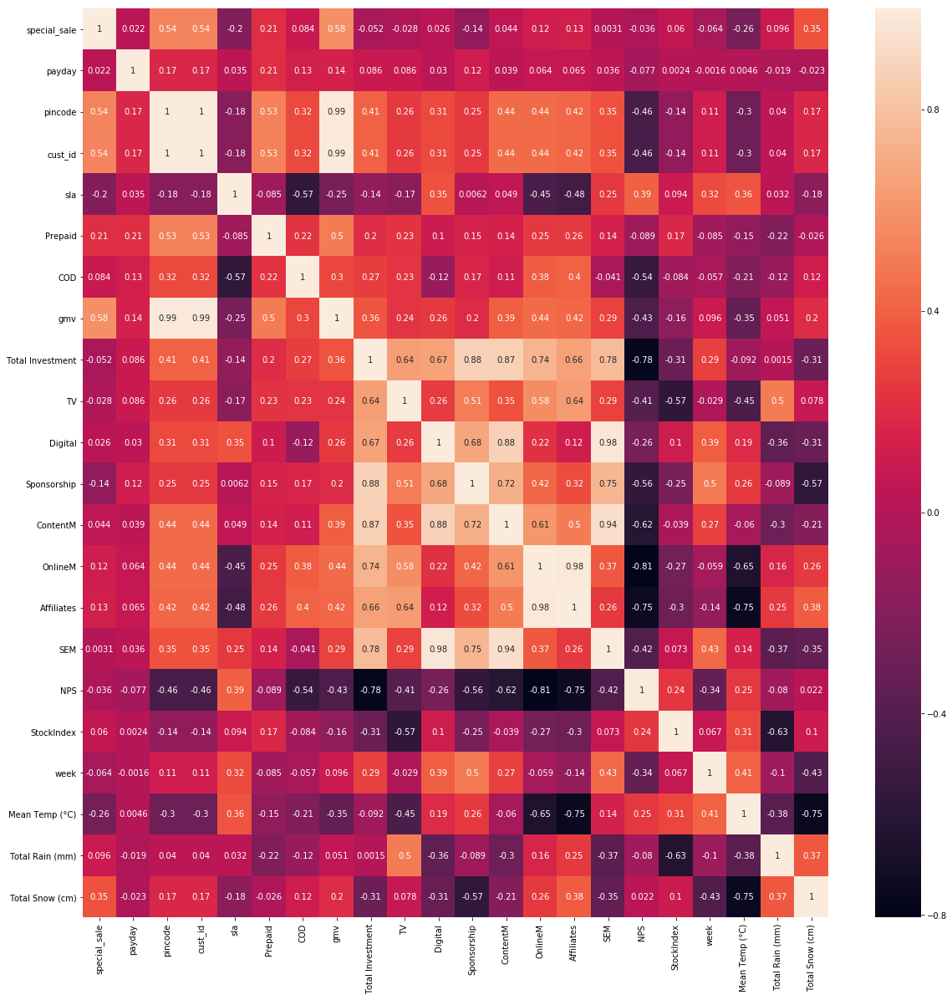

In [390]:
#Plot heat map and check for multicollinearity

plt.figure(figsize=(20,20))
sns.heatmap(df_final_ha.corr(), annot=True)
plt.show()

In [391]:
df_final_ha.shape

(46, 22)

In [392]:
#Drop Variable NPS which is highly correlated with other variables

df_final_ha = df_final_ha.drop(['cust_id'],axis=1)

In [393]:
df_final_ha.columns

Index(['special_sale', 'payday', 'pincode', 'sla', 'Prepaid', 'COD', 'gmv',
       'Total Investment', 'TV', 'Digital', 'Sponsorship', 'ContentM',
       'OnlineM', 'Affiliates', 'SEM', 'NPS', 'StockIndex', 'week',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')

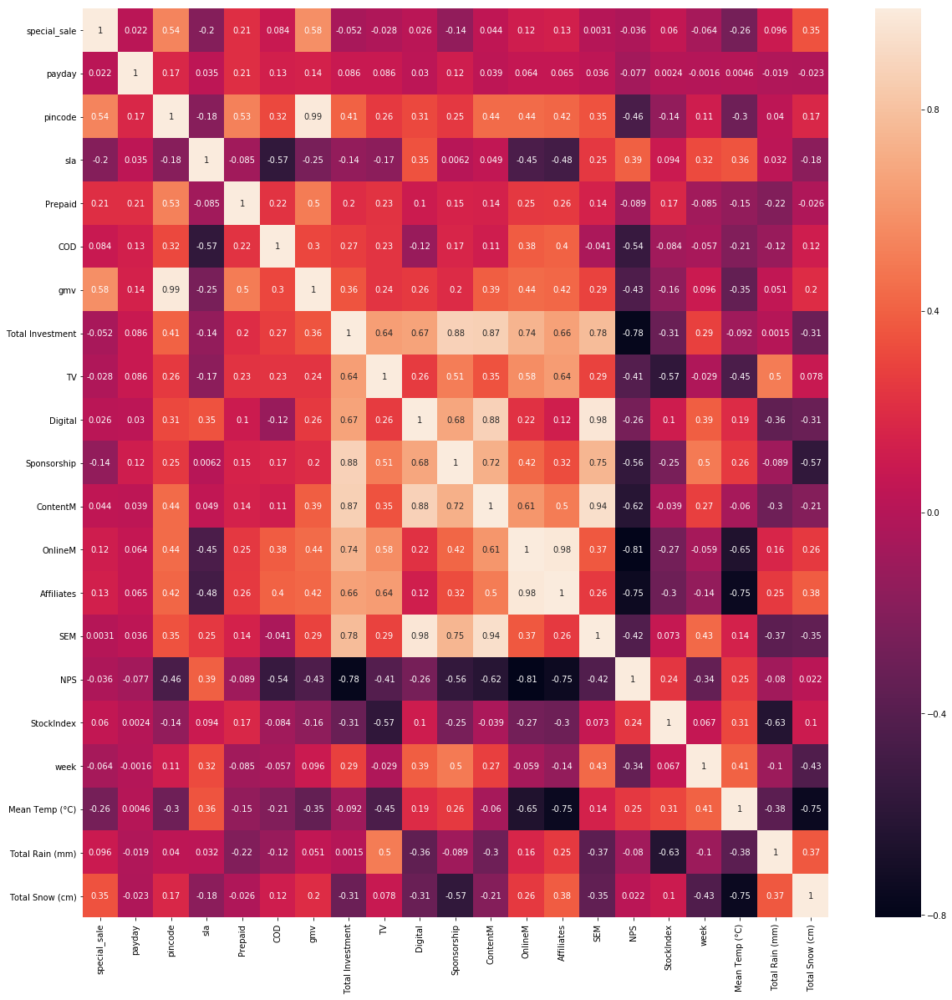

In [394]:
#Now Check the Correlation again
plt.figure(figsize=(20,20))
sns.heatmap(df_final_ha.corr(), annot=True)
plt.show()

In [395]:
#Check for Nan values in df_final_ha
df_final_ha = df_final_ha.fillna(df_final_ha.mean())

# Model building for home audio

# 1. Linear model

In [396]:
#scalar library
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [397]:
# import sikit learn
from sklearn.model_selection import train_test_split

In [398]:
# divide data into train and test
df_train,df_test = train_test_split(df_final_ha,train_size=0.7,test_size=0.3,random_state=True)

In [399]:
print(df_train.shape)
print(df_test.shape)

(32, 21)
(14, 21)


In [400]:
np.isnan(df_train.values.any())


False

In [401]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = df_train.columns

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

num_vars

Index(['special_sale', 'payday', 'pincode', 'sla', 'Prepaid', 'COD', 'gmv',
       'Total Investment', 'TV', 'Digital', 'Sponsorship', 'ContentM',
       'OnlineM', 'Affiliates', 'SEM', 'NPS', 'StockIndex', 'week',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')

In [402]:
#gettng dependent and independent variable
y_train = df_train.pop('gmv')
x_train = df_train

    Feature selection

In [403]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [404]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)

In [405]:
#List the features and their ranking

list(zip(x_train.columns,rfe.support_,rfe.ranking_))

[('special_sale', False, 8),
 ('payday', False, 10),
 ('pincode', True, 1),
 ('sla', True, 1),
 ('Prepaid', False, 7),
 ('COD', False, 11),
 ('Total Investment', True, 1),
 ('TV', False, 9),
 ('Digital', False, 5),
 ('Sponsorship', True, 1),
 ('ContentM', True, 1),
 ('OnlineM', False, 2),
 ('Affiliates', True, 1),
 ('SEM', True, 1),
 ('NPS', True, 1),
 ('StockIndex', False, 3),
 ('week', True, 1),
 ('Mean Temp (°C)', True, 1),
 ('Total Rain (mm)', False, 6),
 ('Total Snow (cm)', False, 4)]

In [406]:
col = x_train.columns[rfe.support_]
col

Index(['pincode', 'sla', 'Total Investment', 'Sponsorship', 'ContentM',
       'Affiliates', 'SEM', 'NPS', 'week', 'Mean Temp (°C)'],
      dtype='object')

In [407]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]

In [408]:
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)

In [409]:
lm = sm.OLS(y_train,x_train_rfe).fit()   # Running the linear model

In [410]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     661.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           6.57e-24
Time:                        23:16:35   Log-Likelihood:                 97.374
No. Observations:                  32   AIC:                            -172.7
Df Residuals:                      21   BIC:                            -156.6
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.5666      0.239  

In [411]:
#dropping Mean Temp (°C) as its p-value is high
x_train_new = x_train_rfe.drop(["Mean Temp (°C)"], axis = 1)

In [412]:
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)

In [413]:
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model

In [414]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     756.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.76e-25
Time:                        23:16:36   Log-Likelihood:                 97.094
No. Observations:                  32   AIC:                            -174.2
Df Residuals:                      22   BIC:                            -159.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.4301      0.082  

In [415]:
#dropping Affiliates as its p-value is high
x_train_new = x_train_new.drop(["Affiliates"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                     885.9
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.33e-27
Time:                        23:16:36   Log-Likelihood:                 97.023
No. Observations:                  32   AIC:                            -176.0
Df Residuals:                      23   BIC:                            -162.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.4233      0.077  

In [416]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = x_train_lm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)

In [417]:
vif

,Features,VIF
0,const,1008.29
6,SEM,182.89
5,ContentM,156.93
3,Total Investment,85.90
7,NPS,60.58
8,week,30.30
4,Sponsorship,28.52
2,sla,2.34
1,pincode,1.32


In [418]:
#dropping SEM as its p-value is high
x_train_new = x_train_new.drop(["SEM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     649.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.20e-26
Time:                        23:16:37   Log-Likelihood:                 89.262
No. Observations:                  32   AIC:                            -162.5
Df Residuals:                      24   BIC:                            -150.8
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.1503      0.035  

In [419]:
#dropping ContentM as its p-value is high
x_train_new = x_train_new.drop(["ContentM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())


                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     752.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.62e-27
Time:                        23:16:37   Log-Likelihood:                 88.505
No. Observations:                  32   AIC:                            -163.0
Df Residuals:                      25   BIC:                            -152.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -0.1628      0.033  

In [420]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = x_train_lm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,116.92
3,Total Investment,27.21
4,Sponsorship,17.09
5,NPS,9.42
6,week,5.07
2,sla,1.95
1,pincode,1.15


In [421]:
#dropping Total Investment as its p-value is high
x_train_new = x_train_new.drop(["Total Investment"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     620.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.64e-26
Time:                        23:16:37   Log-Likelihood:                 81.916
No. Observations:                  32   AIC:                            -151.8
Df Residuals:                      26   BIC:                            -143.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -0.0588      0.018     -3.180      

In [422]:
#dropping Sponsorship as its p-value is high
x_train_new = x_train_new.drop(["Sponsorship"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     730.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.38e-27
Time:                        23:16:37   Log-Likelihood:                 80.373
No. Observations:                  32   AIC:                            -150.7
Df Residuals:                      27   BIC:                            -143.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0731      0.017     -4.369      0.0

In [423]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = x_train_lm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,19.62
4,week,1.85
3,NPS,1.82
2,sla,1.65
1,pincode,1.12


    Model evaluation

In [424]:
y_train_gmv = lm.predict(x_train_new)

In [425]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

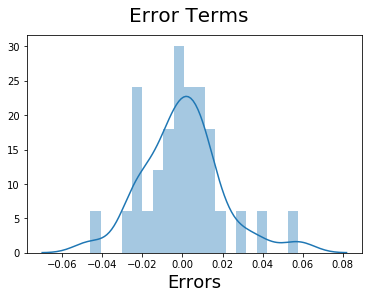

In [426]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)   

    Prediction

In [427]:
num_vars = df_test.columns
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [428]:
y_test = df_test.pop('gmv')
X_test = df_test

In [429]:
x_train_new.drop('const',axis=1,inplace=True)

In [430]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [431]:
# Making predictions
y_pred = lm.predict(X_test_new)

In [432]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))

In [433]:
print(rms)

0.07613397696336119


# 2. Multiplicative Model

In [434]:
df_final_ha_log = df_final_ha
print(df_final_ha_log.shape)

(46, 21)


In [435]:
df_final_ha_log

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,NPS,StockIndex,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,3276,4.807692,434.0,1,6.468521e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,1,-1.828571,3.120000,0.700000
1,0,1,2222,5.474347,384.0,1,4.318671e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,2,-1.828571,3.120000,0.700000
2,1,0,2852,5.529102,578.0,1,5.446807e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,3,-1.828571,3.120000,0.700000
3,0,0,2127,5.707569,370.0,1,3.945851e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,4,-1.828571,3.120000,0.700000
4,1,1,3242,4.887724,501.0,1,6.498483e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,5,0.566667,2.769231,1.076923
5,1,0,2274,5.373791,392.0,1,4.216224e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,6,0.566667,2.769231,1.076923
6,1,1,3205,5.033385,584.0,1,6.281084e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,7,0.566667,2.769231,1.076923
7,0,0,2461,5.770419,422.0,1,4.629776e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,8,0.566667,2.769231,1.076923
8,0,1,2273,5.843379,415.0,1,4.000879e+06,100.024621,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,9,7.238889,5.390476,0.333333
9,1,0,3073,5.325415,696.0,1,5.998734e+06,100.024621,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,10,7.238889,5.390476,0.333333


In [436]:
# Take log of the columns with numerical values 

df_final_ha_log['pincode'] = df_final_ha_log['pincode'].replace({0:0.0001})
df_final_ha_log['Total Snow (cm)'] = df_final_ha_log['Total Snow (cm)'].replace({0:0.0001})
df_final_ha_log['sla'] = df_final_ha_log['sla'].replace({0:0.0001})
df_final_ha_log['gmv'] = df_final_ha_log['gmv'].replace({0:0.0001})
df_final_ha_log['Total Rain (mm)'] = df_final_ha_log['Total Rain (mm)'].replace({0:0.0001})
df_final_ha_log['Mean Temp (°C)'] = df_final_ha_log['Mean Temp (°C)'].replace({0:0.0001})
df_final_ha_log['StockIndex'] = df_final_ha_log['StockIndex'].replace({0:0.0001})
df_final_ha_log['TV'] = df_final_ha_log['TV'].replace({0:0.0001})
df_final_ha_log['Digital'] = df_final_ha_log['Digital'].replace({0:0.0001})
df_final_ha_log['Sponsorship'] = df_final_ha_log['Sponsorship'].replace({0:0.0001})
df_final_ha_log['ContentM'] = df_final_ha_log['ContentM'].replace({0:0.0001})
df_final_ha_log['OnlineM'] = df_final_ha_log['OnlineM'].replace({0:0.0001})
df_final_ha_log['Affiliates'] = df_final_ha_log['Affiliates'].replace({0:0.0001})
df_final_ha_log['SEM'] = df_final_ha_log['SEM'].replace({0:0.0001})
df_final_ha_log['Total Investment'] = df_final_ha_log['Total Investment'].replace({0:0.0001})

In [437]:
df_final_ha_log.rename(columns={'Total Investment':'Total'}, inplace=True)

In [438]:
col1 = ['pincode','sla','gmv','Total','TV','Digital','Sponsorship','ContentM','OnlineM',
       'Affiliates','SEM','StockIndex','Mean Temp (°C)','Mean Temp (°C)','Total Rain (mm)',
        'Total Snow (cm)']

In [439]:
df_final_ha_log[col1] = np.log(df_final_ha_log[col1])

In [440]:
df_final_ha_log

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,NPS,StockIndex,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,8.094378,1.570217,434.0,1,15.682458,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,1,NaN,1.137833,-0.356675
1,0,1,7.706163,1.700073,384.0,1,15.278458,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,2,NaN,1.137833,-0.356675
2,1,0,7.955776,1.710025,578.0,1,15.510540,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,3,NaN,1.137833,-0.356675
3,0,0,7.662468,1.741793,370.0,1,15.188175,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,4,NaN,1.137833,-0.356675
4,1,1,8.083946,1.586727,501.0,1,15.687079,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,5,-0.567984,1.018570,0.074108
5,1,0,7.729296,1.681534,392.0,1,15.254450,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,6,-0.567984,1.018570,0.074108
6,1,1,8.072467,1.616093,584.0,1,15.653053,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,7,-0.567984,1.018570,0.074108
7,0,0,7.808323,1.752745,422.0,1,15.348019,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,8,-0.567984,1.018570,0.074108
8,0,1,7.728856,1.765309,415.0,1,15.202025,4.605416,-2.112792,-3.600869,-0.614946,-5.337058,-1.428402,-2.515411,-2.695380,49.020550,6.922644,9,1.979468,1.684634,-1.098612
9,1,0,8.030410,1.672491,696.0,1,15.607059,4.605416,-2.112792,-3.600869,-0.614946,-5.337058,-1.428402,-2.515411,-2.695380,49.020550,6.922644,10,1.979468,1.684634,-1.098612


In [441]:
df_final_ha_log = df_final_ha_log.fillna(0)

In [442]:
#Scale the varibales

scaler = MinMaxScaler()

In [443]:
#Split into test and train 

df_train,df_test = train_test_split(df_final_ha_log,train_size=0.7,test_size=0.3,random_state=True)
print(df_train.shape)
print(df_test.shape)
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = col1

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

(32, 21)
(14, 21)


    Feature selection

In [444]:
#Fit the Linear Model

y_train = df_train.pop('gmv')
x_train = df_train
# Importing RFE and LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [445]:
#Recursive Feature Selection
#Select 10 featuers

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]

In [446]:
col

Index(['pincode', 'sla', 'Total', 'TV', 'Digital', 'ContentM', 'OnlineM',
       'Affiliates', 'SEM', 'Total Rain (mm)'],
      dtype='object')

In [447]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     425.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           6.57e-22
Time:                        23:16:45   Log-Likelihood:                 92.324
No. Observations:                  32   AIC:                            -162.6
Df Residuals:                      21   BIC:                            -146.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0103      0.030     

In [448]:
#dropping Total as its p-value is high
x_train_new = x_train_rfe .drop(["Total"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     479.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.05e-23
Time:                        23:16:45   Log-Likelihood:                 91.806
No. Observations:                  32   AIC:                            -163.6
Df Residuals:                      22   BIC:                            -149.0
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0009      0.028     

In [449]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = x_train_lm
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Affiliates,1688.12
6,OnlineM,1577.77
0,const,89.40
5,ContentM,42.41
8,SEM,41.79
3,TV,30.60
4,Digital,12.18
9,Total Rain (mm),10.74
1,pincode,2.23
2,sla,2.02


In [450]:
#dropping Total as its p-value is high
x_train_new = x_train_new .drop(["Affiliates"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     262.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.92e-21
Time:                        23:16:45   Log-Likelihood:                 79.664
No. Observations:                  32   AIC:                            -141.3
Df Residuals:                      23   BIC:                            -128.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0294      0.039     

In [451]:
#dropping Digital as its p-value is high
x_train_new = x_train_new .drop(["Digital"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     313.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.36e-22
Time:                        23:16:45   Log-Likelihood:                 79.662
No. Observations:                  32   AIC:                            -143.3
Df Residuals:                      24   BIC:                            -131.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0288      0.036     

In [452]:
#dropping TV as its p-value is high
x_train_new = x_train_new .drop(["TV"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     342.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.46e-23
Time:                        23:16:45   Log-Likelihood:                 78.009
No. Observations:                  32   AIC:                            -142.0
Df Residuals:                      25   BIC:                            -131.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0053      0.031     

In [453]:
#dropping TV as its p-value is high
x_train_new = x_train_new .drop(["Total Rain (mm)"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     425.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.67e-24
Time:                        23:16:46   Log-Likelihood:                 77.911
No. Observations:                  32   AIC:                            -143.8
Df Residuals:                      26   BIC:                            -135.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0062      0.030      0.207      0.8

In [454]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new .drop(["OnlineM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     546.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.12e-25
Time:                        23:16:46   Log-Likelihood:                 77.751
No. Observations:                  32   AIC:                            -145.5
Df Residuals:                      27   BIC:                            -138.2
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0151      0.024      0.630      0.5

In [455]:
#dropping SEM as its p-value is high
x_train_new = x_train_new .drop(["SEM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     719.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.37e-26
Time:                        23:16:46   Log-Likelihood:                 76.991
No. Observations:                  32   AIC:                            -146.0
Df Residuals:                      28   BIC:                            -140.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0036      0.022      0.163      0.8

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

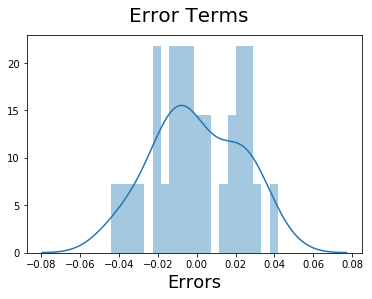

In [456]:
y_train_gmv = lm.predict(x_train_new)
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

In [457]:
num_vars = col1
num_vars

['pincode',
 'sla',
 'gmv',
 'Total',
 'TV',
 'Digital',
 'Sponsorship',
 'ContentM',
 'OnlineM',
 'Affiliates',
 'SEM',
 'StockIndex',
 'Mean Temp (°C)',
 'Mean Temp (°C)',
 'Total Rain (mm)',
 'Total Snow (cm)']

In [458]:
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [459]:
#get the independent and dependent
y_test = df_test.pop('gmv')
X_test = df_test

In [460]:
x_train_new.drop('const',axis=1,inplace=True)

In [461]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

Text(0,0.5,'y_pred')

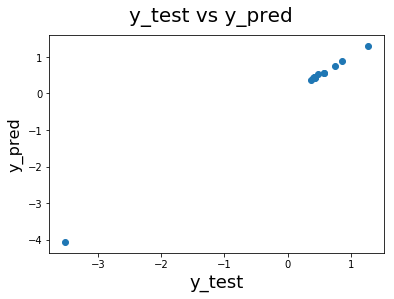

In [462]:
# Making predictions
y_pred = lm.predict(X_test_new)
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16) 

In [463]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))

In [464]:
print(rms)

0.14984949222629668


# 3. LAG MODEL

In [465]:
df_final_ha

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,NPS,StockIndex,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,8.094378,1.570217,434.0,1,15.682458,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,1,NaN,1.137833,-0.356675
1,0,1,7.706163,1.700073,384.0,1,15.278458,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,2,NaN,1.137833,-0.356675
2,1,0,7.955776,1.710025,578.0,1,15.510540,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,3,NaN,1.137833,-0.356675
3,0,0,7.662468,1.741793,370.0,1,15.188175,4.306710,-2.865757,-5.128068,-2.907721,-4.448166,-1.211669,-2.345388,-2.907721,47.093031,6.958448,4,NaN,1.137833,-0.356675
4,1,1,8.083946,1.586727,501.0,1,15.687079,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,5,-0.567984,1.018570,0.074108
5,1,0,7.729296,1.681534,392.0,1,15.254450,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,6,-0.567984,1.018570,0.074108
6,1,1,8.072467,1.616093,584.0,1,15.653053,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,7,-0.567984,1.018570,0.074108
7,0,0,7.808323,1.752745,422.0,1,15.348019,3.872284,-3.392691,-3.694316,-1.881035,-4.859028,-1.352470,-2.476400,-2.758967,50.327406,7.108244,8,-0.567984,1.018570,0.074108
8,0,1,7.728856,1.765309,415.0,1,15.202025,4.605416,-2.112792,-3.600869,-0.614946,-5.337058,-1.428402,-2.515411,-2.695380,49.020550,6.922644,9,1.979468,1.684634,-1.098612
9,1,0,8.030410,1.672491,696.0,1,15.607059,4.605416,-2.112792,-3.600869,-0.614946,-5.337058,-1.428402,-2.515411,-2.695380,49.020550,6.922644,10,1.979468,1.684634,-1.098612


Creatig home audio file

In [466]:
#Merge the weather and home audio dataframe

df_final_ha = pd.merge(df_haudio_,df_we_final, how='inner',left_on='week_x', right_on='week')

In [467]:
print(df_final_ha.shape)

(50, 30)


In [468]:
df_final_ha.columns

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Month_x', 'Year_x', 'week_x', 'Total Investment', 'TV',
       'Digital', 'Sponsorship', 'ContentM', 'OnlineM', 'Affiliates', 'SEM',
       'Radio', 'Other', 'week_y', 'NPS', 'StockIndex', 'Month_y', 'Year_y',
       'week', 'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')

In [469]:
#Drop the irrelevant columns

df_final_ha.drop(['Month_x','Year_x','Month_y','Year_y', 'week_x', 'week_y'],axis=1,inplace=True)

In [470]:
# Checking the percentage of missing values
round(100*(df_final_ha.isnull().sum()/len(df_final_ha.index)), 2)

special_sale         0.0
payday               0.0
pincode              0.0
cust_id              0.0
sla                  0.0
Prepaid              0.0
COD                  0.0
gmv                  0.0
Total Investment     8.0
TV                   8.0
Digital              8.0
Sponsorship          8.0
ContentM             8.0
OnlineM              8.0
Affiliates           8.0
SEM                  8.0
Radio               74.0
Other               74.0
NPS                  8.0
StockIndex           8.0
week                 0.0
Mean Temp (°C)       0.0
Total Rain (mm)      0.0
Total Snow (cm)      0.0
dtype: float64

In [471]:
df_final_ha.drop(['Radio','Other'],axis=1,inplace=True)

In [472]:
#drop the null values
df_final_ha= df_final_ha.dropna() 

In [473]:
# Checking the percentage of missing values
round(100*(df_final_ha.isnull().sum()/len(df_final_ha.index)), 2)

special_sale        0.0
payday              0.0
pincode             0.0
cust_id             0.0
sla                 0.0
Prepaid             0.0
COD                 0.0
gmv                 0.0
Total Investment    0.0
TV                  0.0
Digital             0.0
Sponsorship         0.0
ContentM            0.0
OnlineM             0.0
Affiliates          0.0
SEM                 0.0
NPS                 0.0
StockIndex          0.0
week                0.0
Mean Temp (°C)      0.0
Total Rain (mm)     0.0
Total Snow (cm)     0.0
dtype: float64

In [474]:
# Change the data type to add two digits for Month
df_week_month.week = df_week_month.week.astype(str).str.zfill(2)
df_week_month.Year = df_week_month.Year.astype(str)

In [475]:
df_week_month

,Month,Year,week
week_of_year,,,
1,1,2016,01
2,1,2016,02
3,1,2016,03
4,1,2016,04
5,2,2016,05
6,2,2016,06
7,2,2016,07
8,2,2016,08
9,3,2016,09


In [476]:
# Change the data type back to int
df_week_month['YearWeek'] = df_week_month['Year']+df_week_month['week']

In [477]:
df_week_month.week = df_week_month.week.astype(int)
df_week_month.YearWeek = df_week_month.YearWeek.astype(int)

In [478]:
#Merge Home Audio and week_month dataframe

df_ha_lag = pd.merge(df_final_ha,df_week_month,how='inner',on=['week'])

In [479]:
df_ha_lag.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46 entries, 0 to 45
Data columns (total 25 columns):
special_sale        46 non-null int32
payday              46 non-null int32
pincode             46 non-null int64
cust_id             46 non-null int64
sla                 46 non-null float64
Prepaid             46 non-null float64
COD                 46 non-null uint8
gmv                 46 non-null float64
Total Investment    46 non-null float64
TV                  46 non-null float64
Digital             46 non-null float64
Sponsorship         46 non-null float64
ContentM            46 non-null float64
OnlineM             46 non-null float64
Affiliates          46 non-null float64
SEM                 46 non-null float64
NPS                 46 non-null float64
StockIndex          46 non-null float64
week                46 non-null int64
Mean Temp (°C)      46 non-null float64
Total Rain (mm)     46 non-null float64
Total Snow (cm)     46 non-null float64
Month               46 non-nu

In [480]:
df_ha_lag.drop(['week','Month','Year','Total Investment'],axis=1,inplace=True)

In [481]:
df_ha_lag.sort_values(by='YearWeek')

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm),YearWeek
25,1,1,2307,2307,7.196792,513.0,1,4.192622e+06,0.003732,0.043906,0.128514,1.617022e-05,0.023006,0.009486,0.087077,54.599588,1177.0,21.976923,1.492593,0.000000,201529
26,0,0,2142,2142,7.217554,438.0,1,3.770112e+06,0.003732,0.043906,0.128514,1.617022e-05,0.023006,0.009486,0.087077,54.599588,1177.0,21.976923,1.492593,0.000000,201530
27,0,0,1488,1488,7.344086,316.0,1,2.686310e+06,0.003732,0.043906,0.128514,1.617022e-05,0.023006,0.009486,0.087077,54.599588,1177.0,21.976923,1.492593,0.000000,201531
28,0,0,1,1,9.000000,1.0,0,2.599000e+03,0.000335,0.066460,0.055293,3.289068e-07,0.006721,0.003832,0.130703,59.987101,1206.0,22.915789,3.580000,0.000000,201532
29,0,1,1749,1749,5.709548,393.0,1,2.984310e+06,0.050434,0.017635,0.816239,7.933797e-03,0.212940,0.065497,0.080628,46.925419,1101.0,20.913333,3.518182,0.000000,201536
30,0,0,2001,2001,5.626687,389.0,1,3.401017e+06,0.050434,0.017635,0.816239,7.933797e-03,0.212940,0.065497,0.080628,46.925419,1101.0,20.913333,3.518182,0.000000,201537
31,0,1,1792,1792,6.321987,383.0,1,3.026059e+06,0.050434,0.017635,0.816239,7.933797e-03,0.212940,0.065497,0.080628,46.925419,1101.0,20.913333,3.518182,0.000000,201538
32,0,0,2126,2126,6.430856,442.0,1,3.315670e+06,0.050434,0.017635,0.816239,7.933797e-03,0.212940,0.065497,0.080628,46.925419,1101.0,20.913333,3.518182,0.000000,201539
33,0,1,2017,2017,6.437283,426.0,1,3.336601e+06,0.079881,0.164092,1.100743,4.477297e-02,0.316833,0.090658,0.415051,44.398389,1210.0,14.980000,0.888889,0.000000,201540
34,0,0,1771,1771,5.988707,344.0,1,2.869562e+06,0.079881,0.164092,1.100743,4.477297e-02,0.316833,0.090658,0.415051,44.398389,1210.0,14.980000,0.888889,0.000000,201541


# One Week Lag

In [482]:
#Shift the week_month dataframe by one week to create lag

df_ha_lag_1wk = df_ha_lag.set_index(["YearWeek"]).shift(1)

In [483]:
df_ha_lag_1wk.head()

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
YearWeek,,,,,,,,,,,,,,,,,,,,
201601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201602,0.0,0.0,3276.0,3276.0,4.807692,434.0,1.0,6.468521e+06,0.05694,0.005928,0.0546,0.0117,0.2977,0.09581,0.0546,47.093031,1052.0,-1.828571,3.12,0.7
201603,0.0,1.0,2222.0,2222.0,5.474347,384.0,1.0,4.318671e+06,0.05694,0.005928,0.0546,0.0117,0.2977,0.09581,0.0546,47.093031,1052.0,-1.828571,3.12,0.7
201604,1.0,0.0,2852.0,2852.0,5.529102,578.0,1.0,5.446807e+06,0.05694,0.005928,0.0546,0.0117,0.2977,0.09581,0.0546,47.093031,1052.0,-1.828571,3.12,0.7
201605,0.0,0.0,2127.0,2127.0,5.707569,370.0,1.0,3.945851e+06,0.05694,0.005928,0.0546,0.0117,0.2977,0.09581,0.0546,47.093031,1052.0,-1.828571,3.12,0.7


In [484]:
#Merge dataframes and suffix the variables with Current and Previous

df_ha_lag_1wk_final = pd.merge(df_ha_lag,df_ha_lag_1wk,how='inner',on=['YearWeek'],suffixes=['_Current','_Previous'])

In [485]:
df_ha_lag_1wk_final.shape

(46, 41)

In [486]:
#Drop Null values

df_ha_lag_1wk_final = df_ha_lag_1wk_final.dropna() 

In [487]:
df_ha_lag_1wk_final.drop('gmv_Previous',axis=1,inplace=True)

In [488]:
df_ha_lag_1wk_final.shape

(45, 40)

In [489]:
df_ha_lag_1wk_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45 entries, 1 to 45
Data columns (total 40 columns):
special_sale_Current        45 non-null int32
payday_Current              45 non-null int32
pincode_Current             45 non-null int64
cust_id_Current             45 non-null int64
sla_Current                 45 non-null float64
Prepaid_Current             45 non-null float64
COD_Current                 45 non-null uint8
gmv_Current                 45 non-null float64
TV_Current                  45 non-null float64
Digital_Current             45 non-null float64
Sponsorship_Current         45 non-null float64
ContentM_Current            45 non-null float64
OnlineM_Current             45 non-null float64
Affiliates_Current          45 non-null float64
SEM_Current                 45 non-null float64
NPS_Current                 45 non-null float64
StockIndex_Current          45 non-null float64
Mean Temp (°C)_Current      45 non-null float64
Total Rain (mm)_Current     45 non-null flo

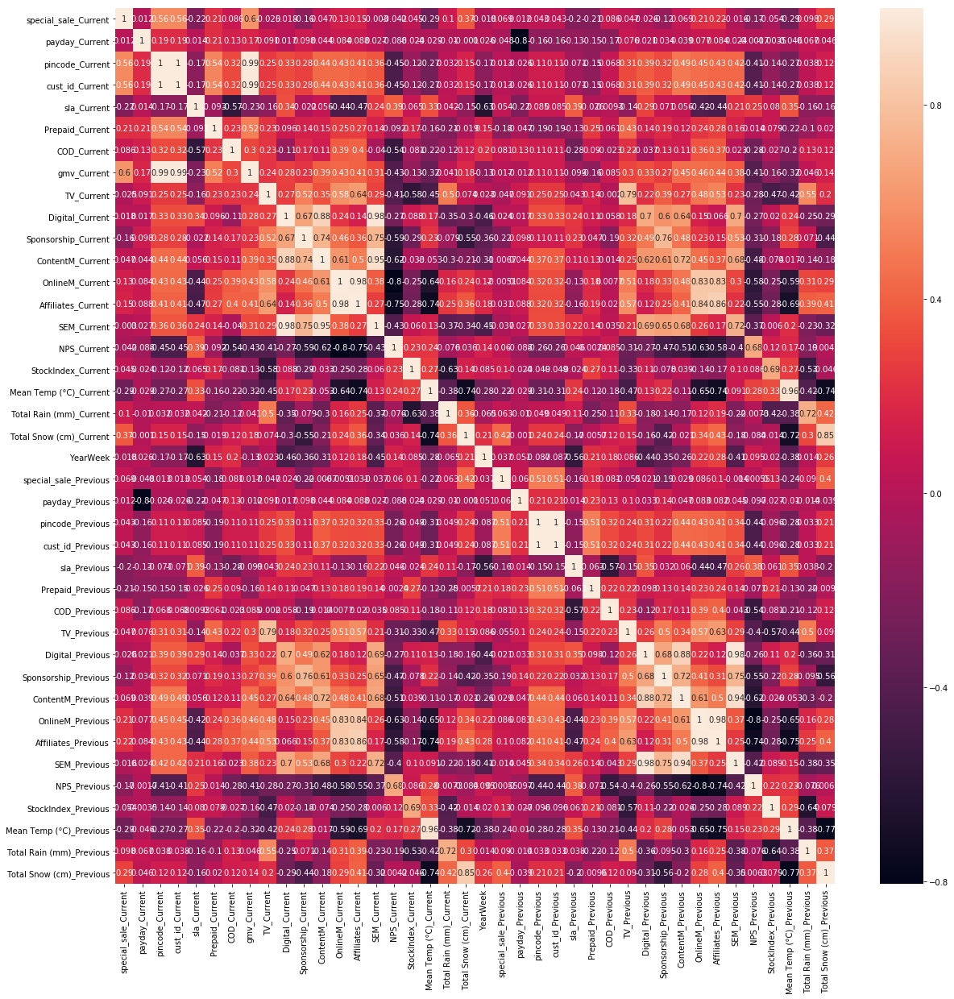

In [490]:
#CHECK FOR MULTICOLLINEARITY
plt.figure(figsize=(20,20))
sns.heatmap(df_ha_lag_1wk_final.corr(), annot=True)

In [491]:
#Drop "Mean Temp" which is highly collinear

df_ha_lag_1wk_final.drop(['Mean Temp (°C)_Previous'],axis=1,inplace=True)

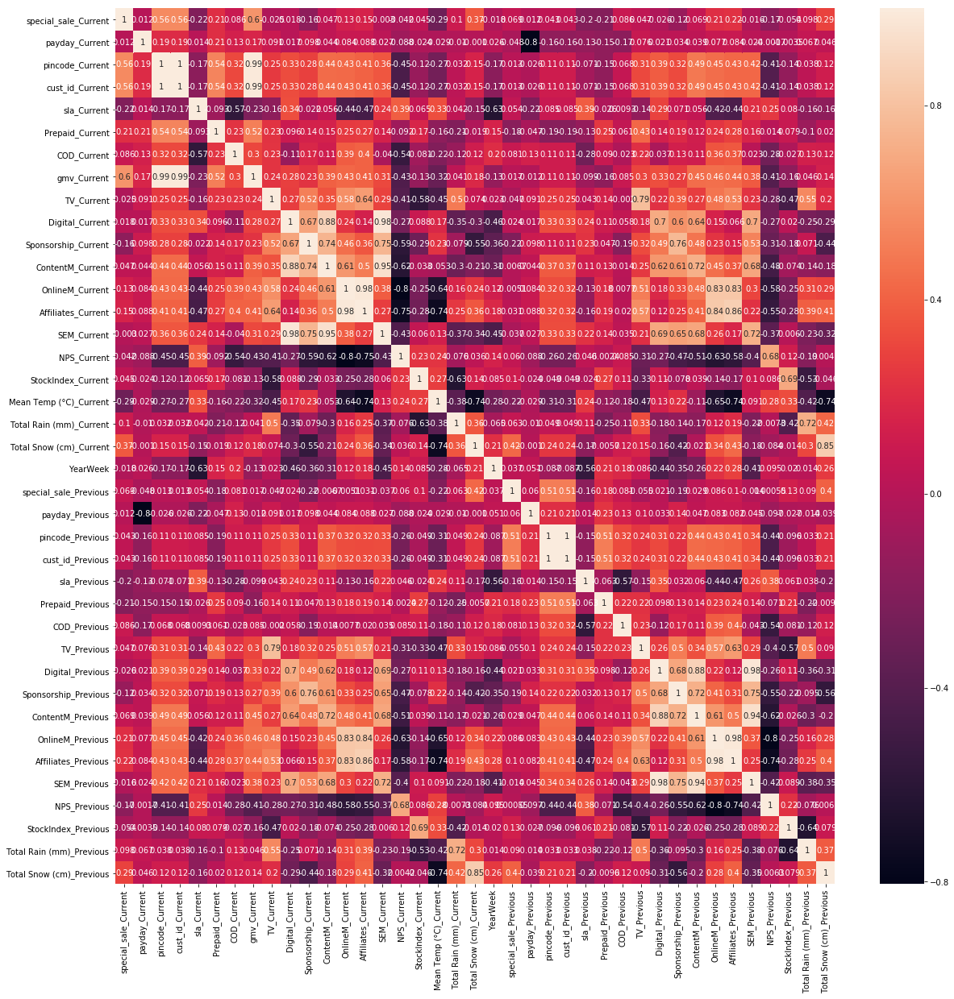

In [492]:
#CHECK FOR MULTICOLLINEARITY
plt.figure(figsize=(20,20))
sns.heatmap(df_ha_lag_1wk_final.corr(), annot=True)

In [493]:
#Drop pincode_current which is highly collinear 

df_ha_lag_1wk_final.drop(['pincode_Current'],axis=1,inplace=True)

In [494]:
df_ha_lag_1wk_final

,special_sale_Current,payday_Current,cust_id_Current,sla_Current,Prepaid_Current,COD_Current,gmv_Current,TV_Current,Digital_Current,Sponsorship_Current,ContentM_Current,OnlineM_Current,Affiliates_Current,SEM_Current,NPS_Current,StockIndex_Current,Mean Temp (°C)_Current,Total Rain (mm)_Current,Total Snow (cm)_Current,YearWeek,special_sale_Previous,payday_Previous,pincode_Previous,cust_id_Previous,sla_Previous,Prepaid_Previous,COD_Previous,TV_Previous,Digital_Previous,Sponsorship_Previous,ContentM_Previous,OnlineM_Previous,Affiliates_Previous,SEM_Previous,NPS_Previous,StockIndex_Previous,Total Rain (mm)_Previous,Total Snow (cm)_Previous
1,0,1,2222,5.474347,384.0,1,4.318671e+06,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,-1.828571,3.120000,0.700000,201602,0.0,0.0,3276.0,3276.0,4.807692,434.0,1.0,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,3.120000,0.700000
2,1,0,2852,5.529102,578.0,1,5.446807e+06,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,-1.828571,3.120000,0.700000,201603,0.0,1.0,2222.0,2222.0,5.474347,384.0,1.0,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,3.120000,0.700000
3,0,0,2127,5.707569,370.0,1,3.945851e+06,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,-1.828571,3.120000,0.700000,201604,1.0,0.0,2852.0,2852.0,5.529102,578.0,1.0,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,3.120000,0.700000
4,1,1,3242,4.887724,501.0,1,6.498483e+06,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,0.566667,2.769231,1.076923,201605,0.0,0.0,2127.0,2127.0,5.707569,370.0,1.0,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,3.120000,0.700000
5,1,0,2274,5.373791,392.0,1,4.216224e+06,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,0.566667,2.769231,1.076923,201606,1.0,1.0,3242.0,3242.0,4.887724,501.0,1.0,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,2.769231,1.076923
6,1,1,3205,5.033385,584.0,1,6.281084e+06,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,0.566667,2.769231,1.076923,201607,1.0,0.0,2274.0,2274.0,5.373791,392.0,1.0,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,2.769231,1.076923
7,0,0,2461,5.770419,422.0,1,4.629776e+06,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,0.566667,2.769231,1.076923,201608,1.0,1.0,3205.0,3205.0,5.033385,584.0,1.0,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,2.769231,1.076923
8,0,1,2273,5.843379,415.0,1,4.000879e+06,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,7.238889,5.390476,0.333333,201609,0.0,0.0,2461.0,2461.0,5.770419,422.0,1.0,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,2.769231,1.076923
9,1,0,3073,5.325415,696.0,1,5.998734e+06,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,7.238889,5.390476,0.333333,201610,0.0,1.0,2273.0,2273.0,5.843379,415.0,1.0,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,5.390476,0.333333
10,0,1,2207,5.420933,419.0,1,4.102625e+06,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,7.238889,5.390476,0.333333,201611,1.0,0.0,3073.0,3073.0,5.325415,696.0,1.0,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,5.390476,0.333333


# Linear model

In [495]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [496]:
df_train_lg1,df_test_lg1 = train_test_split(df_ha_lag_1wk_final,train_size=0.7,test_size=0.3,random_state=True)

In [497]:
print(df_train_lg1.shape)
print(df_test_lg1.shape)

(31, 38)
(14, 38)


In [498]:
num_vars = df_train_lg1.columns

df_train_lg1[num_vars] = scaler.fit_transform(df_train_lg1[num_vars])

In [499]:
num_vars

Index(['special_sale_Current', 'payday_Current', 'cust_id_Current',
       'sla_Current', 'Prepaid_Current', 'COD_Current', 'gmv_Current',
       'TV_Current', 'Digital_Current', 'Sponsorship_Current',
       'ContentM_Current', 'OnlineM_Current', 'Affiliates_Current',
       'SEM_Current', 'NPS_Current', 'StockIndex_Current',
       'Mean Temp (°C)_Current', 'Total Rain (mm)_Current',
       'Total Snow (cm)_Current', 'YearWeek', 'special_sale_Previous',
       'payday_Previous', 'pincode_Previous', 'cust_id_Previous',
       'sla_Previous', 'Prepaid_Previous', 'COD_Previous', 'TV_Previous',
       'Digital_Previous', 'Sponsorship_Previous', 'ContentM_Previous',
       'OnlineM_Previous', 'Affiliates_Previous', 'SEM_Previous',
       'NPS_Previous', 'StockIndex_Previous', 'Total Rain (mm)_Previous',
       'Total Snow (cm)_Previous'],
      dtype='object')

In [500]:
y_train = df_train_lg1.pop('gmv_Current')
x_train = df_train_lg1

    Feature selection

In [501]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [502]:
#Recursive Feature selection

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]

In [503]:
col

Index(['cust_id_Current', 'NPS_Current', 'YearWeek', 'COD_Previous',
       'Sponsorship_Previous', 'OnlineM_Previous', 'Affiliates_Previous',
       'NPS_Previous', 'Total Rain (mm)_Previous', 'Total Snow (cm)_Previous'],
      dtype='object')

In [504]:
# Creating X_test dataframe 020 RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     160.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.85e-17
Time:                        23:17:26   Log-Likelihood:                 71.992
No. Observations:                  31   AIC:                            -122.0
Df Residuals:                      20   BIC:                            -106.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [505]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_rfe .drop(["COD_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     186.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.52e-18
Time:                        23:17:26   Log-Likelihood:                 71.992
No. Observations:                  31   AIC:                            -124.0
Df Residuals:                      21   BIC:                            -109.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [506]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new.drop(["Affiliates_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     219.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.64e-19
Time:                        23:17:26   Log-Likelihood:                 71.964
No. Observations:                  31   AIC:                            -125.9
Df Residuals:                      22   BIC:                            -113.0
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [507]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new.drop(["NPS_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.983
Method:                 Least Squares   F-statistic:                     242.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.18e-20
Time:                        23:17:26   Log-Likelihood:                 70.771
No. Observations:                  31   AIC:                            -125.5
Df Residuals:                      23   BIC:                            -114.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [508]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new.drop(["Total Rain (mm)_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     271.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.70e-21
Time:                        23:17:27   Log-Likelihood:                 69.487
No. Observations:                  31   AIC:                            -125.0
Df Residuals:                      24   BIC:                            -114.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [509]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new.drop(["YearWeek"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     303.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.55e-21
Time:                        23:17:27   Log-Likelihood:                 67.786
No. Observations:                  31   AIC:                            -123.6
Df Residuals:                      25   BIC:                            -115.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [510]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new.drop(["NPS_Current"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     352.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.07e-22
Time:                        23:17:27   Log-Likelihood:                 66.062
No. Observations:                  31   AIC:                            -122.1
Df Residuals:                      26   BIC:                            -115.0
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [511]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new.drop(["Total Snow (cm)_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.981
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     457.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.05e-23
Time:                        23:17:27   Log-Likelihood:                 65.054
No. Observations:                  31   AIC:                            -122.1
Df Residuals:                      27   BIC:                            -116.4
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0425 

In [512]:
#dropping OnlineM as its p-value is high
x_train_new = x_train_new.drop(["OnlineM_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.979
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     638.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.36e-24
Time:                        23:17:27   Log-Likelihood:                 63.427
No. Observations:                  31   AIC:                            -120.9
Df Residuals:                      28   BIC:                            -116.6
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0319 

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

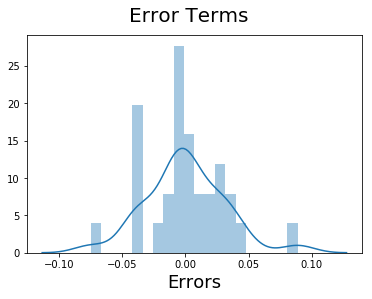

In [513]:
y_train_gmv = lm.predict(x_train_new)
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

In [514]:
num_vars = df_test_lg1.columns
df_test_lg1[num_vars] = scaler.transform(df_test_lg1[num_vars])
y_test = df_test_lg1.pop('gmv_Current')
X_test = df_test_lg1
x_train_new.drop('const',axis=1,inplace=True)

In [515]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [516]:
# Making predictions
y_pred = lm.predict(X_test_new)

Text(0,0.5,'y_pred')

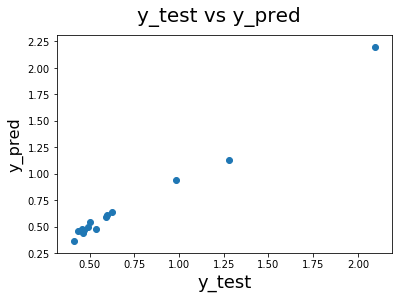

In [517]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)  

In [518]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))

In [519]:
print(rms)

0.0570278306014817


# Two week lag model

In [520]:
#create a dataframe with 2 week shifting

df_ha_lag2wk = df_ha_lag.set_index(["YearWeek"]).shift(2)

In [521]:
df_ha_lag1wk = df_ha_lag.set_index(["YearWeek"]).shift(1)

In [522]:
#Merge dataframes one week lag and 2 week lag and suffix the features with _2Previous and _1Previous

df_lag_2 = pd.merge(df_ha_lag2wk,df_ha_lag1wk,how='inner',on=['YearWeek'],suffixes=['_2Previous','_1Previous'])

In [523]:
#Merge Final and 2 week lag dataframe

df = pd.merge(df_ha_lag,df_lag_2,how='inner',on=['YearWeek'])

In [524]:
df = df.dropna() 

In [525]:
df.drop('gmv_1Previous',axis=1,inplace=True)
df.drop('gmv_2Previous',axis=1,inplace=True)

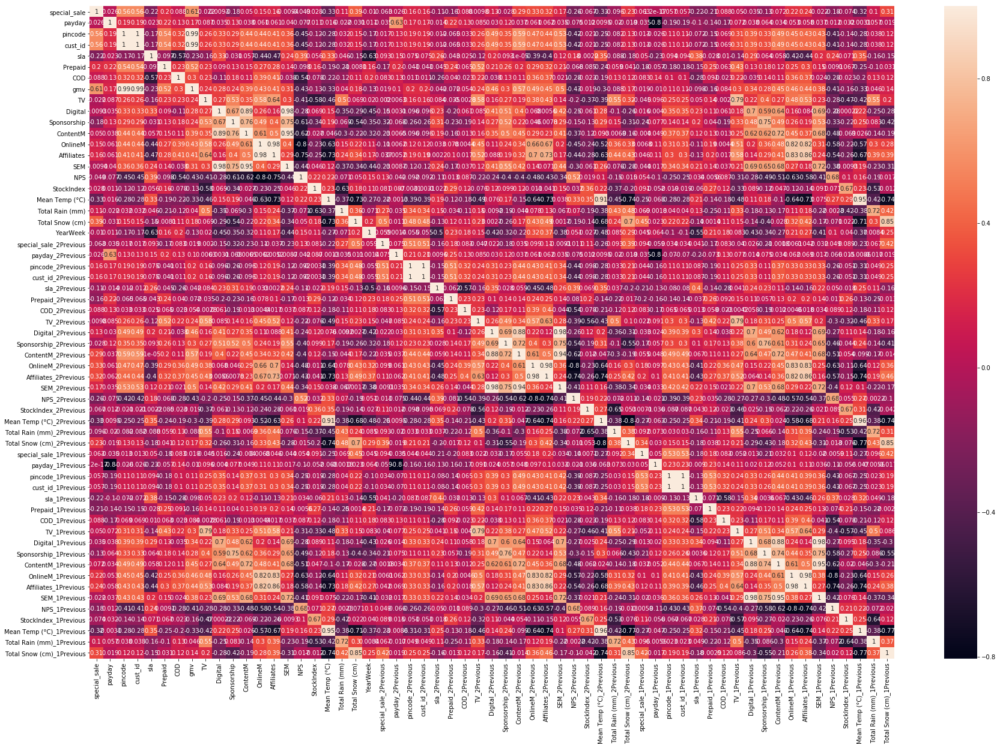

In [526]:
#CHECK FOR MULTICOLLINEARITY
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(), annot=True)
plt.show()

In [527]:
df.drop(['sla'],axis=1,inplace=True)

In [528]:
# import sikit learn
from sklearn.model_selection import train_test_split
# divide data into train and test
df_train,df_test = train_test_split(df,train_size=0.7,test_size=0.3,random_state=True)
print(df_train.shape)
print(df_test.shape)

(30, 58)
(14, 58)


In [529]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = df_train.columns
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
num_vars

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'Prepaid', 'COD', 'gmv',
       'TV', 'Digital', 'Sponsorship', 'ContentM', 'OnlineM', 'Affiliates',
       'SEM', 'NPS', 'StockIndex', 'Mean Temp (°C)', 'Total Rain (mm)',
       'Total Snow (cm)', 'YearWeek', 'special_sale_2Previous',
       'payday_2Previous', 'pincode_2Previous', 'cust_id_2Previous',
       'sla_2Previous', 'Prepaid_2Previous', 'COD_2Previous', 'TV_2Previous',
       'Digital_2Previous', 'Sponsorship_2Previous', 'ContentM_2Previous',
       'OnlineM_2Previous', 'Affiliates_2Previous', 'SEM_2Previous',
       'NPS_2Previous', 'StockIndex_2Previous', 'Mean Temp (°C)_2Previous',
       'Total Rain (mm)_2Previous', 'Total Snow (cm)_2Previous',
       'special_sale_1Previous', 'payday_1Previous', 'pincode_1Previous',
       'cust_id_1Previous', 'sla_1Previous', 'Prepaid_1Previous',
       'COD_1Previous', 'TV_1Previous', 'Digital_1Previous',
       'Sponsorship_1Previous', 'ContentM_1Previous', 'OnlineM_1Previous',


In [530]:
#Fit the Model

y_train = df_train.pop('gmv')
x_train = df_train
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [531]:
#Recursive Feature Selection

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]
col

Index(['pincode', 'cust_id', 'Prepaid', 'TV', 'Digital_2Previous',
       'Mean Temp (°C)_2Previous', 'pincode_1Previous', 'COD_1Previous',
       'ContentM_1Previous', 'SEM_1Previous'],
      dtype='object')

In [532]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]

In [533]:
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     230.9
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.29e-18
Time:                        23:18:06   Log-Likelihood:                 75.233
No. Observations:                  30   AIC:                            -130.5
Df Residuals:                      20   BIC:                            -116.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [534]:
x_train_new = x_train_rfe.drop(["SEM_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     266.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.39e-19
Time:                        23:18:06   Log-Likelihood:                 74.908
No. Observations:                  30   AIC:                            -131.8
Df Residuals:                      21   BIC:                            -119.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [535]:
x_train_new = x_train_new.drop(["pincode_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     304.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.16e-20
Time:                        23:18:07   Log-Likelihood:                 74.188
No. Observations:                  30   AIC:                            -132.4
Df Residuals:                      22   BIC:                            -121.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [536]:
x_train_new = x_train_new.drop(["COD_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     364.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.31e-21
Time:                        23:18:07   Log-Likelihood:                 73.919
No. Observations:                  30   AIC:                            -133.8
Df Residuals:                      23   BIC:                            -124.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [537]:
x_train_new = x_train_new.drop(["ContentM_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     428.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.22e-22
Time:                        23:18:07   Log-Likelihood:                 72.981
No. Observations:                  30   AIC:                            -134.0
Df Residuals:                      24   BIC:                            -125.6
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [538]:
x_train_new = x_train_new.drop(["Prepaid"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     512.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.37e-23
Time:                        23:18:07   Log-Likelihood:                 71.722
No. Observations:                  30   AIC:                            -133.4
Df Residuals:                      25   BIC:                            -126.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

In [539]:
y_train_gmv = lm.predict(x_train_new)

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

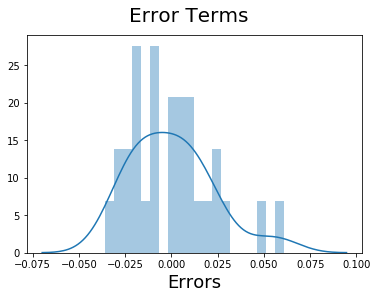

In [540]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

In [541]:
num_vars = df_test.columns
df_test[num_vars] = scaler.transform(df_test[num_vars])
y_test = df_test.pop('gmv')
X_test = df_test
x_train_new.drop('const',axis=1,inplace=True)

In [542]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [543]:
# Making predictions
y_pred = lm.predict(X_test_new)

Text(0,0.5,'y_pred')

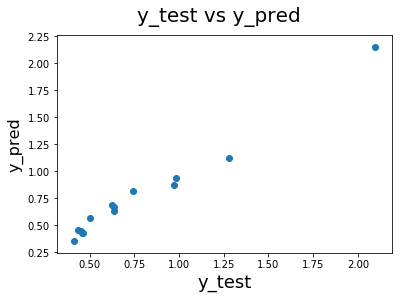

In [544]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)  

In [545]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

0.06656479935145329


RMSE for two week lagged model is 0.066

# Koyck model for home audio

In [546]:
df_final_ha

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Total Investment,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,NPS,StockIndex,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,3276,3276,4.807692,434.0,1,6.468521e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,1,-1.828571,3.120000,0.700000
1,0,1,2222,2222,5.474347,384.0,1,4.318671e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,2,-1.828571,3.120000,0.700000
2,1,0,2852,2852,5.529102,578.0,1,5.446807e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,3,-1.828571,3.120000,0.700000
3,0,0,2127,2127,5.707569,370.0,1,3.945851e+06,74.196000,0.056940,0.005928,0.054600,1.170000e-02,0.297700,0.095810,0.054600,47.093031,1052.0,4,-1.828571,3.120000,0.700000
4,1,1,3242,3242,4.887724,501.0,1,6.498483e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,5,0.566667,2.769231,1.076923
5,1,0,2274,2274,5.373791,392.0,1,4.216224e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,6,0.566667,2.769231,1.076923
6,1,1,3205,3205,5.033385,584.0,1,6.281084e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,7,0.566667,2.769231,1.076923
7,0,0,2461,2461,5.770419,422.0,1,4.629776e+06,48.052000,0.033618,0.024864,0.152432,7.758023e-03,0.258601,0.084045,0.063357,50.327406,1222.0,8,0.566667,2.769231,1.076923
8,0,1,2273,2273,5.843379,415.0,1,4.000879e+06,100.024621,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,9,7.238889,5.390476,0.333333
9,1,0,3073,3073,5.325415,696.0,1,5.998734e+06,100.024621,0.120900,0.027300,0.540670,4.810000e-03,0.239692,0.080830,0.067517,49.020550,1015.0,10,7.238889,5.390476,0.333333


In [547]:
df_final_ha3 = df_final_ha

In [548]:
gmv_week_one = df_final_ha3.gmv.shift(1)

In [549]:
df_final_ha3['gmv_lag_one'] = gmv_week_one

In [550]:
df_final_ha3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46 entries, 0 to 48
Data columns (total 23 columns):
special_sale        46 non-null int32
payday              46 non-null int32
pincode             46 non-null int64
cust_id             46 non-null int64
sla                 46 non-null float64
Prepaid             46 non-null float64
COD                 46 non-null uint8
gmv                 46 non-null float64
Total Investment    46 non-null float64
TV                  46 non-null float64
Digital             46 non-null float64
Sponsorship         46 non-null float64
ContentM            46 non-null float64
OnlineM             46 non-null float64
Affiliates          46 non-null float64
SEM                 46 non-null float64
NPS                 46 non-null float64
StockIndex          46 non-null float64
week                46 non-null int64
Mean Temp (°C)      46 non-null float64
Total Rain (mm)     46 non-null float64
Total Snow (cm)     46 non-null float64
gmv_lag_one         45 non-nu

In [551]:
df_final_ha3 = df_final_ha3.dropna()

In [552]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [553]:
# import sikit learn
from sklearn.model_selection import train_test_split

In [554]:
# divide data into train and test
df_train,df_test = train_test_split(df_final_ha3,train_size=0.7,test_size=0.3,random_state=True)

In [555]:
print(df_train.shape)
print(df_test.shape)

(31, 23)
(14, 23)


In [556]:
df_train.columns

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'ContentM',
       'OnlineM', 'Affiliates', 'SEM', 'NPS', 'StockIndex', 'week',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'gmv_lag_one'],
      dtype='object')

In [557]:
num_vars = ['pincode', 'sla', 'COD', 'gmv', 'cust_id',         
       'week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'ContentM', 'OnlineM',
       'Affiliates', 'SEM', 'NPS', 'StockIndex',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'gmv_lag_one']

In [558]:
#scale and transform
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

num_vars

['pincode',
 'sla',
 'COD',
 'gmv',
 'cust_id',
 'week',
 'Total Investment',
 'TV',
 'Digital',
 'Sponsorship',
 'ContentM',
 'OnlineM',
 'Affiliates',
 'SEM',
 'NPS',
 'StockIndex',
 'Mean Temp (°C)',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'gmv_lag_one']

In [559]:
y_train = df_train.pop('gmv')
x_train = df_train

In [560]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [561]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)

In [562]:
list(zip(x_train.columns,rfe.support_,rfe.ranking_))

[('special_sale', False, 11),
 ('payday', False, 12),
 ('pincode', True, 1),
 ('cust_id', True, 1),
 ('sla', True, 1),
 ('Prepaid', False, 13),
 ('COD', True, 1),
 ('Total Investment', False, 7),
 ('TV', True, 1),
 ('Digital', True, 1),
 ('Sponsorship', True, 1),
 ('ContentM', True, 1),
 ('OnlineM', False, 6),
 ('Affiliates', False, 10),
 ('SEM', False, 2),
 ('NPS', False, 3),
 ('StockIndex', False, 8),
 ('week', True, 1),
 ('Mean Temp (°C)', False, 5),
 ('Total Rain (mm)', True, 1),
 ('Total Snow (cm)', False, 4),
 ('gmv_lag_one', False, 9)]

In [563]:
col = x_train.columns[rfe.support_]
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     581.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.12e-23
Time:                        23:18:21   Log-Likelihood:                 89.458
No. Observations:                  31   AIC:                            -158.9
Df Residuals:                      21   BIC:                            -144.6
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0888      0.029     

In [564]:
# dropping Digital
x_train_new = x_train_rfe.drop('ContentM',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     579.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.46e-24
Time:                        23:18:21   Log-Likelihood:                 86.870
No. Observations:                  31   AIC:                            -155.7
Df Residuals:                      22   BIC:                            -142.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.1050      0.029     

In [565]:
# dropping Total Rain (mm)
x_train_new = x_train_new.drop('Total Rain (mm)',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     589.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.13e-24
Time:                        23:18:22   Log-Likelihood:                 84.405
No. Observations:                  31   AIC:                            -152.8
Df Residuals:                      23   BIC:                            -141.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0938      0.030      3.082      

In [566]:
# dropping TV 
x_train_new = x_train_new.drop('TV',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     688.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.24e-25
Time:                        23:18:22   Log-Likelihood:                 83.767
No. Observations:                  31   AIC:                            -153.5
Df Residuals:                      24   BIC:                            -143.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0994      0.030      3.329      

In [567]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,pincode,inf
2,cust_id,inf
0,const,81.260000
3,sla,2.900000
4,COD,2.410000
5,Digital,2.150000
6,Sponsorship,1.410000
7,week,1.300000


In [568]:
# dropping pincode 
x_train_new = x_train_new.drop('pincode',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     688.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.24e-25
Time:                        23:18:22   Log-Likelihood:                 83.767
No. Observations:                  31   AIC:                            -153.5
Df Residuals:                      24   BIC:                            -143.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0994      0.030      3.329      

In [569]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,81.26
2,sla,2.90
3,COD,2.41
4,Digital,2.15
1,cust_id,1.53
5,Sponsorship,1.41
6,week,1.30


PREDICT

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

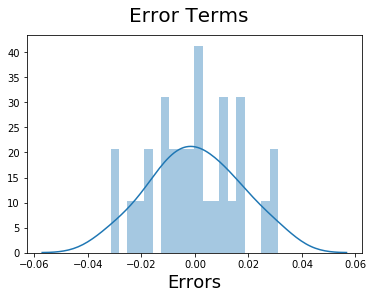

In [570]:
y_train_gmv = lm.predict(x_train_new)
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)    

In [571]:
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [572]:
y_test = df_test.pop('gmv')
X_test = df_test
x_train_new.drop('const',axis=1,inplace=True)

In [573]:
# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

In [575]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

0.619124717266301


RMSE for koyck model for home audio is 0.619

# gaming accessory

In [576]:
#Extracting the gaming category dataset from original dataframe
df_gaming = df_ce[df_ce.product_analytic_sub_category == "GamingAccessory"]

In [577]:
df_gaming.shape

(186382, 14)

In [578]:
df_gaming.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 186382 entries, 1598 to 1508252
Data columns (total 14 columns):
Year                             186382 non-null int64
Month                            186382 non-null int64
order_id                         186382 non-null float64
gmv                              186382 non-null float64
sla                              186382 non-null int64
cust_id                          186382 non-null object
pincode                          186382 non-null object
product_analytic_sub_category    186382 non-null object
product_procurement_sla          186382 non-null int64
payday                           186382 non-null int32
special_sale                     186382 non-null int32
week_of_year                     186382 non-null int64
COD                              186382 non-null uint8
Prepaid                          186382 non-null uint8
dtypes: float64(2), int32(2), int64(5), object(3), uint8(2)
memory usage: 17.4+ MB


In [579]:
df_gaming['week_of_year'].nunique()

53

## Aggregarting data set

<b> GMV

In [580]:
# Creating column week_gmv_gaming based on week numbers with its gmv sum.
week_gmv_gaming  = df_gaming.groupby(['week_of_year'])['gmv'].sum()

<b>PAYMENT TYPE: COD

In [581]:
# Creating column week_cod_gaming based on week numbers with its gmv sum.
week_cod_gaming = df_gaming.groupby(['week_of_year'])['COD'].sum()

<b>Prepaid

In [582]:
# Creating column week_prepaid_gaming based on week numbers with its sla sum.
week_prepaid_gaming = df_gaming.groupby(['week_of_year'])['Prepaid'].sum()

<b>SLA

In [583]:
# Creating column week_sla_gaming based on week numbers with its sla sum.
week_SLA_gaming = df_gaming.groupby(['week_of_year'])['sla'].mean()

<b>cust_id

In [584]:
# Creating column week_sla_gaming based on week numbers with its sla sum.
week_cust_id_gaming = df_gaming.groupby(['week_of_year'])['cust_id'].count()

<b>pincode

In [585]:
# Creating column week_pin_gaming based on week numbers with its pin sum.
week_pin_gaming = df_gaming.groupby(['week_of_year']).agg({"pincode": pd.Series.nunique})

In [586]:
print(week_pin_gaming.head())
print(type(week_pin_gaming))
print(week_pin_gaming.shape)

              pincode
week_of_year         
1                1774
2                1764
3                2027
4                1634
5                1794
<class 'pandas.core.frame.DataFrame'>
(53, 1)


<p>payday

In [587]:
# Creating column week_pay_gaming based on week numbers with its payday sum.
week_pay_gaming = df_gaming.groupby(['week_of_year'])['payday'].max()

In [588]:
print(week_pay_gaming.head())
print(type(week_pay_gaming))
print(week_pay_gaming.shape)

week_of_year
1    0
2    1
3    0
4    0
5    1
Name: payday, dtype: int32
<class 'pandas.core.series.Series'>
(53,)


<b>special sale

In [589]:
# Creating column week_sale_gaming based on week numbers with its special_sale sum.
week_sale_gaming = df_gaming.groupby(['week_of_year'])['special_sale'].max()

In [590]:
week_sale_gaming.head()

week_of_year
1    0
2    0
3    1
4    0
5    1
Name: special_sale, dtype: int32

<b>Month

In [591]:
# Creating column week_month_gaming based on week numbers with its month sum.
week_month_gaming = df_gaming.groupby(['week_of_year'])['Month'].max()

<b>week of the year

In [592]:
# Creating column week_year_gaming based on week numbers with its year sum.
week_year_gaming = df_gaming.groupby(['week_of_year'])['Year'].max()

# COMBINING ALL DATA FRAMES

In [593]:
df_gaming = pd.concat([week_sale_gaming,week_pay_gaming,week_pin_gaming,week_cust_id_gaming,week_SLA_gaming,week_prepaid_gaming,week_cod_gaming,week_gmv_gaming,week_month_gaming,week_year_gaming],axis=1)

In [594]:
df_gaming

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year
week_of_year,,,,,,,,,,
1,0,0,1774,4404,5.882834,716.0,3688.0,3.198651e+06,1,2016
2,0,1,1764,3954,5.875822,662.0,3292.0,2.928568e+06,1,2016
3,1,0,2027,5413,5.927028,1098.0,4315.0,4.442785e+06,1,2016
4,0,0,1634,3533,6.050099,644.0,2889.0,2.760808e+06,1,2016
5,1,1,1794,4166,5.911666,765.0,3401.0,2.859521e+06,2,2016
6,1,0,1799,4136,5.651838,739.0,3397.0,2.787676e+06,2,2016
7,1,1,2127,5731,5.475484,1012.0,4719.0,3.369655e+06,2,2016
8,0,0,2026,5044,6.012292,832.0,4212.0,3.029748e+06,2,2016
9,0,1,2013,4972,5.856597,839.0,4133.0,3.254204e+06,3,2016


In [595]:
df_gaming['week'] = df_gaming.index

In [596]:
df_gaming.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 1 to 53
Data columns (total 11 columns):
special_sale    53 non-null int32
payday          53 non-null int32
pincode         53 non-null int64
cust_id         53 non-null int64
sla             53 non-null float64
Prepaid         53 non-null float64
COD             53 non-null float64
gmv             53 non-null float64
Month           53 non-null int64
Year            53 non-null int64
week            53 non-null int64
dtypes: float64(4), int32(2), int64(5)
memory usage: 4.6 KB


### Combine with media file

In [597]:
#Merging media and gaming dataset on common column Year and month
df_gaming_final = pd.merge(df_gaming, df_media, on=['Year','Month'], how='left')

In [598]:
df_gaming_final.columns

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Month', 'Year', 'week', 'Total Investment', 'TV', 'Digital',
       'Sponsorship', 'ContentM', 'OnlineM', 'Affiliates', 'SEM', 'Radio',
       'Other'],
      dtype='object')

In [599]:
df_gaming_final.rename(columns={'Total Investment':'Total'}, inplace=True)

In [600]:
df_gaming_final[['Radio','Other','SEM','Affiliates','OnlineM','ContentM','Sponsorship','Digital','TV','Total'
                ]] = df_gaming_final[['Radio','Other','SEM','Affiliates','OnlineM','ContentM','Sponsorship','Digital','TV','Total']].fillna(0)

In [601]:
df_gaming_final[['Radio','Other','SEM','Affiliates','OnlineM','ContentM','Sponsorship','Digital','TV','Total','week','Month','Year']]

,Radio,Other,SEM,Affiliates,OnlineM,ContentM,Sponsorship,Digital,TV,Total,week,Month,Year
0,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,1,1,2016
1,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,2,1,2016
2,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,3,1,2016
3,2.70,27.090000,4.200000,7.370000,22.900000,0.900000,4.200000,0.456000,4.380000,74.196000,4,1,2016
4,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,5,2,2016
5,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,6,2,2016
6,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,7,2,2016
7,0.00,0.000000,4.873630,6.465019,19.892366,0.596771,11.725555,1.912651,2.586008,48.052000,8,2,2016
8,0.87,15.945545,5.193591,6.217667,18.437818,0.370000,41.590000,2.100000,9.300000,100.024621,9,3,2016
9,0.87,15.945545,5.193591,6.217667,18.437818,0.370000,41.590000,2.100000,9.300000,100.024621,10,3,2016


In [602]:
#Merging the final dataset withweek count dataframe
df_gaming_final = pd.merge(df_gaming_final, count_week, on=['Year','Month'], how='left')

In [603]:
#multiplying the dataset to product gaming percentage sales ie 0.6%
df_gaming_final['TV'] = (df_gaming_final['TV']/df_gaming_final['week_y'])*0.6
df_gaming_final['Digital'] = (df_gaming_final['Digital']/df_gaming_final['week_y'])*0.6
df_gaming_final['Sponsorship'] = (df_gaming_final['Sponsorship']/df_gaming_final['week_y'])*0.6
df_gaming_final['ContentM'] = (df_gaming_final['ContentM']/df_gaming_final['week_y'])*0.6
df_gaming_final['OnlineM'] = (df_gaming_final['OnlineM']/df_gaming_final['week_y'])*0.6
df_gaming_final['Affiliates'] = (df_gaming_final['Affiliates']/df_gaming_final['week_y'])*0.6
df_gaming_final['SEM'] = (df_gaming_final['SEM']/df_gaming_final['week_y'])*0.6
df_gaming_final['Radio'] = (df_gaming_final['Radio']/df_gaming_final['week_y'])*0.6
df_gaming_final['Other'] = (df_gaming_final['Other']/df_gaming_final['week_y'])*0.6

In [604]:
df_gaming_final

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month,Year,week_x,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,week_y
0,0,0,1774,4404,5.882834,716.0,3688.0,3.198651e+06,1,2016,1,74.196000,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.4050,4.063500,4
1,0,1,1764,3954,5.875822,662.0,3292.0,2.928568e+06,1,2016,2,74.196000,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.4050,4.063500,4
2,1,0,2027,5413,5.927028,1098.0,4315.0,4.442785e+06,1,2016,3,74.196000,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.4050,4.063500,4
3,0,0,1634,3533,6.050099,644.0,2889.0,2.760808e+06,1,2016,4,74.196000,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.4050,4.063500,4
4,1,1,1794,4166,5.911666,765.0,3401.0,2.859521e+06,2,2016,5,48.052000,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.0000,0.000000,4
5,1,0,1799,4136,5.651838,739.0,3397.0,2.787676e+06,2,2016,6,48.052000,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.0000,0.000000,4
6,1,1,2127,5731,5.475484,1012.0,4719.0,3.369655e+06,2,2016,7,48.052000,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.0000,0.000000,4
7,0,0,2026,5044,6.012292,832.0,4212.0,3.029748e+06,2,2016,8,48.052000,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.0000,0.000000,4
8,0,1,2013,4972,5.856597,839.0,4133.0,3.254204e+06,3,2016,9,100.024621,1.395000,0.315000,6.238500,0.055500,2.765673,0.932650,0.779039,0.1305,2.391832,4
9,1,0,2015,5563,5.365091,1246.0,4317.0,4.219761e+06,3,2016,10,100.024621,1.395000,0.315000,6.238500,0.055500,2.765673,0.932650,0.779039,0.1305,2.391832,4


In [605]:
df_gaming_final.shape

(53, 22)

In [606]:
df_gaming_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 0 to 52
Data columns (total 22 columns):
special_sale    53 non-null int32
payday          53 non-null int32
pincode         53 non-null int64
cust_id         53 non-null int64
sla             53 non-null float64
Prepaid         53 non-null float64
COD             53 non-null float64
gmv             53 non-null float64
Month           53 non-null int64
Year            53 non-null int64
week_x          53 non-null int64
Total           53 non-null float64
TV              53 non-null float64
Digital         53 non-null float64
Sponsorship     53 non-null float64
ContentM        53 non-null float64
OnlineM         53 non-null float64
Affiliates      53 non-null float64
SEM             53 non-null float64
Radio           53 non-null float64
Other           53 non-null float64
week_y          53 non-null int64
dtypes: float64(14), int32(2), int64(6)
memory usage: 9.1 KB


### Merge NPS stock data

In [607]:
df_nps_si

,NPS,Year,Month,StockIndex
0,54.599588,2015,7,1177.0
1,59.987101,2015,8,1206.0
2,46.925419,2015,9,1101.0
3,44.398389,2015,10,1210.0
4,47.000000,2015,11,1233.0
5,45.800000,2015,12,1038.0
6,47.093031,2016,1,1052.0
7,50.327406,2016,2,1222.0
8,49.020550,2016,3,1015.0
9,51.827605,2016,4,1242.0


In [608]:
#Merge the dataset with gaming dataset
df_gaming_ = pd.merge(df_gaming_final, df_nps_si, left_on=['Year','Month'], right_on=['Year','Month'],how='left')

In [609]:
df_gaming_.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 0 to 52
Data columns (total 24 columns):
special_sale    53 non-null int32
payday          53 non-null int32
pincode         53 non-null int64
cust_id         53 non-null int64
sla             53 non-null float64
Prepaid         53 non-null float64
COD             53 non-null float64
gmv             53 non-null float64
Month           53 non-null int64
Year            53 non-null int64
week_x          53 non-null int64
Total           53 non-null float64
TV              53 non-null float64
Digital         53 non-null float64
Sponsorship     53 non-null float64
ContentM        53 non-null float64
OnlineM         53 non-null float64
Affiliates      53 non-null float64
SEM             53 non-null float64
Radio           53 non-null float64
Other           53 non-null float64
week_y          53 non-null int64
NPS             49 non-null float64
StockIndex      49 non-null float64
dtypes: float64(16), int32(2), int64(6)
memory us

In [610]:
#Dropping variable week_y and renaming week_x to week for further merging.
df_gaming_ = df_gaming_.drop(["week_y"], axis = 1)
df_gaming_ = df_gaming_.rename(columns = {"week_x": "week"})  

In [611]:
df_gaming_.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 0 to 52
Data columns (total 23 columns):
special_sale    53 non-null int32
payday          53 non-null int32
pincode         53 non-null int64
cust_id         53 non-null int64
sla             53 non-null float64
Prepaid         53 non-null float64
COD             53 non-null float64
gmv             53 non-null float64
Month           53 non-null int64
Year            53 non-null int64
week            53 non-null int64
Total           53 non-null float64
TV              53 non-null float64
Digital         53 non-null float64
Sponsorship     53 non-null float64
ContentM        53 non-null float64
OnlineM         53 non-null float64
Affiliates      53 non-null float64
SEM             53 non-null float64
Radio           53 non-null float64
Other           53 non-null float64
NPS             49 non-null float64
StockIndex      49 non-null float64
dtypes: float64(16), int32(2), int64(5)
memory usage: 9.5 KB


### Merging weather file

In [612]:
# creating a week month mapping table
df_week_month = df_gaming

In [613]:
df_gaming.columns

Index(['special_sale', 'payday', 'pincode', 'cust_id', 'sla', 'Prepaid', 'COD',
       'gmv', 'Month', 'Year', 'week'],
      dtype='object')

In [614]:
df_week_month.shape

(53, 11)

In [615]:
df_week_month.drop(['special_sale','payday','pincode','cust_id','sla','Prepaid','COD','gmv'],axis=1, inplace=True)

In [616]:
df_week_month

,Month,Year,week
week_of_year,,,
1,1,2016,1
2,1,2016,2
3,1,2016,3
4,1,2016,4
5,2,2016,5
6,2,2016,6
7,2,2016,7
8,2,2016,8
9,3,2016,9


# AGGREGATING FUNCTIONS

In [617]:
df_agg

Mean Temp (°C)  Total Rain (mm)  Total Snow (cm)
Year Month                                                  
2015 1           -5.218182         1.575000         0.562500
     2           -8.866667         0.200000         2.142857
     3            0.562500         0.166667         0.055556
     4            9.233333         1.840000         0.000000
     5           18.228571         6.533333         0.000000
     6           20.372000         6.232000         0.000000
     7           21.976923         1.492593         0.000000
     8           22.915789         3.580000         0.000000
     9           20.913333         3.518182         0.000000
     10          14.980000         0.888889         0.000000
     11           9.861538         3.485714         0.714286
     12           5.410000         2.885714         0.000000
2016 1           -1.828571         3.120000         0.700000
     2            0.566667         2.769231         1.076923
     3            7.238889         5.390476         0.333333
     4            7.931579         1.463158         0.315789
     5           16.158824         1.800000         0.000000
     6           22.145000         1.110000         0.000000
     7           25.156522         4.434783         0.000000
     8           24.641667         3.816667         0.000000
     9           20.325000         5.310000         0.000000
     10          13.683333         2.137500         0.000000
     11           7.941176         2.694118         0.000000
     12          -0.827778         1.357895         1.368421

In [618]:
df_we_final = pd.merge(df_week_month,df_agg, how='inner',on=['Year','Month'])

In [619]:
df_we_final.sort_values(by='week')

,Month,Year,week,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,1,2016,1,-1.828571,3.120000,0.700000
1,1,2016,2,-1.828571,3.120000,0.700000
2,1,2016,3,-1.828571,3.120000,0.700000
3,1,2016,4,-1.828571,3.120000,0.700000
4,2,2016,5,0.566667,2.769231,1.076923
5,2,2016,6,0.566667,2.769231,1.076923
6,2,2016,7,0.566667,2.769231,1.076923
7,2,2016,8,0.566667,2.769231,1.076923
8,3,2016,9,7.238889,5.390476,0.333333
9,3,2016,10,7.238889,5.390476,0.333333


In [620]:
print(df_gaming_.shape)
print(df_we_final.shape)

(53, 23)
(53, 6)


In [621]:
df_gaming_.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 0 to 52
Data columns (total 23 columns):
special_sale    53 non-null int32
payday          53 non-null int32
pincode         53 non-null int64
cust_id         53 non-null int64
sla             53 non-null float64
Prepaid         53 non-null float64
COD             53 non-null float64
gmv             53 non-null float64
Month           53 non-null int64
Year            53 non-null int64
week            53 non-null int64
Total           53 non-null float64
TV              53 non-null float64
Digital         53 non-null float64
Sponsorship     53 non-null float64
ContentM        53 non-null float64
OnlineM         53 non-null float64
Affiliates      53 non-null float64
SEM             53 non-null float64
Radio           53 non-null float64
Other           53 non-null float64
NPS             49 non-null float64
StockIndex      49 non-null float64
dtypes: float64(16), int32(2), int64(5)
memory usage: 9.5 KB


In [622]:
df_final_gaming = pd.merge(df_gaming_,df_we_final,how='inner', on = 'week')

In [623]:
df_final_gaming.head()

,special_sale,payday,pincode,cust_id,sla,Prepaid,COD,gmv,Month_x,Year_x,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Month_y,Year_y,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,1774,4404,5.882834,716.0,3688.0,3.198651e+06,1,2016,1,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,1,2016,-1.828571,3.120000,0.700000
1,0,1,1764,3954,5.875822,662.0,3292.0,2.928568e+06,1,2016,2,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,1,2016,-1.828571,3.120000,0.700000
2,1,0,2027,5413,5.927028,1098.0,4315.0,4.442785e+06,1,2016,3,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,1,2016,-1.828571,3.120000,0.700000
3,0,0,1634,3533,6.050099,644.0,2889.0,2.760808e+06,1,2016,4,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,1,2016,-1.828571,3.120000,0.700000
4,1,1,1794,4166,5.911666,765.0,3401.0,2.859521e+06,2,2016,5,48.052,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.000,0.0000,50.327406,1222.0,2,2016,0.566667,2.769231,1.076923


In [624]:
df_final_gaming.drop(['Month_y','Year_y','Month_x','Year_x'],axis=1,inplace=True)

In [625]:
# Checking the percentage of missing values
round(100*(df_final_gaming.isnull().sum()/len(df_final_gaming.index)), 2)

special_sale       0.00
payday             0.00
pincode            0.00
cust_id            0.00
sla                0.00
Prepaid            0.00
COD                0.00
gmv                0.00
week               0.00
Total              0.00
TV                 0.00
Digital            0.00
Sponsorship        0.00
ContentM           0.00
OnlineM            0.00
Affiliates         0.00
SEM                0.00
Radio              0.00
Other              0.00
NPS                7.55
StockIndex         7.55
Mean Temp (°C)     0.00
Total Rain (mm)    0.00
Total Snow (cm)    0.00
dtype: float64

In [626]:
df_final_gaming = df_final_gaming.dropna() 

In [627]:
# Checking the percentage of missing values
round(100*(df_final_gaming.isnull().sum()/len(df_final_gaming.index)), 2)

special_sale       0.0
payday             0.0
pincode            0.0
cust_id            0.0
sla                0.0
Prepaid            0.0
COD                0.0
gmv                0.0
week               0.0
Total              0.0
TV                 0.0
Digital            0.0
Sponsorship        0.0
ContentM           0.0
OnlineM            0.0
Affiliates         0.0
SEM                0.0
Radio              0.0
Other              0.0
NPS                0.0
StockIndex         0.0
Mean Temp (°C)     0.0
Total Rain (mm)    0.0
Total Snow (cm)    0.0
dtype: float64

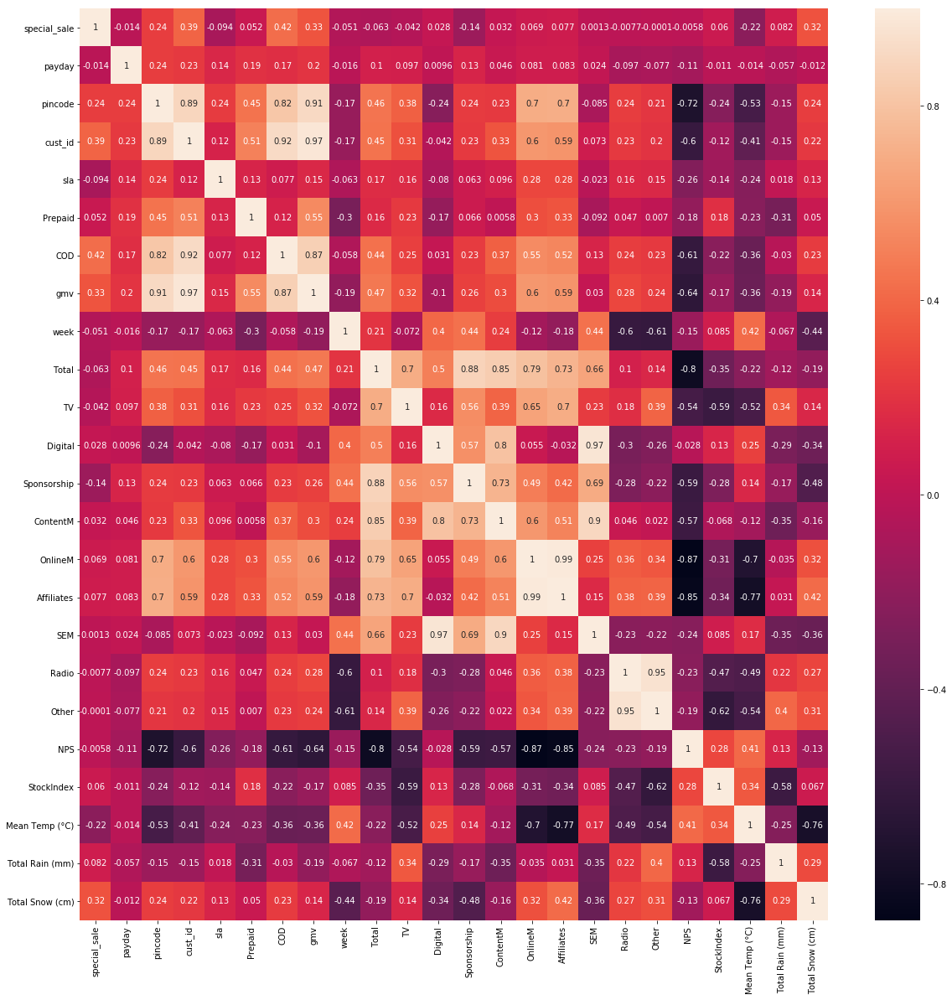

In [628]:
#Plotting heatmap to find out multicollinearity in variables
plt.figure(figsize=(20,20))
sns.heatmap(df_final_gaming.corr(), annot=True)
plt.show()

In [629]:
#Dropping variables having higher multicollinearity with gmv variable(>.95)
df_final_gaming.drop(['cust_id'],axis=1,inplace=True)

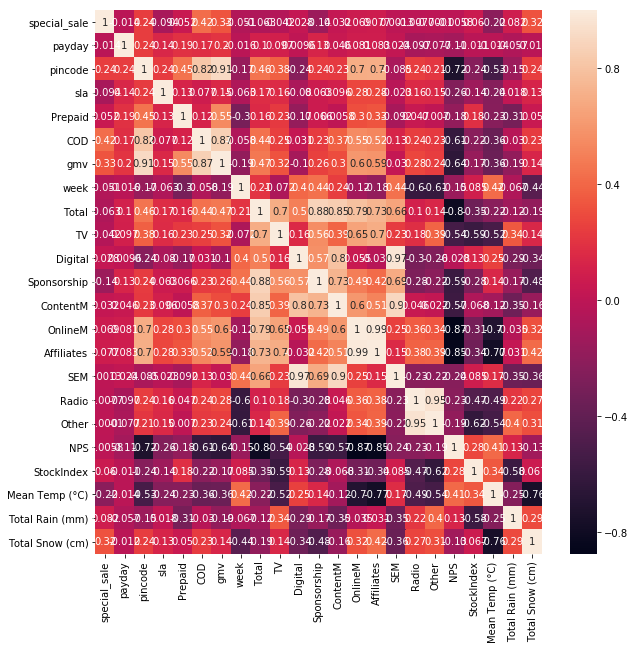

In [630]:
plt.figure(figsize=(10,10))
sns.heatmap(df_final_gaming.corr(), annot=True)
plt.show()

In [631]:
df_final_gaming.shape

(49, 23)

## Model building for gaming

# 1. linear model

In [632]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [633]:
# import sikit learn
from sklearn.model_selection import train_test_split

In [634]:
# divide data into train and test
df_train,df_test = train_test_split(df_final_gaming,train_size=0.7,test_size=0.3,random_state=True)

In [635]:
print(df_train.shape)
print(df_test.shape)

(34, 23)
(15, 23)


In [636]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = df_train.columns

df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

num_vars

Index(['special_sale', 'payday', 'pincode', 'sla', 'Prepaid', 'COD', 'gmv',
       'week', 'Total', 'TV', 'Digital', 'Sponsorship', 'ContentM', 'OnlineM',
       'Affiliates', 'SEM', 'Radio', 'Other', 'NPS', 'StockIndex',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)'],
      dtype='object')

In [637]:
y_train = df_train.pop('gmv')
x_train = df_train

In [638]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [639]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)

In [640]:
list(zip(x_train.columns,rfe.support_,rfe.ranking_))

[('special_sale', False, 10),
 ('payday', False, 11),
 ('pincode', True, 1),
 ('sla', False, 9),
 ('Prepaid', True, 1),
 ('COD', True, 1),
 ('week', True, 1),
 ('Total', True, 1),
 ('TV', False, 5),
 ('Digital', True, 1),
 ('Sponsorship', False, 13),
 ('ContentM', False, 7),
 ('OnlineM', False, 6),
 ('Affiliates', False, 4),
 ('SEM', True, 1),
 ('Radio', False, 2),
 ('Other', False, 3),
 ('NPS', True, 1),
 ('StockIndex', False, 12),
 ('Mean Temp (°C)', True, 1),
 ('Total Rain (mm)', False, 8),
 ('Total Snow (cm)', True, 1)]

In [641]:
col = x_train.columns[rfe.support_]
col

Index(['pincode', 'Prepaid', 'COD', 'week', 'Total', 'Digital', 'SEM', 'NPS',
       'Mean Temp (°C)', 'Total Snow (cm)'],
      dtype='object')

In [642]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]

In [643]:
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)

In [644]:
lm = sm.OLS(y_train,x_train_rfe).fit()   # Running the linear model

In [645]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                     56.96
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           8.10e-14
Time:                        23:24:23   Log-Likelihood:                 66.660
No. Observations:                  34   AIC:                            -111.3
Df Residuals:                      23   BIC:                            -94.53
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.5502      0.203     

In [646]:
#Dropping the column pincode as p value > 0.05 and finding summary
x_train_new = x_train_rfe.drop(["pincode"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.959
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                     62.65
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.75e-14
Time:                        23:24:24   Log-Likelihood:                 65.799
No. Observations:                  34   AIC:                            -111.6
Df Residuals:                      24   BIC:                            -96.33
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.4004      0.150     

In [647]:
#Dropping the column ContentM as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["Mean Temp (°C)"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.945
Method:                 Least Squares   F-statistic:                     71.79
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.55e-15
Time:                        23:24:26   Log-Likelihood:                 65.433
No. Observations:                  34   AIC:                            -112.9
Df Residuals:                      25   BIC:                            -99.13
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.3227      0.104     

In [648]:
#Dropping the column ContentM as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["Total"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.954
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     76.64
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.88e-16
Time:                        23:24:27   Log-Likelihood:                 63.689
No. Observations:                  34   AIC:                            -111.4
Df Residuals:                      26   BIC:                            -99.17
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.1798      0.059     

In [649]:
#Dropping the column ContentM as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["week"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.942
Method:                 Least Squares   F-statistic:                     90.05
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.44e-16
Time:                        23:24:28   Log-Likelihood:                 63.193
No. Observations:                  34   AIC:                            -112.4
Df Residuals:                      27   BIC:                            -101.7
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.1462      0.045     

In [650]:
#Dropping the column ContentM as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["Digital"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.941
Method:                 Least Squares   F-statistic:                     106.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.61e-17
Time:                        23:24:29   Log-Likelihood:                 62.324
No. Observations:                  34   AIC:                            -112.6
Df Residuals:                      28   BIC:                            -103.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.1262      0.042     

In [651]:
#Dropping the column ContentM as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["SEM"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     130.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.30e-18
Time:                        23:24:30   Log-Likelihood:                 61.462
No. Observations:                  34   AIC:                            -112.9
Df Residuals:                      29   BIC:                            -105.3
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0945      0.033     

In [652]:
#Dropping the column ContentM as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["NPS"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit() 
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.945
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     172.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.33e-19
Time:                        23:24:31   Log-Likelihood:                 60.782
No. Observations:                  34   AIC:                            -113.6
Df Residuals:                      30   BIC:                            -107.5
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.0697      0.024     

## Residual Analysis of the train data
So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like.

In [653]:
y_train_gmv = lm.predict(x_train_lm)

In [654]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

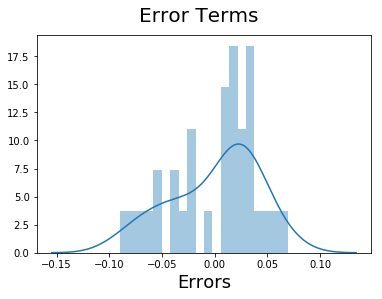

In [655]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  

    Making prediction

In [656]:
num_vars = df_test.columns
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [657]:
y_test = df_test.pop('gmv')
X_test = df_test

In [658]:
x_train_new.drop('const',axis=1,inplace=True)

In [659]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [660]:
# Making predictions
y_pred = lm.predict(X_test_new)

## MODEL EVALUATION

Text(0,0.5,'y_pred')

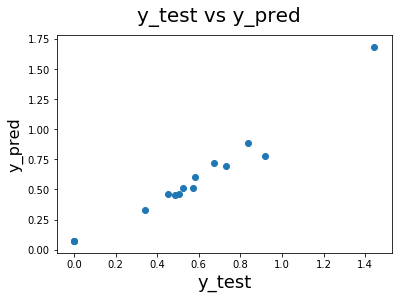

In [661]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)   

In [662]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

0.08327569102980101


RMSE for linear model is .08

## 2.LAG MODEL
Let's analyze the distributed lag model for gaming subcategory where the effect of regressor variables will be seen on gmv variable over a time lag rather than all at once.We will be doing it in one week lag and two week lag phase.

In [663]:
df_final_gam2 = df_final_gaming

In [664]:
df_final_gam2.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,1774,5.882834,716.0,3688.0,3.198651e+06,1,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
1,0,1,1764,5.875822,662.0,3292.0,2.928568e+06,2,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
2,1,0,2027,5.927028,1098.0,4315.0,4.442785e+06,3,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
3,0,0,1634,6.050099,644.0,2889.0,2.760808e+06,4,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
4,1,1,1794,5.911666,765.0,3401.0,2.859521e+06,5,48.052,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.000,0.0000,50.327406,1222.0,0.566667,2.769231,1.076923


In [665]:
df_final_gam2.shape

(49, 23)

In [666]:
df_final_gam2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 51
Data columns (total 23 columns):
special_sale       49 non-null int32
payday             49 non-null int32
pincode            49 non-null int64
sla                49 non-null float64
Prepaid            49 non-null float64
COD                49 non-null float64
gmv                49 non-null float64
week               49 non-null int64
Total              49 non-null float64
TV                 49 non-null float64
Digital            49 non-null float64
Sponsorship        49 non-null float64
ContentM           49 non-null float64
OnlineM            49 non-null float64
Affiliates         49 non-null float64
SEM                49 non-null float64
Radio              49 non-null float64
Other              49 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Mean Temp (°C)     49 non-null float64
Total Rain (mm)    49 non-null float64
Total Snow (cm)    49 non-null float64
dtypes: 

In [667]:
df_week_month.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 1 to 53
Data columns (total 3 columns):
Month    53 non-null int64
Year     53 non-null int64
week     53 non-null int64
dtypes: int64(3)
memory usage: 1.7 KB


In [668]:
df_week_month

,Month,Year,week
week_of_year,,,
1,1,2016,1
2,1,2016,2
3,1,2016,3
4,1,2016,4
5,2,2016,5
6,2,2016,6
7,2,2016,7
8,2,2016,8
9,3,2016,9


In [669]:
# Change the data type to add two digits for Month
df_week_month.week = df_week_month.week.astype(str).str.zfill(2)
df_week_month.Year = df_week_month.Year.astype(str)

In [670]:
df_week_month

,Month,Year,week
week_of_year,,,
1,1,2016,01
2,1,2016,02
3,1,2016,03
4,1,2016,04
5,2,2016,05
6,2,2016,06
7,2,2016,07
8,2,2016,08
9,3,2016,09


In [671]:
df_week_month.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 1 to 53
Data columns (total 3 columns):
Month    53 non-null int64
Year     53 non-null object
week     53 non-null object
dtypes: int64(1), object(2)
memory usage: 1.7+ KB


In [672]:
# Change the data type back to int
df_week_month['YearWeek'] = df_week_month['Year']+df_week_month['week']

In [673]:
df_week_month.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 1 to 53
Data columns (total 4 columns):
Month       53 non-null int64
Year        53 non-null object
week        53 non-null object
YearWeek    53 non-null object
dtypes: int64(1), object(3)
memory usage: 2.1+ KB


In [674]:
df_week_month.week = df_week_month.week.astype(int)
df_week_month.YearWeek = df_week_month.YearWeek.astype(int)

In [675]:
df_week_month.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53 entries, 1 to 53
Data columns (total 4 columns):
Month       53 non-null int64
Year        53 non-null object
week        53 non-null int32
YearWeek    53 non-null int32
dtypes: int32(2), int64(1), object(1)
memory usage: 1.7+ KB


In [676]:
df_gam_lag = pd.merge(df_final_gam2,df_week_month,how='inner',on=['week'])

In [677]:
df_gam_lag.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 48
Data columns (total 26 columns):
special_sale       49 non-null int32
payday             49 non-null int32
pincode            49 non-null int64
sla                49 non-null float64
Prepaid            49 non-null float64
COD                49 non-null float64
gmv                49 non-null float64
week               49 non-null int64
Total              49 non-null float64
TV                 49 non-null float64
Digital            49 non-null float64
Sponsorship        49 non-null float64
ContentM           49 non-null float64
OnlineM            49 non-null float64
Affiliates         49 non-null float64
SEM                49 non-null float64
Radio              49 non-null float64
Other              49 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Mean Temp (°C)     49 non-null float64
Total Rain (mm)    49 non-null float64
Total Snow (cm)    49 non-null float64
Month   

In [678]:
df_gam_lag.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm),Month,Year,YearWeek
0,0,0,1774,5.882834,716.0,3688.0,3.198651e+06,1,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,1,2016,201601
1,0,1,1764,5.875822,662.0,3292.0,2.928568e+06,2,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,1,2016,201602
2,1,0,2027,5.927028,1098.0,4315.0,4.442785e+06,3,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,1,2016,201603
3,0,0,1634,6.050099,644.0,2889.0,2.760808e+06,4,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,1,2016,201604
4,1,1,1794,5.911666,765.0,3401.0,2.859521e+06,5,48.052,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.000,0.0000,50.327406,1222.0,0.566667,2.769231,1.076923,2,2016,201605


In [679]:
df_gam_lag.drop(['week','Month','Year','Total'],axis=1,inplace=True)

In [680]:
df_gam_lag.sort_values(by='YearWeek')

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm),YearWeek
25,1,1,1293,5.252059,666.0,2127.0,2.110114e+06,0.043066,0.506603,1.482854,0.000187,0.265456,0.109451,1.004739,0.0000,0.000000,54.599588,1177.0,21.976923,1.492593,0.000000,201529
26,0,0,1160,5.333333,576.0,1977.0,2.395418e+06,0.043066,0.506603,1.482854,0.000187,0.265456,0.109451,1.004739,0.0000,0.000000,54.599588,1177.0,21.976923,1.492593,0.000000,201530
27,0,1,956,5.573003,363.0,1452.0,1.662390e+06,0.003863,0.766844,0.637999,0.000004,0.077547,0.044210,1.508117,0.0000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201531
28,0,0,5,6.400000,1.0,4.0,2.644000e+03,0.003863,0.766844,0.637999,0.000004,0.077547,0.044210,1.508117,0.0000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201532
29,0,0,4,6.000000,1.0,3.0,4.875000e+03,0.003863,0.766844,0.637999,0.000004,0.077547,0.044210,1.508117,0.0000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201533
30,0,0,3,2.666667,0.0,3.0,8.870000e+02,0.003863,0.766844,0.637999,0.000004,0.077547,0.044210,1.508117,0.0000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201534
31,1,0,4,6.000000,0.0,4.0,2.303000e+03,0.003863,0.766844,0.637999,0.000004,0.077547,0.044210,1.508117,0.0000,0.000000,59.987101,1206.0,22.915789,3.580000,0.000000,201535
32,0,1,1343,5.151309,574.0,2215.0,2.124564e+06,0.581926,0.203479,9.418148,0.091544,2.456998,0.755740,0.930322,0.0000,0.000000,46.925419,1101.0,20.913333,3.518182,0.000000,201536
33,0,0,1208,5.496568,563.0,2059.0,2.223160e+06,0.581926,0.203479,9.418148,0.091544,2.456998,0.755740,0.930322,0.0000,0.000000,46.925419,1101.0,20.913333,3.518182,0.000000,201537
34,0,1,1221,5.772142,594.0,2048.0,2.358819e+06,0.581926,0.203479,9.418148,0.091544,2.456998,0.755740,0.930322,0.0000,0.000000,46.925419,1101.0,20.913333,3.518182,0.000000,201538


<B> ONE WEEK LAG </B>

In [681]:
df_gam_lag_1wk = df_gam_lag.set_index(["YearWeek"]).shift(1)

In [682]:
df_gam_lag_1wk.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
YearWeek,,,,,,,,,,,,,,,,,,,,,
201601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201602,0.0,0.0,1774.0,5.882834,716.0,3688.0,3.198651e+06,0.657,0.0684,0.63,0.135,3.435,1.1055,0.63,0.405,4.0635,47.093031,1052.0,-1.828571,3.12,0.7
201603,0.0,1.0,1764.0,5.875822,662.0,3292.0,2.928568e+06,0.657,0.0684,0.63,0.135,3.435,1.1055,0.63,0.405,4.0635,47.093031,1052.0,-1.828571,3.12,0.7
201604,1.0,0.0,2027.0,5.927028,1098.0,4315.0,4.442785e+06,0.657,0.0684,0.63,0.135,3.435,1.1055,0.63,0.405,4.0635,47.093031,1052.0,-1.828571,3.12,0.7
201605,0.0,0.0,1634.0,6.050099,644.0,2889.0,2.760808e+06,0.657,0.0684,0.63,0.135,3.435,1.1055,0.63,0.405,4.0635,47.093031,1052.0,-1.828571,3.12,0.7


In [683]:
df_gam_lag.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm),YearWeek
0,0,0,1774,5.882834,716.0,3688.0,3.198651e+06,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,201601
1,0,1,1764,5.875822,662.0,3292.0,2.928568e+06,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,201602
2,1,0,2027,5.927028,1098.0,4315.0,4.442785e+06,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,201603
3,0,0,1634,6.050099,644.0,2889.0,2.760808e+06,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000,201604
4,1,1,1794,5.911666,765.0,3401.0,2.859521e+06,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.000,0.0000,50.327406,1222.0,0.566667,2.769231,1.076923,201605


In [684]:
#merge oneweek loag to original dataframe
df_gam_lag_1wk_final = pd.merge(df_gam_lag,df_gam_lag_1wk,how='inner',on=['YearWeek'],suffixes=['_Current','_Previous'])

In [685]:
df_gam_lag_1wk_final.shape

(49, 43)

In [686]:
df_gam_lag_1wk_final = df_gam_lag_1wk_final.dropna()

In [687]:
df_gam_lag_1wk_final.drop('gmv_Previous',axis=1,inplace=True)

In [688]:
df_gam_lag_1wk_final.shape

(48, 42)

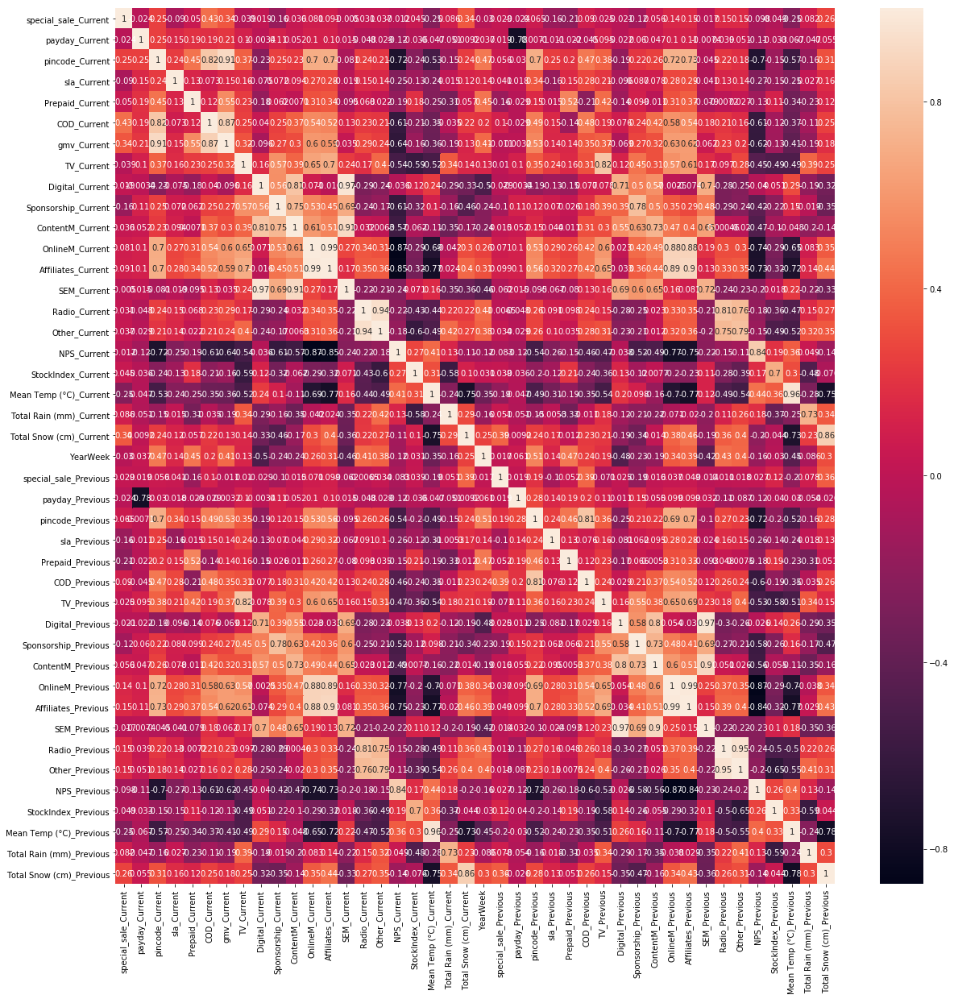

In [689]:
#CHECK FOR MULTICOLLINEARITY
plt.figure(figsize=(20,20))
sns.heatmap(df_gam_lag_1wk_final.corr(), annot=True)
plt.show()

### building model on lagged dataframe

In [690]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [691]:
# import sikit learn
from sklearn.model_selection import train_test_split
# divide data into train and test
df_train_lg1,df_test_lg1 = train_test_split(df_gam_lag_1wk_final,train_size=0.7,test_size=0.3,random_state=True)

In [692]:
print(df_train_lg1.shape)
print(df_test_lg1.shape)

(33, 42)
(15, 42)


In [693]:
num_vars = df_train_lg1.columns

df_train_lg1[num_vars] = scaler.fit_transform(df_train_lg1[num_vars])

In [694]:
num_vars

Index(['special_sale_Current', 'payday_Current', 'pincode_Current',
       'sla_Current', 'Prepaid_Current', 'COD_Current', 'gmv_Current',
       'TV_Current', 'Digital_Current', 'Sponsorship_Current',
       'ContentM_Current', 'OnlineM_Current', 'Affiliates_Current',
       'SEM_Current', 'Radio_Current', 'Other_Current', 'NPS_Current',
       'StockIndex_Current', 'Mean Temp (°C)_Current',
       'Total Rain (mm)_Current', 'Total Snow (cm)_Current', 'YearWeek',
       'special_sale_Previous', 'payday_Previous', 'pincode_Previous',
       'sla_Previous', 'Prepaid_Previous', 'COD_Previous', 'TV_Previous',
       'Digital_Previous', 'Sponsorship_Previous', 'ContentM_Previous',
       'OnlineM_Previous', 'Affiliates_Previous', 'SEM_Previous',
       'Radio_Previous', 'Other_Previous', 'NPS_Previous',
       'StockIndex_Previous', 'Mean Temp (°C)_Previous',
       'Total Rain (mm)_Previous', 'Total Snow (cm)_Previous'],
      dtype='object')

In [695]:
y_train = df_train_lg1.pop('gmv_Current')
x_train = df_train_lg1

In [696]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [697]:
rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]

In [698]:
col

Index(['Digital_Current', 'OnlineM_Current', 'Affiliates_Current',
       'SEM_Current', 'Mean Temp (°C)_Current', 'TV_Previous',
       'Digital_Previous', 'Sponsorship_Previous', 'OnlineM_Previous',
       'Affiliates_Previous'],
      dtype='object')

In [699]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.699
Model:                            OLS   Adj. R-squared:                  0.563
Method:                 Least Squares   F-statistic:                     5.121
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           0.000683
Time:                        23:25:55   Log-Likelihood:                 31.019
No. Observations:                  33   AIC:                            -40.04
Df Residuals:                      22   BIC:                            -23.58
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [700]:
#Dropping the column OnlineM_Current as p value > 0.05 and finding summary
x_train_new = x_train_rfe.drop(["TV_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.694
Model:                            OLS   Adj. R-squared:                  0.574
Method:                 Least Squares   F-statistic:                     5.783
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           0.000321
Time:                        23:25:55   Log-Likelihood:                 30.695
No. Observations:                  33   AIC:                            -41.39
Df Residuals:                      23   BIC:                            -26.42
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [701]:
#Dropping the column Radio_Previous as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["SEM_Current"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.686
Model:                            OLS   Adj. R-squared:                  0.582
Method:                 Least Squares   F-statistic:                     6.562
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           0.000149
Time:                        23:25:55   Log-Likelihood:                 30.309
No. Observations:                  33   AIC:                            -42.62
Df Residuals:                      24   BIC:                            -29.15
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [702]:
#Dropping the column Digital_Current as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["Digital_Current"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.676
Model:                            OLS   Adj. R-squared:                  0.585
Method:                 Least Squares   F-statistic:                     7.439
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.29e-05
Time:                        23:25:55   Log-Likelihood:                 29.759
No. Observations:                  33   AIC:                            -43.52
Df Residuals:                      25   BIC:                            -31.55
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [703]:
#Dropping the column Digital_Current as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["Affiliates_Current"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.541
Method:                 Least Squares   F-statistic:                     7.274
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           0.000123
Time:                        23:25:55   Log-Likelihood:                 27.439
No. Observations:                  33   AIC:                            -40.88
Df Residuals:                      26   BIC:                            -30.40
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [704]:
#Dropping the column Digital_Current as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["OnlineM_Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.596
Model:                            OLS   Adj. R-squared:                  0.521
Method:                 Least Squares   F-statistic:                     7.971
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           0.000102
Time:                        23:25:55   Log-Likelihood:                 26.142
No. Observations:                  33   AIC:                            -40.28
Df Residuals:                      27   BIC:                            -31.30
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [705]:
#Dropping the column Digital_Current as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["OnlineM_Current"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:            gmv_Current   R-squared:                       0.559
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     8.879
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.24e-05
Time:                        23:25:56   Log-Likelihood:                 24.696
No. Observations:                  33   AIC:                            -39.39
Df Residuals:                      28   BIC:                            -31.91
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [706]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,70.79
4,Affiliates_Previous,4.99
1,Mean Temp (°C)_Current,4.07
3,Sponsorship_Previous,3.13
2,Digital_Previous,1.87


## Residual Analysis of the train data
So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like

In [707]:
y_train_gmv = lm.predict(x_train_new)

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

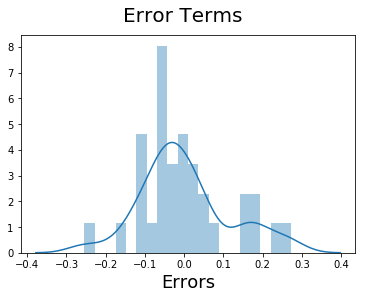

In [708]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)

In [709]:
num_vars = df_test_lg1.columns
df_test_lg1[num_vars] = scaler.transform(df_test_lg1[num_vars])


In [710]:
y_test = df_test_lg1.pop('gmv_Current')
X_test = df_test_lg1
x_train_new.drop('const',axis=1,inplace=True)

In [711]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [712]:
# Making predictions
y_pred = lm.predict(X_test_new)

Text(0,0.5,'y_pred')

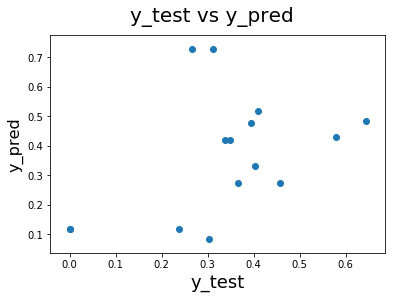

In [713]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16) 

In [714]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

0.2000171946957333


## TWO WEEK LAG MODEL

In [715]:
df_gam_lag2wk = df_gam_lag.set_index(["YearWeek"]).shift(2)

In [716]:
df_gam_lag1wk = df_gam_lag.set_index(["YearWeek"]).shift(1)

In [717]:
df_lag_2 = pd.merge(df_gam_lag2wk,df_gam_lag1wk,how='inner',on=['YearWeek'],suffixes=['_2Previous','_1Previous'])

In [718]:
df = pd.merge(df_gam_lag,df_lag_2,how='inner',on=['YearWeek'])

In [719]:
df = df.dropna() 

In [720]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47 entries, 2 to 48
Data columns (total 64 columns):
special_sale                 47 non-null int32
payday                       47 non-null int32
pincode                      47 non-null int64
sla                          47 non-null float64
Prepaid                      47 non-null float64
COD                          47 non-null float64
gmv                          47 non-null float64
TV                           47 non-null float64
Digital                      47 non-null float64
Sponsorship                  47 non-null float64
ContentM                     47 non-null float64
OnlineM                      47 non-null float64
Affiliates                   47 non-null float64
SEM                          47 non-null float64
Radio                        47 non-null float64
Other                        47 non-null float64
NPS                          47 non-null float64
StockIndex                   47 non-null float64
Mean Temp (°C)       

In [721]:
df.drop('gmv_1Previous',axis=1,inplace=True)
df.drop('gmv_2Previous',axis=1,inplace=True)

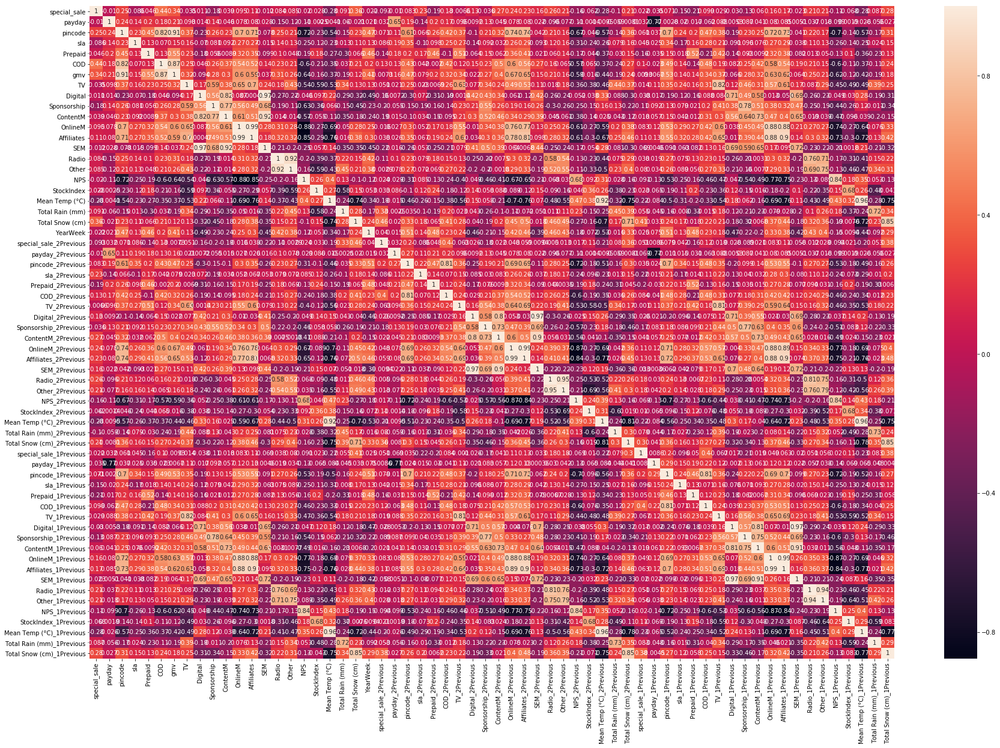

In [722]:
#CHECK FOR MULTICOLLINEARITY
plt.figure(figsize=(30,20))
sns.heatmap(df.corr(), annot=True)
plt.show()

### make linear model on 2 week lagged dataframea


In [723]:
# import sikit learn
from sklearn.model_selection import train_test_split
# divide data into train and test
df_train,df_test = train_test_split(df,train_size=0.7,test_size=0.3,random_state=True)
print(df_train.shape)
print(df_test.shape)

(32, 62)
(15, 62)


In [724]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
num_vars = df_train.columns
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
num_vars

Index(['special_sale', 'payday', 'pincode', 'sla', 'Prepaid', 'COD', 'gmv',
       'TV', 'Digital', 'Sponsorship', 'ContentM', 'OnlineM', 'Affiliates',
       'SEM', 'Radio', 'Other', 'NPS', 'StockIndex', 'Mean Temp (°C)',
       'Total Rain (mm)', 'Total Snow (cm)', 'YearWeek',
       'special_sale_2Previous', 'payday_2Previous', 'pincode_2Previous',
       'sla_2Previous', 'Prepaid_2Previous', 'COD_2Previous', 'TV_2Previous',
       'Digital_2Previous', 'Sponsorship_2Previous', 'ContentM_2Previous',
       'OnlineM_2Previous', 'Affiliates_2Previous', 'SEM_2Previous',
       'Radio_2Previous', 'Other_2Previous', 'NPS_2Previous',
       'StockIndex_2Previous', 'Mean Temp (°C)_2Previous',
       'Total Rain (mm)_2Previous', 'Total Snow (cm)_2Previous',
       'special_sale_1Previous', 'payday_1Previous', 'pincode_1Previous',
       'sla_1Previous', 'Prepaid_1Previous', 'COD_1Previous', 'TV_1Previous',
       'Digital_1Previous', 'Sponsorship_1Previous', 'ContentM_1Previous',
       'Onl

In [725]:
y_train = df_train.pop('gmv')
x_train = df_train
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
##### Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [726]:
rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)
col = x_train.columns[rfe.support_]
col

Index(['pincode', 'Prepaid', 'COD', 'ContentM_2Previous', 'OnlineM_2Previous',
       'Affiliates_2Previous', 'Digital_1Previous', 'OnlineM_1Previous',
       'SEM_1Previous', 'Total Rain (mm)_1Previous'],
      dtype='object')

In [727]:
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]

In [728]:
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.970
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                     67.37
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.16e-13
Time:                        23:27:00   Log-Likelihood:                 59.962
No. Observations:                  32   AIC:                            -97.92
Df Residuals:                      21   BIC:                            -81.80
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [729]:
#Dropping the column COD_2Previous as p value > 0.05 and finding summary
x_train_new = x_train_rfe.drop(["pincode"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.954
Method:                 Least Squares   F-statistic:                     71.72
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.23e-14
Time:                        23:27:00   Log-Likelihood:                 58.579
No. Observations:                  32   AIC:                            -97.16
Df Residuals:                      22   BIC:                            -82.50
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [730]:
#Dropping the column COD_2Previous as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["OnlineM_2Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.963
Model:                            OLS   Adj. R-squared:                  0.950
Method:                 Least Squares   F-statistic:                     73.90
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.44e-14
Time:                        23:27:00   Log-Likelihood:                 56.535
No. Observations:                  32   AIC:                            -95.07
Df Residuals:                      23   BIC:                            -81.88
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [731]:
#Dropping the column Affiliates_2Previous as p value > 0.05 and finding summary
x_train_new = x_train_new.drop(["Affiliates_2Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.962
Model:                            OLS   Adj. R-squared:                  0.952
Method:                 Least Squares   F-statistic:                     87.92
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.50e-15
Time:                        23:27:00   Log-Likelihood:                 56.499
No. Observations:                  32   AIC:                            -97.00
Df Residuals:                      24   BIC:                            -85.27
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [732]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X = x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,Digital_1Previous,62.86
6,SEM_1Previous,62.73
0,const,26.63
3,ContentM_2Previous,9.59
5,OnlineM_1Previous,7.86
7,Total Rain (mm)_1Previous,2.49
1,Prepaid,2.05
2,COD,2.05


In [733]:
#Dropping the column Digital_1Previous VIF is more 
x_train_new = x_train_new.drop(["Digital_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.932
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                     57.47
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.03e-13
Time:                        23:27:00   Log-Likelihood:                 47.086
No. Observations:                  32   AIC:                            -80.17
Df Residuals:                      25   BIC:                            -69.91
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [734]:
#Dropping the column OnlineM_1Previous as p-value is high
x_train_new = x_train_new.drop(["OnlineM_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.932
Model:                            OLS   Adj. R-squared:                  0.919
Method:                 Least Squares   F-statistic:                     71.62
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.30e-14
Time:                        23:27:00   Log-Likelihood:                 47.063
No. Observations:                  32   AIC:                            -82.13
Df Residuals:                      26   BIC:                            -73.33
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                 

In [735]:
#Dropping the column Total Rain (mm)_1Previouss as p-value is high
x_train_new = x_train_new.drop(["Total Rain (mm)_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.932
Model:                            OLS   Adj. R-squared:                  0.922
Method:                 Least Squares   F-statistic:                     92.85
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.25e-15
Time:                        23:27:01   Log-Likelihood:                 47.044
No. Observations:                  32   AIC:                            -84.09
Df Residuals:                      27   BIC:                            -76.76
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.0575      0

In [736]:
#Dropping the column ContentM_2Previous as p-value is high
x_train_new = x_train_new.drop(["ContentM_2Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                     126.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.16e-16
Time:                        23:27:01   Log-Likelihood:                 46.840
No. Observations:                  32   AIC:                            -85.68
Df Residuals:                      28   BIC:                            -79.82
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0480      0.031      1.553

In [737]:
#Dropping the column ContentM_2Previous as p-value is high
x_train_new = x_train_new.drop(["SEM_1Previous"], axis = 1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_lm = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_lm).fit()   # Running the linear model
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.931
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                     196.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.39e-17
Time:                        23:27:01   Log-Likelihood:                 46.812
No. Observations:                  32   AIC:                            -87.62
Df Residuals:                      29   BIC:                            -83.23
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0455      0.028      1.614      0.1

In [738]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
X =  x_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,7.34
1,Prepaid,1.04
2,COD,1.04


## Residual Analysis of the train data
So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like

In [739]:
y_train_gmv = lm.predict(x_train_new)

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

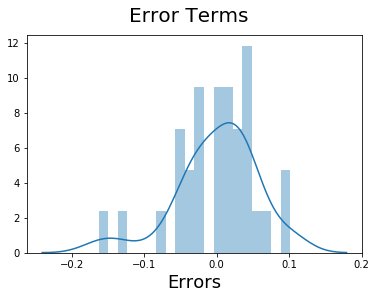

In [740]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)

In [741]:
num_vars = df_test.columns
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [742]:
y_test = df_test.pop('gmv')

In [743]:
X_test = df_test
x_train_new.drop('const',axis=1,inplace=True)

In [744]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)

In [745]:
# Making predictions
y_pred = lm.predict(X_test_new)

Text(0,0.5,'y_pred')

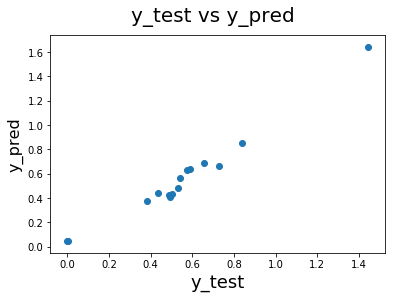

In [746]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)

In [747]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))

In [748]:
print(rms)

0.06951672390430473


RMSE for this model is .06

### 4. Koyck model for gaming accessory

In [770]:
df_final_gam3 = df_final_gaming

In [771]:
df_final_gam3.head()

,special_sale,payday,pincode,sla,Prepaid,COD,gmv,week,Total,TV,Digital,Sponsorship,ContentM,OnlineM,Affiliates,SEM,Radio,Other,NPS,StockIndex,Mean Temp (°C),Total Rain (mm),Total Snow (cm)
0,0,0,1774,5.882834,716.0,3688.0,3.198651e+06,1,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
1,0,1,1764,5.875822,662.0,3292.0,2.928568e+06,2,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
2,1,0,2027,5.927028,1098.0,4315.0,4.442785e+06,3,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
3,0,0,1634,6.050099,644.0,2889.0,2.760808e+06,4,74.196,0.657000,0.068400,0.630000,0.135000,3.435000,1.105500,0.630000,0.405,4.0635,47.093031,1052.0,-1.828571,3.120000,0.700000
4,1,1,1794,5.911666,765.0,3401.0,2.859521e+06,5,48.052,0.387901,0.286898,1.758833,0.089516,2.983855,0.969753,0.731044,0.000,0.0000,50.327406,1222.0,0.566667,2.769231,1.076923


In [772]:
gmv_week_one = df_final_gam3.gmv.shift(1)

In [773]:
gmv_week_one.shape

(49,)

In [774]:
df_final_gam3.shape

(49, 23)

In [775]:
df_final_gam3['gmv_lag_one'] = gmv_week_one

In [776]:
df_final_gam3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 49 entries, 0 to 51
Data columns (total 24 columns):
special_sale       49 non-null int32
payday             49 non-null int32
pincode            49 non-null int64
sla                49 non-null float64
Prepaid            49 non-null float64
COD                49 non-null float64
gmv                49 non-null float64
week               49 non-null int64
Total              49 non-null float64
TV                 49 non-null float64
Digital            49 non-null float64
Sponsorship        49 non-null float64
ContentM           49 non-null float64
OnlineM            49 non-null float64
Affiliates         49 non-null float64
SEM                49 non-null float64
Radio              49 non-null float64
Other              49 non-null float64
NPS                49 non-null float64
StockIndex         49 non-null float64
Mean Temp (°C)     49 non-null float64
Total Rain (mm)    49 non-null float64
Total Snow (cm)    49 non-null float64
gmv_lag_

In [777]:
df_final_gam3 = df_final_gam3.dropna()

In [778]:
# import Scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [779]:
# import sikit learn
from sklearn.model_selection import train_test_split

In [780]:
# divide data into train and test
df_train,df_test = train_test_split(df_final_gam3,train_size=0.7,test_size=0.3,random_state=True)

In [781]:
print(df_train.shape)
print(df_test.shape)

(33, 24)
(15, 24)


In [782]:
num_vars = ['pincode', 'sla', 'Prepaid', 'COD', 'gmv',
       'week', 'Total', 'TV', 'Digital', 'Sponsorship', 'ContentM', 'OnlineM',
       'Affiliates', 'SEM', 'Radio', 'Other', 'NPS', 'StockIndex',
       'Mean Temp (°C)', 'Total Rain (mm)', 'Total Snow (cm)', 'gmv_lag_one']

In [783]:
#scale and transform
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

num_vars

['pincode',
 'sla',
 'Prepaid',
 'COD',
 'gmv',
 'week',
 'Total',
 'TV',
 'Digital',
 'Sponsorship',
 'ContentM',
 'OnlineM',
 'Affiliates',
 'SEM',
 'Radio',
 'Other',
 'NPS',
 'StockIndex',
 'Mean Temp (°C)',
 'Total Rain (mm)',
 'Total Snow (cm)',
 'gmv_lag_one']

In [784]:
y_train = df_train.pop('gmv')
x_train = df_train

In [785]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [786]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(x_train, y_train)

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(x_train, y_train)

In [787]:
list(zip(x_train.columns,rfe.support_,rfe.ranking_))

[('special_sale', False, 14),
 ('payday', False, 11),
 ('pincode', False, 12),
 ('sla', False, 10),
 ('Prepaid', True, 1),
 ('COD', True, 1),
 ('week', False, 2),
 ('Total', True, 1),
 ('TV', False, 6),
 ('Digital', True, 1),
 ('Sponsorship', False, 9),
 ('ContentM', False, 3),
 ('OnlineM', True, 1),
 ('Affiliates', True, 1),
 ('SEM', True, 1),
 ('Radio', True, 1),
 ('Other', True, 1),
 ('NPS', True, 1),
 ('StockIndex', False, 5),
 ('Mean Temp (°C)', False, 4),
 ('Total Rain (mm)', False, 8),
 ('Total Snow (cm)', False, 7),
 ('gmv_lag_one', False, 13)]

In [788]:
col = x_train.columns[rfe.support_]
# Creating X_test dataframe with RFE selected variables
x_train_rfe = x_train[col]
# Adding a constant variable 
import statsmodels.api as sm  
x_train_rfe = sm.add_constant(x_train_rfe)
lm = sm.OLS(y_train,x_train_rfe).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     92.38
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.35e-15
Time:                        23:32:23   Log-Likelihood:                 73.239
No. Observations:                  33   AIC:                            -124.5
Df Residuals:                      22   BIC:                            -108.0
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1580      0.078      2.017      0.0

In [789]:
# dropping digital as its p-value is more
x_train_new = x_train_rfe.drop('Digital',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     107.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.30e-16
Time:                        23:32:50   Log-Likelihood:                 73.188
No. Observations:                  33   AIC:                            -126.4
Df Residuals:                      23   BIC:                            -111.4
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1690      0.065      2.616      0.0

In [790]:
# dropp affiliates as its p-value is more
x_train_new = x_train_new.drop('Affiliates',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     124.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.21e-17
Time:                        23:33:17   Log-Likelihood:                 73.062
No. Observations:                  33   AIC:                            -128.1
Df Residuals:                      24   BIC:                            -114.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1859      0.050      3.743      0.0

In [791]:
# dropp other as its p-value is more
x_train_new = x_train_new.drop('Other',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.970
Method:                 Least Squares   F-statistic:                     148.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.56e-19
Time:                        23:33:35   Log-Likelihood:                 73.057
No. Observations:                  33   AIC:                            -130.1
Df Residuals:                      25   BIC:                            -118.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1881      0.042      4.475      0.0

In [792]:
# dropp other as its p-value is more
x_train_new = x_train_new.drop('SEM',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.975
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     169.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.41e-19
Time:                        23:34:24   Log-Likelihood:                 72.119
No. Observations:                  33   AIC:                            -130.2
Df Residuals:                      26   BIC:                            -119.8
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2057      0.040      5.172      0.0

In [793]:
# dropp other as its p-value is more
x_train_new = x_train_new.drop('Total',axis=1)
# Adding a constant variable 
import statsmodels.api as sm  
x_train_new = sm.add_constant(x_train_new)
lm = sm.OLS(y_train,x_train_new).fit()
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:                    gmv   R-squared:                       0.973
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     196.9
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.33e-20
Time:                        23:35:03   Log-Likelihood:                 70.971
No. Observations:                  33   AIC:                            -129.9
Df Residuals:                      27   BIC:                            -121.0
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2143      0.040      5.373      0.0

C:\Users\Rahul\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


Text(0.5,0,'Errors')

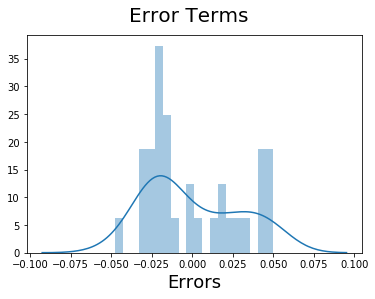

In [794]:
y_train_gmv = lm.predict(x_train_new)
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_gmv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)  

In [795]:
df_test[num_vars] = scaler.transform(df_test[num_vars])

In [796]:
y_test = df_test.pop('gmv')
X_test = df_test
x_train_new.drop('const',axis=1,inplace=True)

In [797]:
# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[x_train_new.columns]

Text(0,0.5,'y_pred')

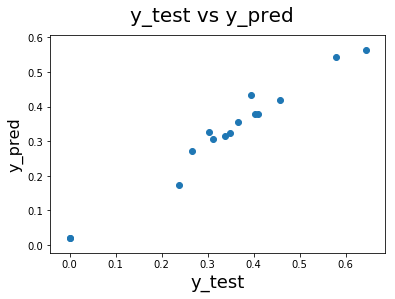

In [800]:
# Adding a constant variable 
X_test_new = sm.add_constant(X_test_new)
# Making predictions
y_pred = lm.predict(X_test_new)
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16) 

In [801]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

0.03552305742258443


RMSE for Koyck model is 0.3552